In [70]:
import json
import numpy as np
import pandas as pd
from pathlib import Path
import os
import sys
import warnings
from utils import *
import matplotlib.pyplot as plt
import seaborn as sns

warnings.simplefilter('ignore')

sys.path.append('../../utilities')
sys.path.append('../../models/grt123')
sys.path.append('../../models/grt123/training')
sys.path.append('../../models/grt123/preprocessing/')

# from layers import nms,iou
from summit_utils import SummitScan, xyz2irc
from evaluation import noduleCADEvaluation

workspace_path = Path(os.getcwd()).parent.parent


In [71]:
flavour = 'female_for_inference'

# Scan Metadata

In [72]:

def set_is_actionable(row):
    if row['radiology_report_management_plan_final'] in ['3_MONTH_FOLLOW_UP_SCAN','URGENT_REFERRAL', 'ALWAYS_SCAN_AT_YEAR_1']:
        return 'Actonable'
    else:
        return 'Non-Actionable'

def set_smoking_pack_years_cats(df):
    df[df['smoking_pack_years'] < 0] = np.nan
    return pd.qcut(df['smoking_pack_years'], 3, labels=['Low (15-35)', 'Medium (35-50)', 'High (50+)'])

person_data = pd.read_csv(
    f'{workspace_path}/data/summit/data/person_data.csv',
    usecols=['LDCT_RADIOLOGY_REPORT_main_participant_id', 'lung_health_check_clinical_smoking_pack_years', 'ocd_DeprivationScore_IMDRank']
).rename(columns={
    'lung_health_check_clinical_smoking_pack_years':'smoking_pack_years',
    'ocd_DeprivationScore_IMDRank':'deprivation_score'
}).assign(
    smoking_pack_years_cats=lambda df: set_smoking_pack_years_cats(df),
    IMDRank_tertile=lambda df: pd.qcut(df['deprivation_score'], 3, labels=['Low', 'Medium', 'High']),
    IMDRank_quintile=lambda df: pd.qcut(df['deprivation_score'], 5, labels=['Low', 'Low-Medium', 'Medium', 'Medium-High', 'High']),
)
                          
scan_metadata = (
    pd.read_csv(f'{workspace_path}/metadata/summit/{flavour}/test_scans_metadata.csv')
    .assign(name=lambda df: df['LDCT_RADIOLOGY_REPORT_main_participant_id'] + '_Y0_BASELINE_A')
    .assign(is_actionable=lambda df: df.apply(set_is_actionable, axis=1))
    .assign(gender_is_actionable=lambda df: df.apply(set_gender_is_actionable, axis=1))    
    .assign(gender_is_not_actionable=lambda df: df.apply(set_gender_is_not_actionable, axis=1))    
    .assign(ethnic_group_is_actionable=lambda df: df.apply(set_ethnic_group_is_actionable, axis=1))    
    .assign(ethnic_group_is_not_actionable=lambda df: df.apply(set_ethnic_group_is_not_actionable, axis=1))    
    .rename(columns={
        'participant_details_gender':'gender',
        'lung_health_check_demographics_race_ethnicgroup':'ethnic_group'
    })
).merge(person_data, on='LDCT_RADIOLOGY_REPORT_main_participant_id')
scan_metadata = (
    scan_metadata
    .assign(smoking_pack_years_is_actionable=lambda df: df.apply(set_smoking_pack_years_is_actionable, axis=1))
    .assign(imdrank_is_actionable=lambda df: df.apply(set_imdrank_is_actionable, axis=1))    
)

In [73]:

for col in scan_metadata.columns:
    if col.lower().find('age')>-1:
        print(col)

radiology_report_management_plan_algorithm_recommendation
radiology_report_management_plan_final
radiology_report_management_plan_recommendation_comment
participant_details_age
lung_health_check_smoking_cigarillos_start_age
lung_health_check_smoking_cigarillos_stop_age
lung_health_check_smoking_cigars_start_age
lung_health_check_smoking_cigars_stop_age
lung_health_check_smoking_history_age_started_smoking
lung_health_check_smoking_history_age_stopped_smoking
lung_health_check_smoking_marijuana_start_age
lung_health_check_smoking_marijuana_stop_age
lung_health_check_smoking_pipe_start_age
lung_health_check_smoking_pipe_stop_age
lung_health_check_smoking_waterpipe_start_age
lung_health_check_smoking_waterpipe_stop_age
participant_age_at_consent
participant_age_at_consent_cats


## GRT123

NOT-UPPER       1322
UPPER           1151
NOT_ANSWERED     516
Name: nodule_site_combined, dtype: int64

/Users/john/Projects/SOTAEvaluationNoduleDetection/models/grt123/bbox_result/trained_summit/summit/female_for_inference/female_for_inference_metadata.csv
Total number of included nodule annotations: 2989
Total number of nodule annotations: 2989
Cases: 2337
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: 2448
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-5854-bku_Y0_BASELINE_A, nodule Annot ID: 1507
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: 1802
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6225-qvf_Y0_BASELINE_A, nodule Annot ID: 1561


100%|██████████| 1000/1000 [06:46<00:00,  2.46it/s]


,0,159,476,1111,2381,4920,9999
0,0.158 (0.14 - 0.176),0.231 (0.212 - 0.252),0.331 (0.309 - 0.355),0.446 (0.422 - 0.472),0.557 (0.533 - 0.584),0.664 (0.643 - 0.689),0.76 (0.741 - 0.778)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.158,0.140,0.176
159,0.250,0.231,0.212,0.252
476,0.500,0.331,0.309,0.355
1111,1.000,0.446,0.422,0.472
2381,2.000,0.557,0.533,0.584
4920,4.000,0.664,0.643,0.689
9999,8.000,0.760,0.741,0.778


Mean Sensitivity: 0.45 Low Sensitivity: 0.43 High Sensitivity: 0.472


,True positives,2543
0,False positives,117084.000
1,False negatives,446.000
2,True negatives,0.000
3,Total number of candidates,119695.000
4,Total number of nodules,2989.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,72.000
7,Sensitivity,0.851
8,Average number of candidates per scan,51.217


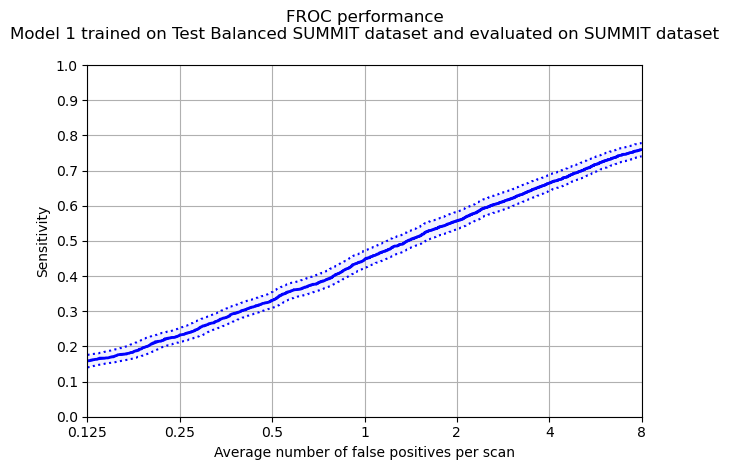

In [74]:
# Add in diameter cuts for later analysis
def combine_site(nodule_site):
    if nodule_site.find('UPPER') > -1:
        return 'UPPER'
    elif nodule_site.find('NOT') > -1:
        return 'NOT_ANSWERED'
    else:
        return 'NOT-UPPER'
    
def combine_site2(nodule_site):
    if nodule_site.find('RIGHT') > -1:
        return 'RIGHT'
    elif nodule_site.find('LEFT') > -1:
        return 'LEFT'
    else:
        return 'NOT_ANSWERED'

diameter_cats = [0, 4, 8, 15, 20, 30, 40, 999]
diameter_lbs = [f'{diameter_cats[i]:02}-{diameter_cats[i+1]:02}' for i in range(len(diameter_cats))[:-1]]

annotations = (
    pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv')
    .assign(diameter_cats=lambda df: 
        pd.cut(
            df['nodule_diameter_mm'], 
            bins=diameter_cats,
            labels=diameter_lbs
        )            
    )
    .assign(nodule_site_combined=lambda df: df['nodule_site'].apply(combine_site))
    .assign(nodule_site_combined2=lambda df: df['nodule_site'].apply(combine_site2))
)

display(annotations.nodule_site_combined.value_counts())

# save back to the metadata file
annotations.to_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv', index=False)
grt123_summit_summit = noduleCADEvaluation(
    annotations_filename=f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv',
    annotations_excluded_filename=f'{workspace_path}/data/summit/metadata/grt123_annotations_excluded_empty.csv',
    seriesuids_filename=f'{workspace_path}/metadata/summit/{flavour}/test_scans.csv',
    results_filename=f"{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_predictions.csv",    
    filter='\nModel 1 trained on Test Balanced SUMMIT dataset and evaluated on SUMMIT dataset\n',
    outputDir=f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}',
)
caluclate_cpm_from_bootstrapping(f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/froc_{flavour}_predictions_bootstrapping.csv')
show_metrics(f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/CADAnalysis.txt')

### Gender analysis

Protected Group: FEMALE


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,29.0,47.0,7.0,7.0,10.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp9u1q0zuk/annotations.csv
Total number of included nodule annotations: 2975
Total number of nodule annotations: 2975
Cases: 2317
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: 2448
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-5854-bku_Y0_BASELINE_A, nodule Annot ID: 1507
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: 1802
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6225-qvf_Y0_BASELINE_A, nodule Annot ID: 1561


100%|██████████| 1000/1000 [07:06<00:00,  2.35it/s]


,0,159,476,1111,2381,4920,9999
0,0.159 (0.141 - 0.176),0.232 (0.212 - 0.252),0.332 (0.309 - 0.355),0.446 (0.421 - 0.471),0.557 (0.531 - 0.582),0.663 (0.639 - 0.688),0.759 (0.739 - 0.779)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.159,0.141,0.176
159,0.250,0.232,0.212,0.252
476,0.500,0.332,0.309,0.355
1111,1.000,0.446,0.421,0.471
2381,2.000,0.557,0.531,0.582
4920,4.000,0.663,0.639,0.688
9999,8.000,0.759,0.739,0.779


Mean Sensitivity: 0.45 Low Sensitivity: 0.43 High Sensitivity: 0.472


,True positives,2530
0,False positives,116137.000
1,False negatives,445.000
2,True negatives,0.000
3,Total number of candidates,118735.000
4,Total number of nodules,2975.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,72.000
7,Sensitivity,0.850
8,Average number of candidates per scan,51.245


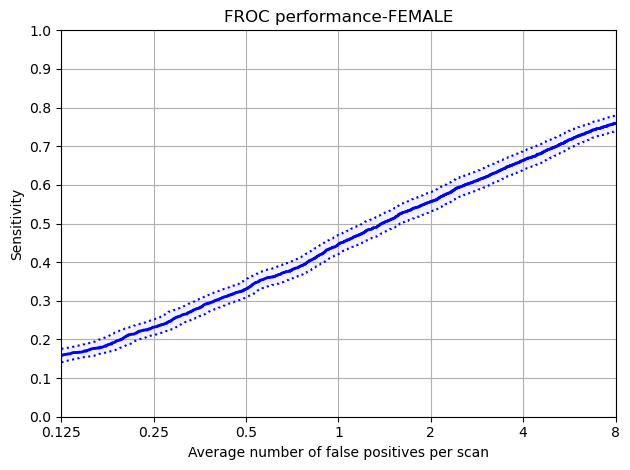

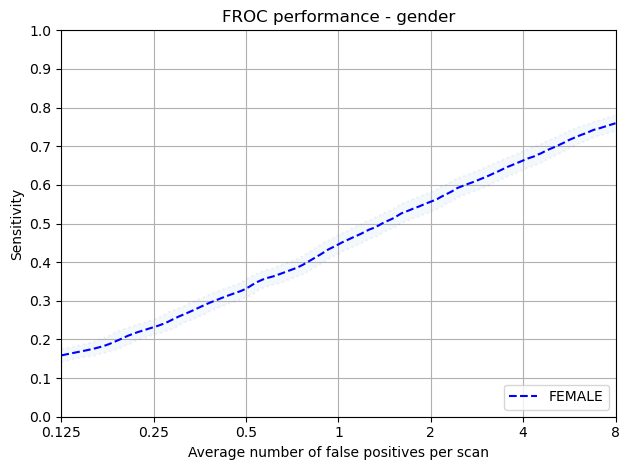

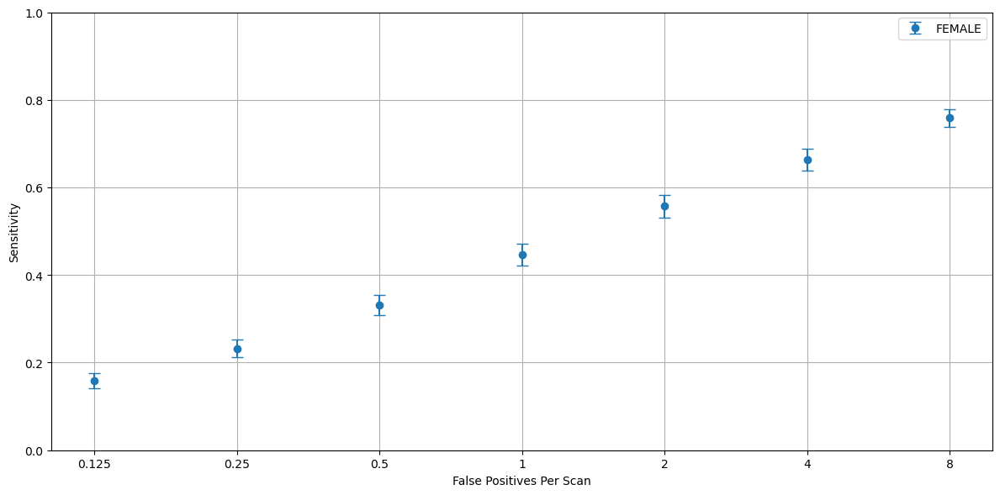

In [75]:

annotations_excluded = pd.read_csv(f'{workspace_path}/data/summit/metadata/grt123_annotations_excluded_empty.csv')

annotations = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv')

predictions = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_predictions.csv')

protected_group = 'gender'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('grt123', flavour, 'Gender', data_dict)

### Age Analysis

Protected Group: 70-75


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,32.0,47.0,7.0,8.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpald6djwu/annotations.csv
Total number of included nodule annotations: 735
Total number of nodule annotations: 735
Cases: 561
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: 1802


100%|██████████| 1000/1000 [01:10<00:00, 14.20it/s]


,0,159,476,1111,2381,4920,9999
0,0.193 (0.152 - 0.233),0.254 (0.213 - 0.295),0.35 (0.308 - 0.394),0.455 (0.41 - 0.498),0.568 (0.525 - 0.611),0.673 (0.638 - 0.711),0.768 (0.738 - 0.799)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.193,0.152,0.233
159,0.250,0.254,0.213,0.295
476,0.500,0.350,0.308,0.394
1111,1.000,0.455,0.410,0.498
2381,2.000,0.568,0.525,0.611
4920,4.000,0.673,0.638,0.711
9999,8.000,0.768,0.738,0.799


Mean Sensitivity: 0.47 Low Sensitivity: 0.43 High Sensitivity: 0.506


,True positives,645
0,False positives,28576.000
1,False negatives,90.000
2,True negatives,0.000
3,Total number of candidates,29241.000
4,Total number of nodules,735.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,21.000
7,Sensitivity,0.878
8,Average number of candidates per scan,52.123


Protected Group: 60-64


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,25.0,48.0,8.0,9.0,10.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpw8yz66au/annotations.csv
Total number of included nodule annotations: 788
Total number of nodule annotations: 788
Cases: 556


100%|██████████| 1000/1000 [00:54<00:00, 18.43it/s]


,0,159,476,1111,2381,4920,9999
0,0.157 (0.126 - 0.191),0.218 (0.179 - 0.26),0.315 (0.266 - 0.361),0.421 (0.37 - 0.468),0.53 (0.474 - 0.581),0.631 (0.578 - 0.68),0.74 (0.7 - 0.777)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.157,0.126,0.191
159,0.250,0.218,0.179,0.260
476,0.500,0.315,0.266,0.361
1111,1.000,0.421,0.370,0.468
2381,2.000,0.530,0.474,0.581
4920,4.000,0.631,0.578,0.680
9999,8.000,0.740,0.700,0.777


Mean Sensitivity: 0.43 Low Sensitivity: 0.38 High Sensitivity: 0.474


,True positives,662
0,False positives,27498.000
1,False negatives,126.000
2,True negatives,0.000
3,Total number of candidates,28177.000
4,Total number of nodules,788.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,17.000
7,Sensitivity,0.840
8,Average number of candidates per scan,50.678


Protected Group: 55-59


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,28.0,57.0,5.0,4.0,6.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpxe3wtuse/annotations.csv
Total number of included nodule annotations: 487
Total number of nodule annotations: 487
Cases: 507
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-5854-bku_Y0_BASELINE_A, nodule Annot ID: 1507


100%|██████████| 1000/1000 [00:42<00:00, 23.46it/s]


,0,159,476,1111,2381,4920,9999
0,0.169 (0.128 - 0.21),0.278 (0.223 - 0.332),0.393 (0.337 - 0.45),0.527 (0.473 - 0.58),0.644 (0.594 - 0.697),0.749 (0.7 - 0.797),0.837 (0.801 - 0.873)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.169,0.128,0.210
159,0.250,0.278,0.223,0.332
476,0.500,0.393,0.337,0.450
1111,1.000,0.527,0.473,0.580
2381,2.000,0.644,0.594,0.697
4920,4.000,0.749,0.700,0.797
9999,8.000,0.837,0.801,0.873


Mean Sensitivity: 0.51 Low Sensitivity: 0.47 High Sensitivity: 0.563


,True positives,431
0,False positives,24541.000
1,False negatives,56.000
2,True negatives,0.000
3,Total number of candidates,24983.000
4,Total number of nodules,487.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,12.000
7,Sensitivity,0.885
8,Average number of candidates per scan,49.276


Protected Group: 75+


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,41.0,31.0,8.0,10.0,10.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpy0q8_qeb/annotations.csv
Total number of included nodule annotations: 193
Total number of nodule annotations: 193
Cases: 129
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: 2448


100%|██████████| 1000/1000 [00:07<00:00, 130.98it/s]


,0,159,476,1111,2381,4920,9999
0,0.15 (0.082 - 0.236),0.233 (0.153 - 0.328),0.352 (0.275 - 0.444),0.445 (0.359 - 0.536),0.541 (0.462 - 0.627),0.635 (0.548 - 0.723),0.716 (0.637 - 0.794)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.150,0.082,0.236
159,0.250,0.233,0.153,0.328
476,0.500,0.352,0.275,0.444
1111,1.000,0.445,0.359,0.536
2381,2.000,0.541,0.462,0.627
4920,4.000,0.635,0.548,0.723
9999,8.000,0.716,0.637,0.794


Mean Sensitivity: 0.44 Low Sensitivity: 0.36 High Sensitivity: 0.527


,True positives,163
0,False positives,6733.000
1,False negatives,30.000
2,True negatives,0.000
3,Total number of candidates,6897.000
4,Total number of nodules,193.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,2.000
7,Sensitivity,0.845
8,Average number of candidates per scan,53.465


Protected Group: 65-69


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,27.0,46.0,5.0,6.0,15.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp7ll0b6ok/annotations.csv
Total number of included nodule annotations: 772
Total number of nodule annotations: 772
Cases: 568
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6225-qvf_Y0_BASELINE_A, nodule Annot ID: 1561


100%|██████████| 1000/1000 [00:44<00:00, 22.49it/s]


,0,159,476,1111,2381,4920,9999
0,0.125 (0.095 - 0.154),0.198 (0.155 - 0.236),0.294 (0.252 - 0.335),0.415 (0.364 - 0.461),0.521 (0.47 - 0.569),0.643 (0.594 - 0.688),0.732 (0.685 - 0.774)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.125,0.095,0.154
159,0.250,0.198,0.155,0.236
476,0.500,0.294,0.252,0.335
1111,1.000,0.415,0.364,0.461
2381,2.000,0.521,0.470,0.569
4920,4.000,0.643,0.594,0.688
9999,8.000,0.732,0.685,0.774


Mean Sensitivity: 0.42 Low Sensitivity: 0.37 High Sensitivity: 0.46


,True positives,629
0,False positives,28789.000
1,False negatives,143.000
2,True negatives,0.000
3,Total number of candidates,29437.000
4,Total number of nodules,772.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,20.000
7,Sensitivity,0.815
8,Average number of candidates per scan,51.826


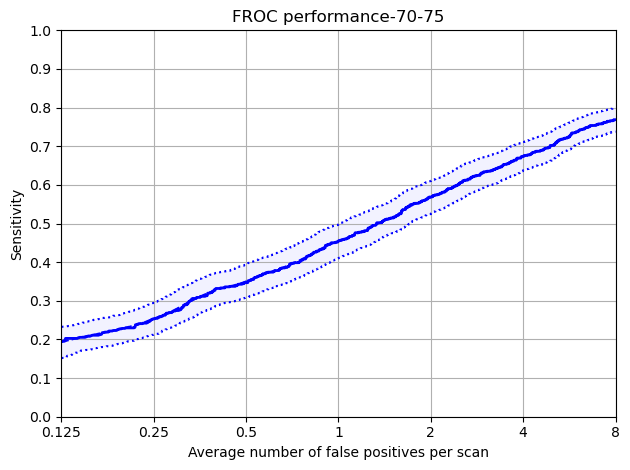

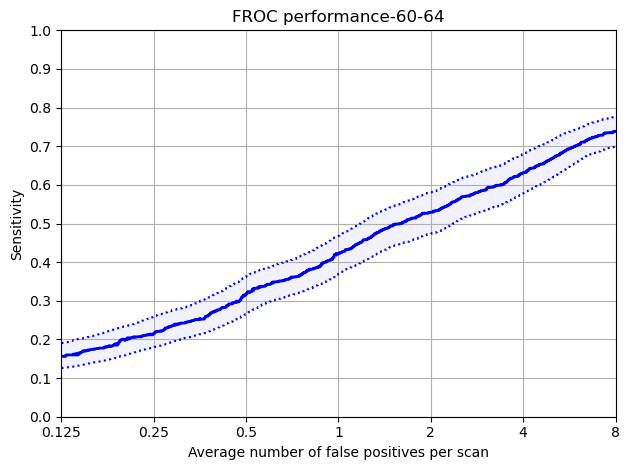

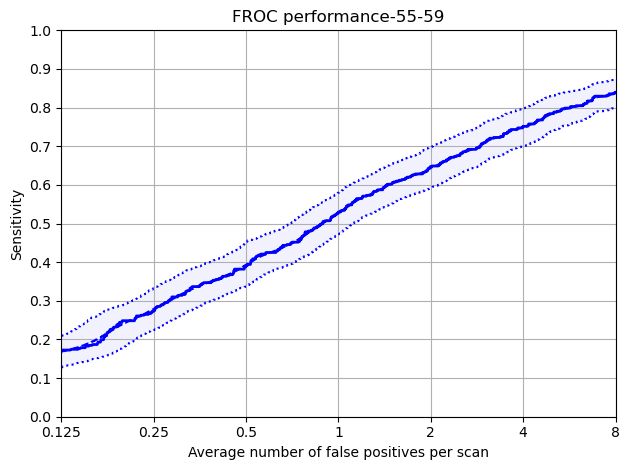

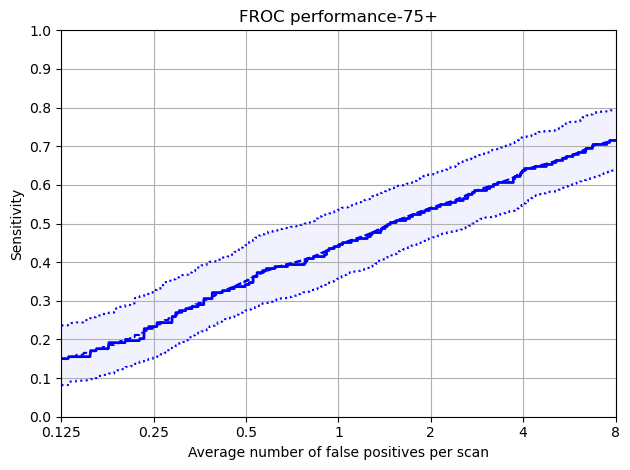

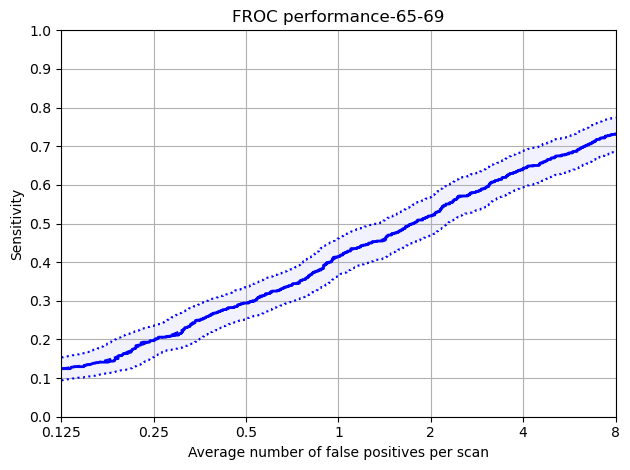

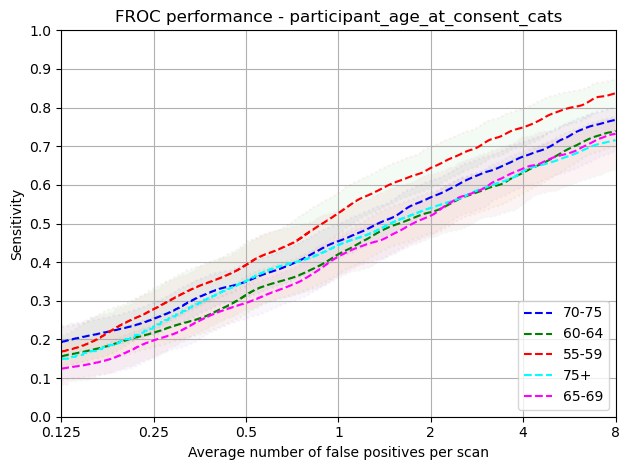

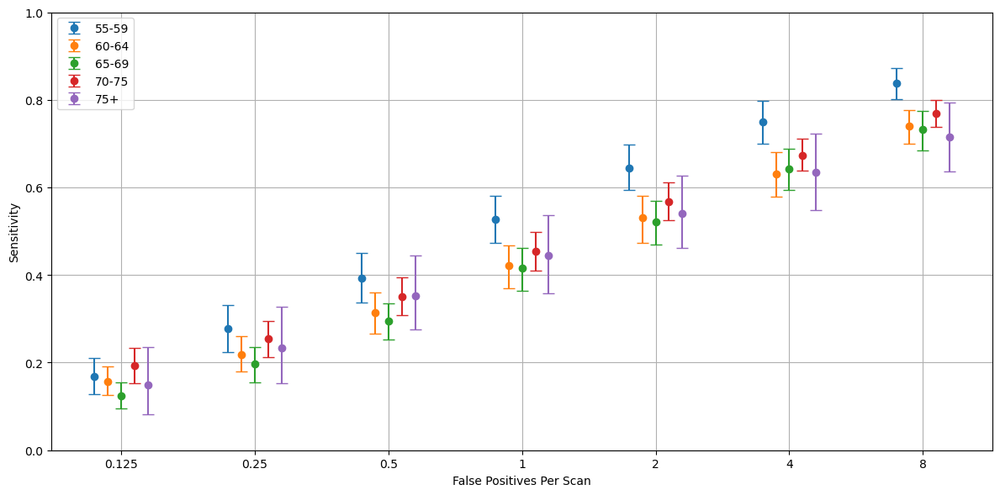

In [76]:
protected_group = 'participant_age_at_consent_cats'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('grt123', flavour, 'Age', data_dict, ['55-59','60-64','65-69','70-75','75+'])

In [77]:
data_dict

{'70-75':        mean_sens  low_sens  high_sens
 fps                                  
 0.125      0.193     0.152      0.233
 0.250      0.254     0.213      0.295
 0.500      0.350     0.308      0.394
 1.000      0.455     0.410      0.498
 2.000      0.568     0.525      0.611
 4.000      0.673     0.638      0.711
 8.000      0.768     0.738      0.799,
 '60-64':        mean_sens  low_sens  high_sens
 fps                                  
 0.125      0.157     0.126      0.191
 0.250      0.218     0.179      0.260
 0.500      0.315     0.266      0.361
 1.000      0.421     0.370      0.468
 2.000      0.530     0.474      0.581
 4.000      0.631     0.578      0.680
 8.000      0.740     0.700      0.777,
 '55-59':        mean_sens  low_sens  high_sens
 fps                                  
 0.125      0.169     0.128      0.210
 0.250      0.278     0.223      0.332
 0.500      0.393     0.337      0.450
 1.000      0.527     0.473      0.580
 2.000      0.644     0.594      0.

### Ethnicity analysis

Protected Group: White


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,28.0,47.0,7.0,7.0,10.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpnn7y06bo/annotations.csv
Total number of included nodule annotations: 2636
Total number of nodule annotations: 2636
Cases: 1974
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: 2448
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-5854-bku_Y0_BASELINE_A, nodule Annot ID: 1507
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: 1802
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6225-qvf_Y0_BASELINE_A, nodule Annot ID: 1561


100%|██████████| 1000/1000 [05:24<00:00,  3.09it/s]


,0,159,476,1111,2381,4920,9999
0,0.162 (0.142 - 0.181),0.235 (0.213 - 0.258),0.338 (0.312 - 0.364),0.449 (0.422 - 0.477),0.562 (0.533 - 0.588),0.667 (0.639 - 0.693),0.759 (0.736 - 0.781)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.162,0.142,0.181
159,0.250,0.235,0.213,0.258
476,0.500,0.338,0.312,0.364
1111,1.000,0.449,0.422,0.477
2381,2.000,0.562,0.533,0.588
4920,4.000,0.667,0.639,0.693
9999,8.000,0.759,0.736,0.781


Mean Sensitivity: 0.45 Low Sensitivity: 0.43 High Sensitivity: 0.477


,True positives,2239
0,False positives,101018.000
1,False negatives,397.000
2,True negatives,0.000
3,Total number of candidates,103323.000
4,Total number of nodules,2636.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,70.000
7,Sensitivity,0.849
8,Average number of candidates per scan,52.342


Protected Group: Other ethnic groups


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,32.0,36.0,4.0,15.0,13.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpsw2vplfe/annotations.csv
Total number of included nodule annotations: 47
Total number of nodule annotations: 47
Cases: 58


100%|██████████| 1000/1000 [00:04<00:00, 232.92it/s]


,0,159,476,1111,2381,4920,9999
0,0.088 (0.0 - 0.217),0.135 (0.024 - 0.27),0.192 (0.071 - 0.35),0.353 (0.167 - 0.56),0.473 (0.289 - 0.667),0.586 (0.417 - 0.769),0.707 (0.545 - 0.875)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.088,0.000,0.217
159,0.250,0.135,0.024,0.270
476,0.500,0.192,0.071,0.350
1111,1.000,0.353,0.167,0.560
2381,2.000,0.473,0.289,0.667
4920,4.000,0.586,0.417,0.769
9999,8.000,0.707,0.545,0.875


Mean Sensitivity: 0.36 Low Sensitivity: 0.22 High Sensitivity: 0.53


,True positives,37
0,False positives,2604.000
1,False negatives,10.000
2,True negatives,0.000
3,Total number of candidates,2641.000
4,Total number of nodules,47.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.787
8,Average number of candidates per scan,45.534


Protected Group: Black


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,33.0,56.0,4.0,4.0,5.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpkf_54dd3/annotations.csv
Total number of included nodule annotations: 169
Total number of nodule annotations: 169
Cases: 171


100%|██████████| 1000/1000 [00:15<00:00, 62.87it/s]


,0,159,476,1111,2381,4920,9999
0,0.15 (0.076 - 0.241),0.264 (0.178 - 0.352),0.347 (0.258 - 0.452),0.469 (0.353 - 0.589),0.556 (0.43 - 0.688),0.676 (0.561 - 0.779),0.798 (0.733 - 0.867)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.150,0.076,0.241
159,0.250,0.264,0.178,0.352
476,0.500,0.347,0.258,0.452
1111,1.000,0.469,0.353,0.589
2381,2.000,0.556,0.430,0.688
4920,4.000,0.676,0.561,0.779
9999,8.000,0.798,0.733,0.867


Mean Sensitivity: 0.47 Low Sensitivity: 0.37 High Sensitivity: 0.567


,True positives,152
0,False positives,7241.000
1,False negatives,17.000
2,True negatives,0.000
3,Total number of candidates,7393.000
4,Total number of nodules,169.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.899
8,Average number of candidates per scan,43.234


Protected Group: Asian or Asian British


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,23.0,49.0,5.0,16.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpwm6ijg_m/annotations.csv
Total number of included nodule annotations: 57
Total number of nodule annotations: 57
Cases: 58


100%|██████████| 1000/1000 [00:03<00:00, 258.45it/s]


,0,159,476,1111,2381,4920,9999
0,0.124 (0.033 - 0.236),0.155 (0.057 - 0.271),0.195 (0.09 - 0.317),0.27 (0.149 - 0.41),0.489 (0.367 - 0.619),0.557 (0.431 - 0.684),0.704 (0.567 - 0.833)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.124,0.033,0.236
159,0.250,0.155,0.057,0.271
476,0.500,0.195,0.090,0.317
1111,1.000,0.270,0.149,0.410
2381,2.000,0.489,0.367,0.619
4920,4.000,0.557,0.431,0.684
9999,8.000,0.704,0.567,0.833


Mean Sensitivity: 0.36 Low Sensitivity: 0.24 High Sensitivity: 0.481


,True positives,44
0,False positives,2423.000
1,False negatives,13.000
2,True negatives,0.000
3,Total number of candidates,2467.000
4,Total number of nodules,57.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.772
8,Average number of candidates per scan,42.534


Protected Group: Mixed


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,41.0,42.0,3.0,6.0,8.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp9ugswiw6/annotations.csv
Total number of included nodule annotations: 66
Total number of nodule annotations: 66
Cases: 60


100%|██████████| 1000/1000 [00:04<00:00, 220.73it/s]


,0,159,476,1111,2381,4920,9999
0,0.147 (0.045 - 0.295),0.224 (0.08 - 0.432),0.367 (0.192 - 0.596),0.476 (0.264 - 0.698),0.562 (0.341 - 0.8),0.701 (0.521 - 0.889),0.812 (0.65 - 0.949)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.147,0.045,0.295
159,0.250,0.224,0.080,0.432
476,0.500,0.367,0.192,0.596
1111,1.000,0.476,0.264,0.698
2381,2.000,0.562,0.341,0.800
4920,4.000,0.701,0.521,0.889
9999,8.000,0.812,0.650,0.949


Mean Sensitivity: 0.47 Low Sensitivity: 0.3 High Sensitivity: 0.666


,True positives,58
0,False positives,2851.000
1,False negatives,8.000
2,True negatives,0.000
3,Total number of candidates,2911.000
4,Total number of nodules,66.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,2.000
7,Sensitivity,0.879
8,Average number of candidates per scan,48.517


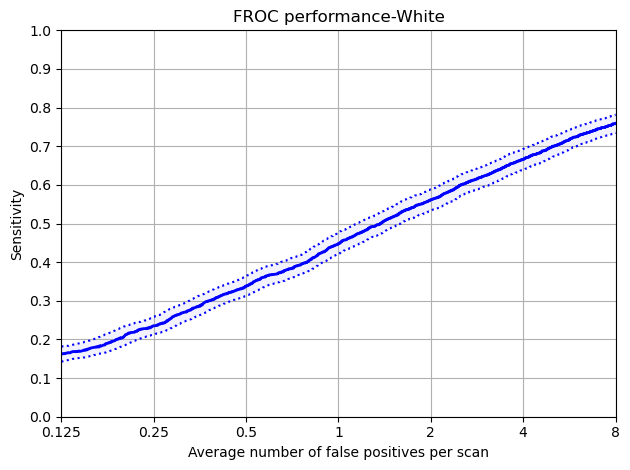

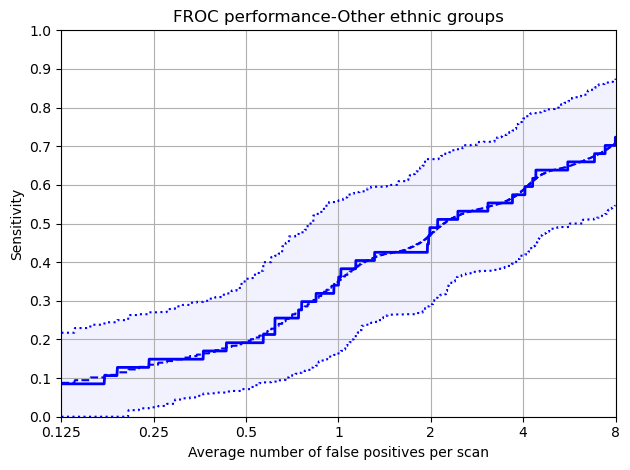

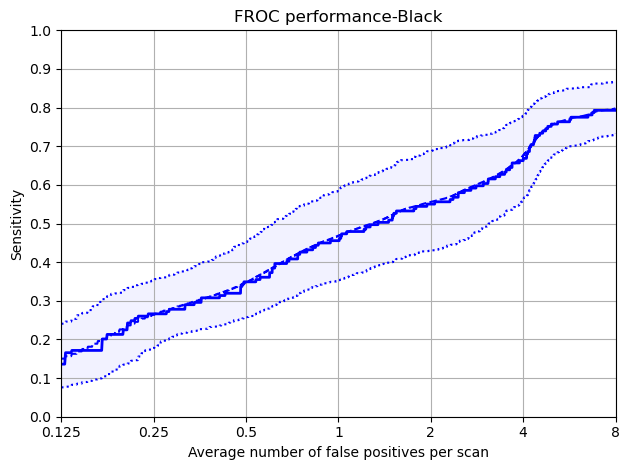

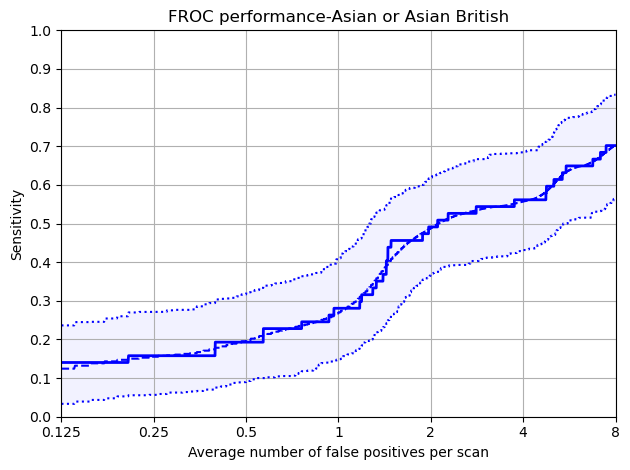

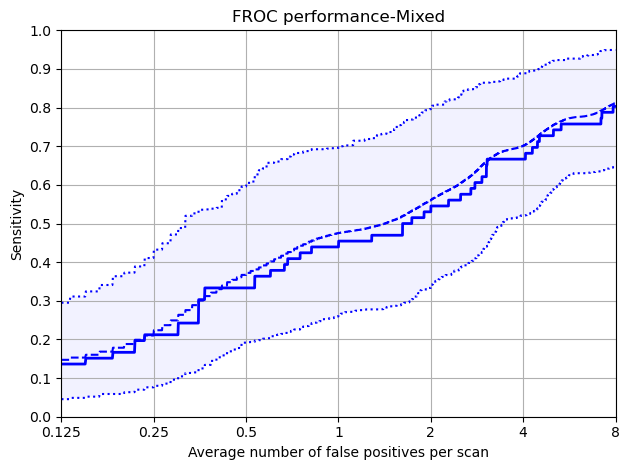

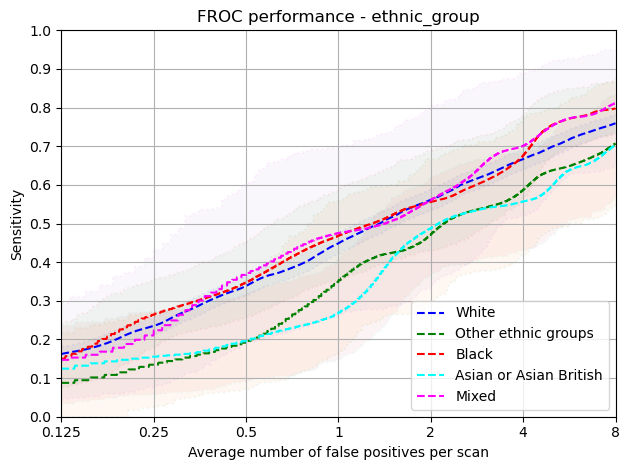

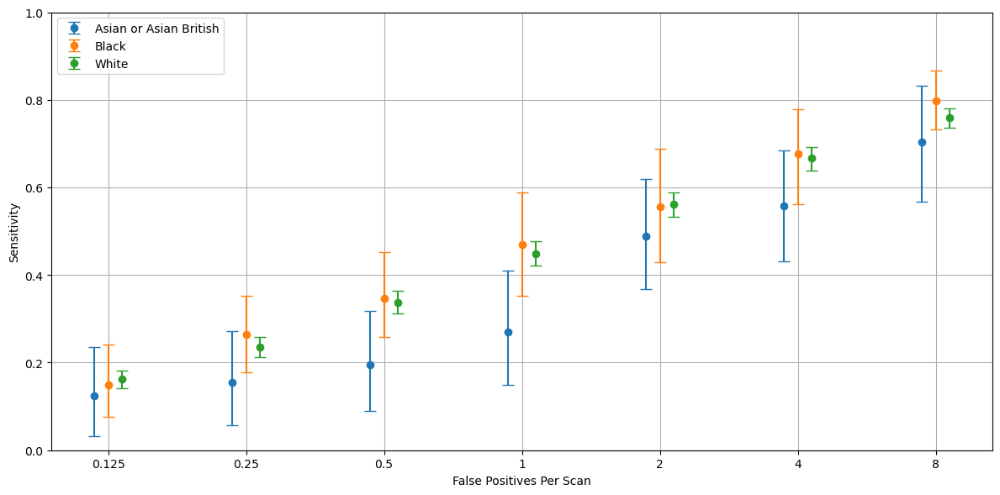

In [78]:
protected_group = 'ethnic_group'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('grt123', flavour,'Ethnic Group', data_dict, order=['Asian or Asian British','Black','White'])

### IMDRank_tertile

Protected Group: Low


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,30.0,45.0,6.0,7.0,12.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp92ck3kik/annotations.csv
Total number of included nodule annotations: 962
Total number of nodule annotations: 962
Cases: 754


100%|██████████| 1000/1000 [01:42<00:00,  9.77it/s]


,0,159,476,1111,2381,4920,9999
0,0.156 (0.129 - 0.186),0.245 (0.206 - 0.281),0.337 (0.3 - 0.379),0.45 (0.408 - 0.492),0.58 (0.538 - 0.624),0.679 (0.638 - 0.722),0.772 (0.732 - 0.81)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.156,0.129,0.186
159,0.250,0.245,0.206,0.281
476,0.500,0.337,0.300,0.379
1111,1.000,0.450,0.408,0.492
2381,2.000,0.580,0.538,0.624
4920,4.000,0.679,0.638,0.722
9999,8.000,0.772,0.732,0.810


Mean Sensitivity: 0.46 Low Sensitivity: 0.42 High Sensitivity: 0.499


,True positives,827
0,False positives,37966.000
1,False negatives,135.000
2,True negatives,0.000
3,Total number of candidates,38812.000
4,Total number of nodules,962.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,19.000
7,Sensitivity,0.860
8,Average number of candidates per scan,51.475


Protected Group: High


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,26.0,48.0,7.0,9.0,10.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpfdnsh3gy/annotations.csv
Total number of included nodule annotations: 1043
Total number of nodule annotations: 1043
Cases: 793


100%|██████████| 1000/1000 [01:38<00:00, 10.19it/s]


,0,159,476,1111,2381,4920,9999
0,0.161 (0.131 - 0.193),0.231 (0.192 - 0.271),0.323 (0.284 - 0.365),0.429 (0.39 - 0.469),0.521 (0.479 - 0.562),0.64 (0.602 - 0.678),0.742 (0.712 - 0.774)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.161,0.131,0.193
159,0.250,0.231,0.192,0.271
476,0.500,0.323,0.284,0.365
1111,1.000,0.429,0.390,0.469
2381,2.000,0.521,0.479,0.562
4920,4.000,0.640,0.602,0.678
9999,8.000,0.742,0.712,0.774


Mean Sensitivity: 0.44 Low Sensitivity: 0.4 High Sensitivity: 0.473


,True positives,868
0,False positives,40052.000
1,False negatives,175.000
2,True negatives,0.000
3,Total number of candidates,40946.000
4,Total number of nodules,1043.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,26.000
7,Sensitivity,0.832
8,Average number of candidates per scan,51.634


Protected Group: Medium


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,31.0,50.0,6.0,5.0,9.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpalw6_fgt/annotations.csv
Total number of included nodule annotations: 960
Total number of nodule annotations: 960
Cases: 751
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: 2448
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-5854-bku_Y0_BASELINE_A, nodule Annot ID: 1507
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: 1802
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6225-qvf_Y0_BASELINE_A, nodule Annot ID: 1561


100%|██████████| 1000/1000 [01:32<00:00, 10.87it/s]


,0,159,476,1111,2381,4920,9999
0,0.162 (0.131 - 0.196),0.224 (0.192 - 0.259),0.342 (0.296 - 0.388),0.458 (0.412 - 0.504),0.573 (0.529 - 0.614),0.672 (0.633 - 0.71),0.764 (0.733 - 0.795)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.162,0.131,0.196
159,0.250,0.224,0.192,0.259
476,0.500,0.342,0.296,0.388
1111,1.000,0.458,0.412,0.504
2381,2.000,0.573,0.529,0.614
4920,4.000,0.672,0.633,0.710
9999,8.000,0.764,0.733,0.795


Mean Sensitivity: 0.46 Low Sensitivity: 0.42 High Sensitivity: 0.495


,True positives,825
0,False positives,37209.000
1,False negatives,135.000
2,True negatives,0.000
3,Total number of candidates,38057.000
4,Total number of nodules,960.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,27.000
7,Sensitivity,0.859
8,Average number of candidates per scan,50.675


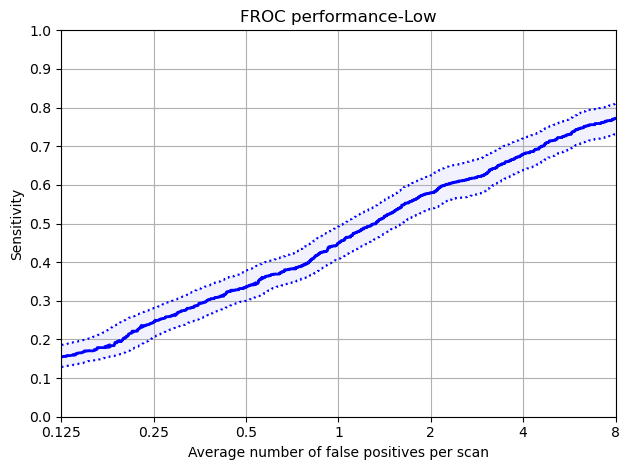

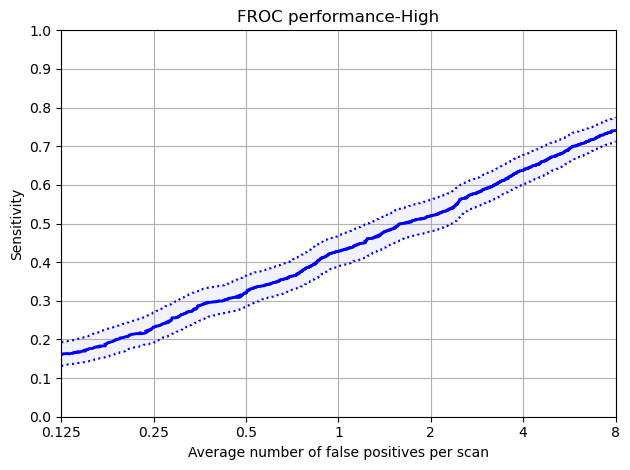

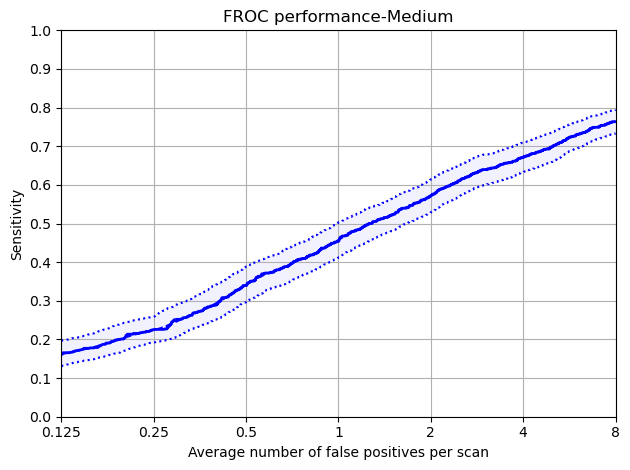

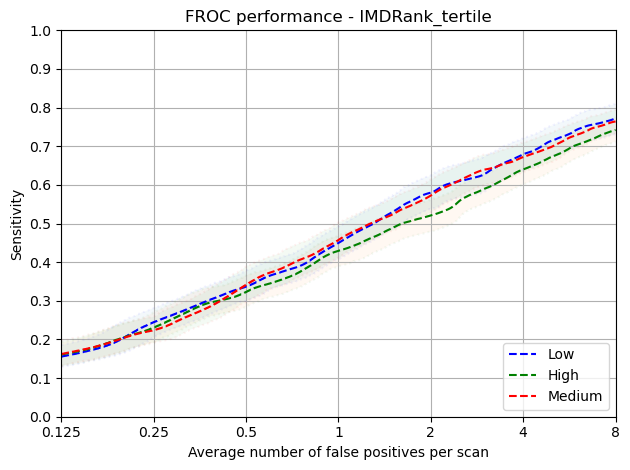

In [79]:
protected_group = 'IMDRank_tertile'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)

### Smoking Pack Years


Protected Group: High (50+)


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,29.0,43.0,6.0,8.0,14.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp55v9n3q8/annotations.csv
Total number of included nodule annotations: 766
Total number of nodule annotations: 766
Cases: 573
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-5854-bku_Y0_BASELINE_A, nodule Annot ID: 1507


100%|██████████| 1000/1000 [01:09<00:00, 14.37it/s]


,0,159,476,1111,2381,4920,9999
0,0.157 (0.124 - 0.193),0.226 (0.182 - 0.268),0.323 (0.277 - 0.368),0.438 (0.392 - 0.484),0.582 (0.531 - 0.63),0.695 (0.648 - 0.738),0.773 (0.724 - 0.816)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.157,0.124,0.193
159,0.250,0.226,0.182,0.268
476,0.500,0.323,0.277,0.368
1111,1.000,0.438,0.392,0.484
2381,2.000,0.582,0.531,0.630
4920,4.000,0.695,0.648,0.738
9999,8.000,0.773,0.724,0.816


Mean Sensitivity: 0.46 Low Sensitivity: 0.41 High Sensitivity: 0.5


,True positives,655
0,False positives,29817.000
1,False negatives,111.000
2,True negatives,0.000
3,Total number of candidates,30485.000
4,Total number of nodules,766.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,14.000
7,Sensitivity,0.855
8,Average number of candidates per scan,53.202


Protected Group: Low (15-35)


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,28.0,50.0,6.0,6.0,10.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpticvo9y8/annotations.csv
Total number of included nodule annotations: 1156
Total number of nodule annotations: 1156
Cases: 919
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: 2448


100%|██████████| 1000/1000 [01:48<00:00,  9.24it/s]


,0,159,476,1111,2381,4920,9999
0,0.149 (0.125 - 0.176),0.23 (0.198 - 0.264),0.342 (0.307 - 0.376),0.449 (0.414 - 0.484),0.55 (0.515 - 0.586),0.658 (0.623 - 0.692),0.753 (0.725 - 0.782)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.149,0.125,0.176
159,0.250,0.230,0.198,0.264
476,0.500,0.342,0.307,0.376
1111,1.000,0.449,0.414,0.484
2381,2.000,0.550,0.515,0.586
4920,4.000,0.658,0.623,0.692
9999,8.000,0.753,0.725,0.782


Mean Sensitivity: 0.45 Low Sensitivity: 0.42 High Sensitivity: 0.48


,True positives,974
0,False positives,45381.000
1,False negatives,182.000
2,True negatives,0.000
3,Total number of candidates,46378.000
4,Total number of nodules,1156.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,24.000
7,Sensitivity,0.843
8,Average number of candidates per scan,50.466


Protected Group: Medium (35-50)


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,30.0,47.0,8.0,8.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpi3d86me8/annotations.csv
Total number of included nodule annotations: 1053
Total number of nodule annotations: 1053
Cases: 827
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: 1802
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6225-qvf_Y0_BASELINE_A, nodule Annot ID: 1561


100%|██████████| 1000/1000 [01:49<00:00,  9.11it/s]


,0,159,476,1111,2381,4920,9999
0,0.17 (0.137 - 0.203),0.237 (0.2 - 0.276),0.333 (0.292 - 0.378),0.441 (0.396 - 0.486),0.546 (0.497 - 0.591),0.648 (0.606 - 0.687),0.76 (0.726 - 0.791)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.170,0.137,0.203
159,0.250,0.237,0.200,0.276
476,0.500,0.333,0.292,0.378
1111,1.000,0.441,0.396,0.486
2381,2.000,0.546,0.497,0.591
4920,4.000,0.648,0.606,0.687
9999,8.000,0.760,0.726,0.791


Mean Sensitivity: 0.45 Low Sensitivity: 0.41 High Sensitivity: 0.487


,True positives,901
0,False positives,40939.000
1,False negatives,152.000
2,True negatives,0.000
3,Total number of candidates,41872.000
4,Total number of nodules,1053.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,34.000
7,Sensitivity,0.856
8,Average number of candidates per scan,50.631


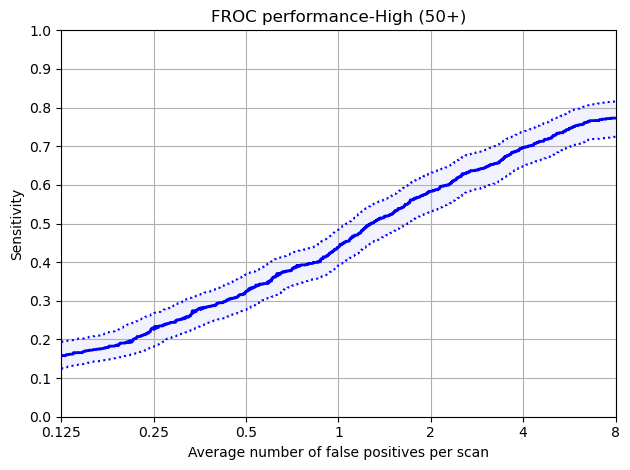

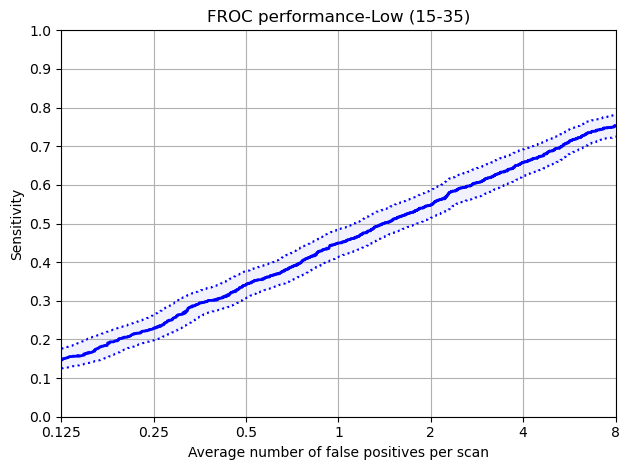

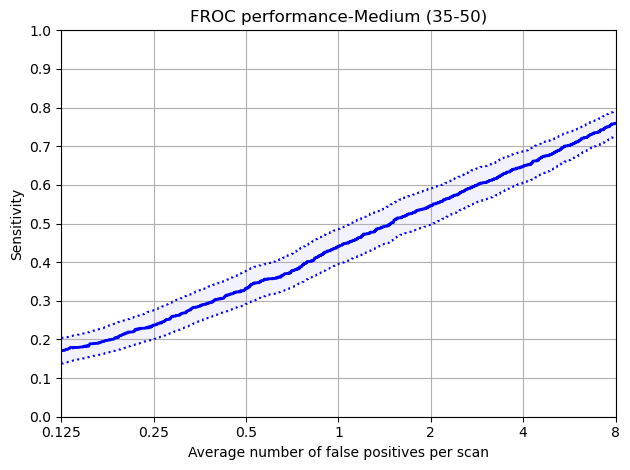

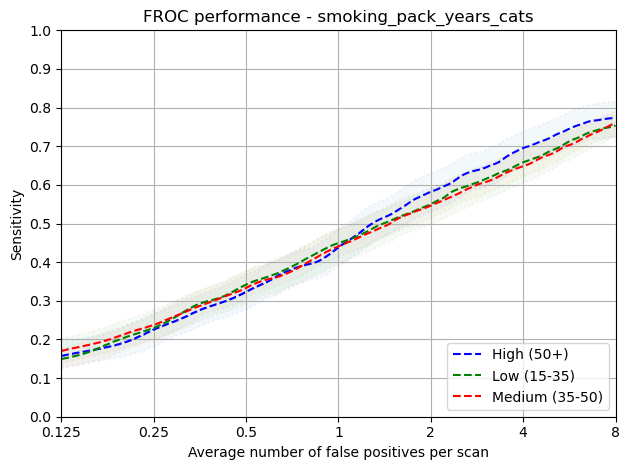

In [80]:
protected_group = 'smoking_pack_years_cats'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable Vs Non-Actionable

Protected Group: Non-Actionable


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,14.0,85.0,1.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp3rhaxnwh/annotations.csv
Total number of included nodule annotations: 971
Total number of nodule annotations: 971
Cases: 1544
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: 1802


100%|██████████| 1000/1000 [03:29<00:00,  4.78it/s]


,0,159,476,1111,2381,4920,9999
0,0.159 (0.132 - 0.186),0.256 (0.224 - 0.289),0.373 (0.337 - 0.409),0.497 (0.461 - 0.531),0.61 (0.579 - 0.641),0.728 (0.699 - 0.756),0.811 (0.787 - 0.835)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.159,0.132,0.186
159,0.250,0.256,0.224,0.289
476,0.500,0.373,0.337,0.409
1111,1.000,0.497,0.461,0.531
2381,2.000,0.610,0.579,0.641
4920,4.000,0.728,0.699,0.756
9999,8.000,0.811,0.787,0.835


Mean Sensitivity: 0.49 Low Sensitivity: 0.46 High Sensitivity: 0.521


,True positives,838
0,False positives,76223.000
1,False negatives,133.000
2,True negatives,0.000
3,Total number of candidates,77062.000
4,Total number of nodules,971.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,2.000
7,Sensitivity,0.863
8,Average number of candidates per scan,49.911


Protected Group: Actonable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,36.0,29.0,10.0,10.0,15.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpp_r5h3vs/annotations.csv
Total number of included nodule annotations: 2004
Total number of nodule annotations: 2004
Cases: 774
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: 2448
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-5854-bku_Y0_BASELINE_A, nodule Annot ID: 1507
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6225-qvf_Y0_BASELINE_A, nodule Annot ID: 1561


100%|██████████| 1000/1000 [01:49<00:00,  9.10it/s]


,0,159,476,1111,2381,4920,9999
0,0.158 (0.134 - 0.185),0.22 (0.196 - 0.246),0.309 (0.281 - 0.341),0.418 (0.387 - 0.453),0.524 (0.491 - 0.558),0.623 (0.595 - 0.655),0.727 (0.699 - 0.752)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.158,0.134,0.185
159,0.250,0.220,0.196,0.246
476,0.500,0.309,0.281,0.341
1111,1.000,0.418,0.387,0.453
2381,2.000,0.524,0.491,0.558
4920,4.000,0.623,0.595,0.655
9999,8.000,0.727,0.699,0.752


Mean Sensitivity: 0.43 Low Sensitivity: 0.4 High Sensitivity: 0.456


,True positives,1692
0,False positives,39914.000
1,False negatives,312.000
2,True negatives,0.000
3,Total number of candidates,41673.000
4,Total number of nodules,2004.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,70.000
7,Sensitivity,0.844
8,Average number of candidates per scan,53.841


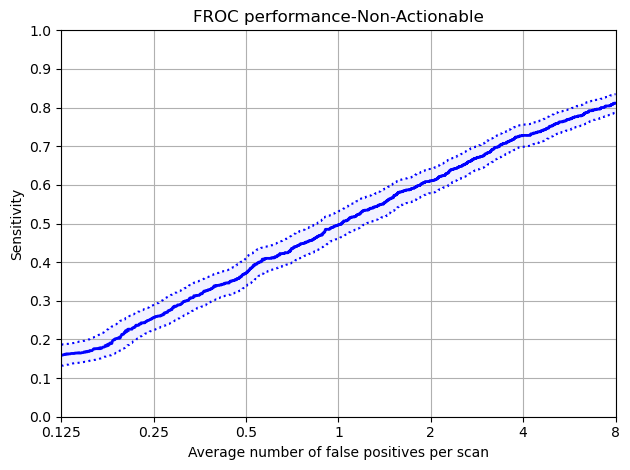

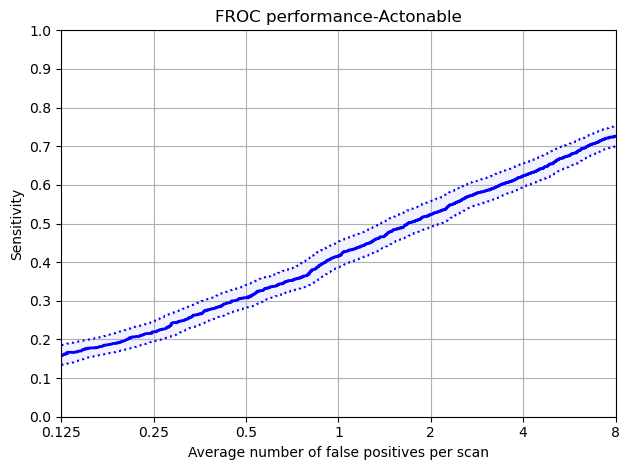

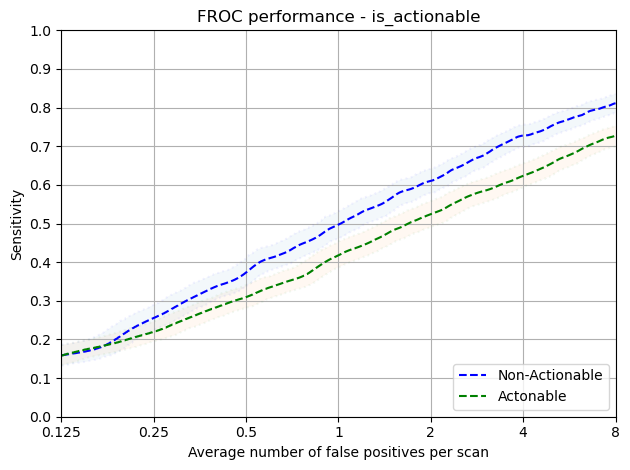

In [81]:
protected_group = 'is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable-Gender Splits

Protected Group: Female


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,36.0,29.0,10.0,10.0,15.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp2s2sywea/annotations.csv
Total number of included nodule annotations: 2004
Total number of nodule annotations: 2004
Cases: 774
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: 2448
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-5854-bku_Y0_BASELINE_A, nodule Annot ID: 1507
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6225-qvf_Y0_BASELINE_A, nodule Annot ID: 1561


100%|██████████| 1000/1000 [01:43<00:00,  9.69it/s]


,0,159,476,1111,2381,4920,9999
0,0.158 (0.133 - 0.186),0.22 (0.193 - 0.248),0.309 (0.28 - 0.338),0.418 (0.386 - 0.449),0.524 (0.492 - 0.558),0.624 (0.593 - 0.656),0.728 (0.702 - 0.755)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.158,0.133,0.186
159,0.250,0.220,0.193,0.248
476,0.500,0.309,0.280,0.338
1111,1.000,0.418,0.386,0.449
2381,2.000,0.524,0.492,0.558
4920,4.000,0.624,0.593,0.656
9999,8.000,0.728,0.702,0.755


Mean Sensitivity: 0.43 Low Sensitivity: 0.4 High Sensitivity: 0.456


,True positives,1692
0,False positives,39914.000
1,False negatives,312.000
2,True negatives,0.000
3,Total number of candidates,41673.000
4,Total number of nodules,2004.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,70.000
7,Sensitivity,0.844
8,Average number of candidates per scan,53.841


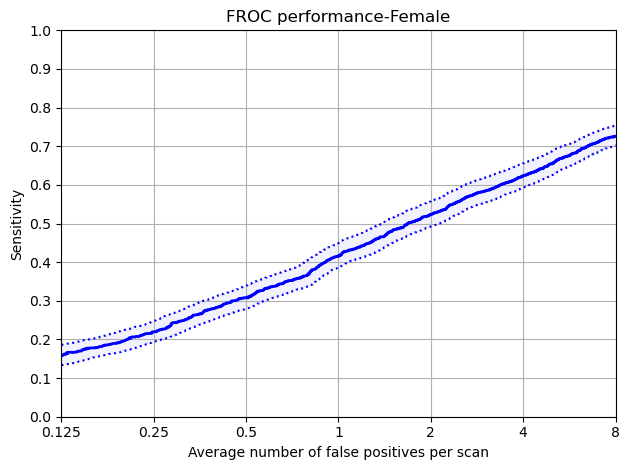

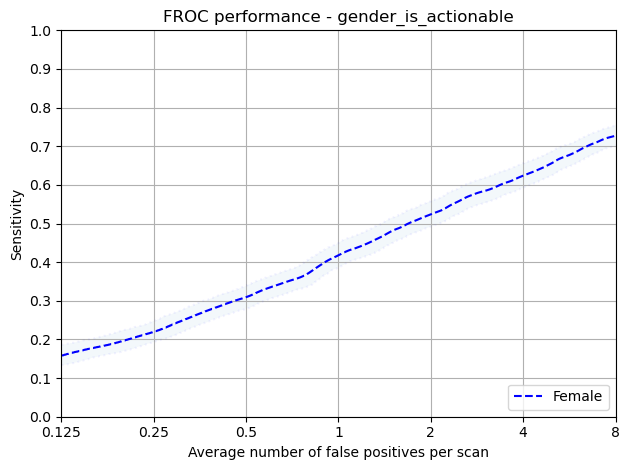

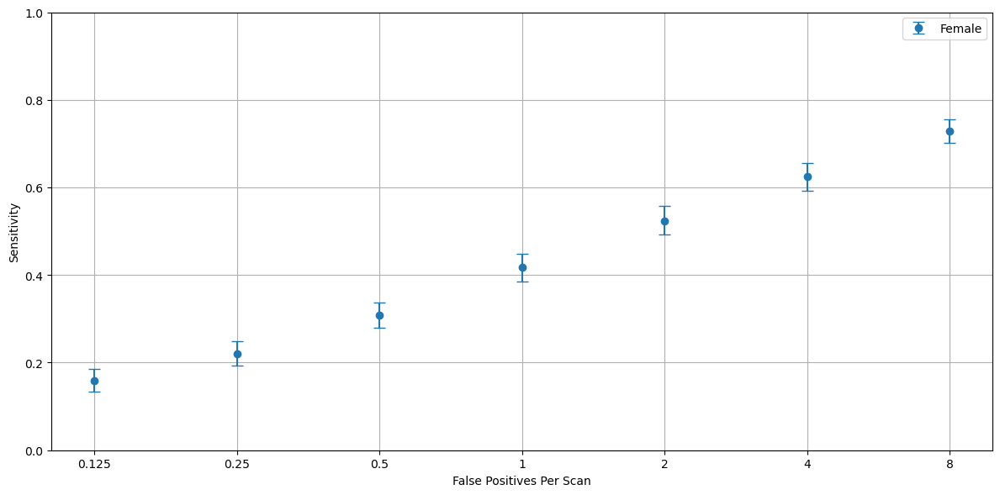

In [82]:
protected_group = 'gender_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('grt123', flavour, 'Actionable, Gender', data_dict)

### NonActionable-Gender

Protected Group: Female


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,14.0,85.0,1.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp7q02artn/annotations.csv
Total number of included nodule annotations: 971
Total number of nodule annotations: 971
Cases: 1544
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: 1802


100%|██████████| 1000/1000 [03:37<00:00,  4.60it/s]


,0,159,476,1111,2381,4920,9999
0,0.159 (0.133 - 0.185),0.256 (0.224 - 0.29),0.373 (0.337 - 0.414),0.497 (0.464 - 0.534),0.61 (0.579 - 0.64),0.727 (0.698 - 0.757),0.811 (0.785 - 0.837)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.159,0.133,0.185
159,0.250,0.256,0.224,0.290
476,0.500,0.373,0.337,0.414
1111,1.000,0.497,0.464,0.534
2381,2.000,0.610,0.579,0.640
4920,4.000,0.727,0.698,0.757
9999,8.000,0.811,0.785,0.837


Mean Sensitivity: 0.49 Low Sensitivity: 0.46 High Sensitivity: 0.522


,True positives,838
0,False positives,76223.000
1,False negatives,133.000
2,True negatives,0.000
3,Total number of candidates,77062.000
4,Total number of nodules,971.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,2.000
7,Sensitivity,0.863
8,Average number of candidates per scan,49.911


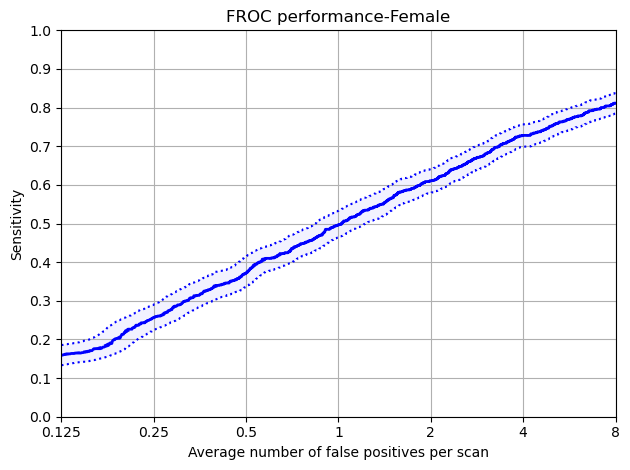

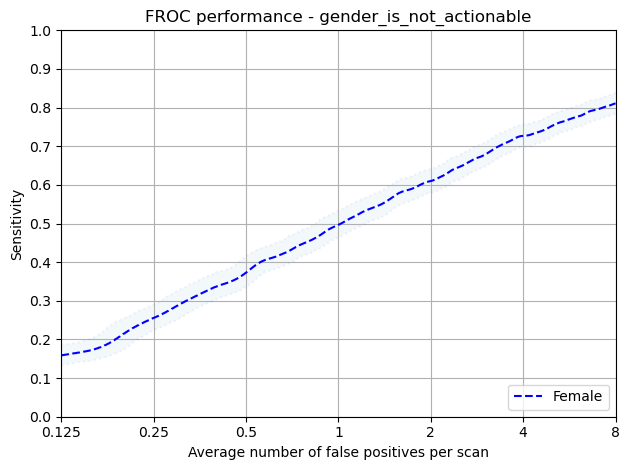

In [83]:
protected_group = 'gender_is_not_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable Ethnic Group

Protected Group: White


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,35.0,29.0,10.0,10.0,15.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpq_9odpiq/annotations.csv
Total number of included nodule annotations: 1788
Total number of nodule annotations: 1788
Cases: 677
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: 2448
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-5854-bku_Y0_BASELINE_A, nodule Annot ID: 1507
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6225-qvf_Y0_BASELINE_A, nodule Annot ID: 1561


100%|██████████| 1000/1000 [01:26<00:00, 11.50it/s]


,0,159,476,1111,2381,4920,9999
0,0.159 (0.133 - 0.19),0.228 (0.199 - 0.261),0.32 (0.289 - 0.352),0.429 (0.394 - 0.462),0.534 (0.501 - 0.568),0.632 (0.6 - 0.664),0.728 (0.701 - 0.758)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.159,0.133,0.190
159,0.250,0.228,0.199,0.261
476,0.500,0.320,0.289,0.352
1111,1.000,0.429,0.394,0.462
2381,2.000,0.534,0.501,0.568
4920,4.000,0.632,0.600,0.664
9999,8.000,0.728,0.701,0.758


Mean Sensitivity: 0.43 Low Sensitivity: 0.4 High Sensitivity: 0.465


,True positives,1508
0,False positives,35668.000
1,False negatives,280.000
2,True negatives,0.000
3,Total number of candidates,37242.000
4,Total number of nodules,1788.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,69.000
7,Sensitivity,0.843
8,Average number of candidates per scan,55.010


Protected Group: Black


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,43.0,39.0,6.0,6.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpoggluc4s/annotations.csv
Total number of included nodule annotations: 109
Total number of nodule annotations: 109
Cases: 46


100%|██████████| 1000/1000 [00:02<00:00, 399.81it/s]


,0,159,476,1111,2381,4920,9999
0,0.189 (0.108 - 0.294),0.226 (0.133 - 0.333),0.283 (0.183 - 0.426),0.378 (0.258 - 0.532),0.463 (0.315 - 0.633),0.602 (0.443 - 0.763),0.778 (0.692 - 0.878)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.189,0.108,0.294
159,0.250,0.226,0.133,0.333
476,0.500,0.283,0.183,0.426
1111,1.000,0.378,0.258,0.532
2381,2.000,0.463,0.315,0.633
4920,4.000,0.602,0.443,0.763
9999,8.000,0.778,0.692,0.878


Mean Sensitivity: 0.42 Low Sensitivity: 0.3 High Sensitivity: 0.551


,True positives,99
0,False positives,1881.000
1,False negatives,10.000
2,True negatives,0.000
3,Total number of candidates,1980.000
4,Total number of nodules,109.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.908
8,Average number of candidates per scan,43.043


Protected Group: Asian or Asian British


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,31.0,22.0,9.0,25.0,12.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpqpeg44fx/annotations.csv
Total number of included nodule annotations: 32
Total number of nodule annotations: 32
Cases: 19


100%|██████████| 1000/1000 [00:01<00:00, 764.15it/s]


,0,159,476,1111,2381,4920,9999
0,0.031 (0.0 - 0.103),0.042 (0.0 - 0.118),0.087 (0.0 - 0.188),0.156 (0.059 - 0.286),0.405 (0.231 - 0.571),0.487 (0.317 - 0.636),0.542 (0.37 - 0.704)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.031,0.000,0.103
159,0.250,0.042,0.000,0.118
476,0.500,0.087,0.000,0.188
1111,1.000,0.156,0.059,0.286
2381,2.000,0.405,0.231,0.571
4920,4.000,0.487,0.317,0.636
9999,8.000,0.542,0.370,0.704


Mean Sensitivity: 0.25 Low Sensitivity: 0.14 High Sensitivity: 0.372


,True positives,22
0,False positives,826.000
1,False negatives,10.000
2,True negatives,0.000
3,Total number of candidates,848.000
4,Total number of nodules,32.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.688
8,Average number of candidates per scan,44.632


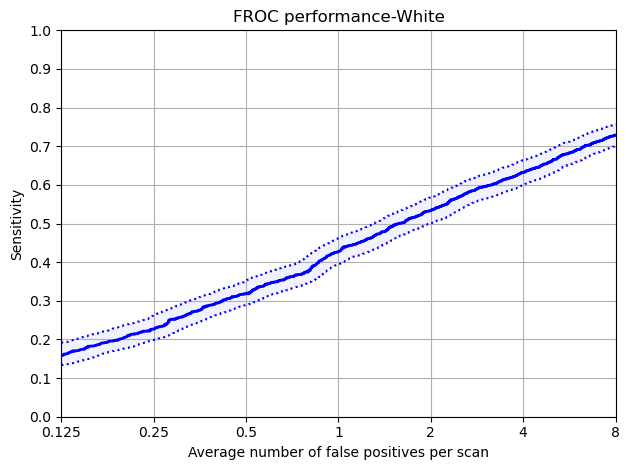

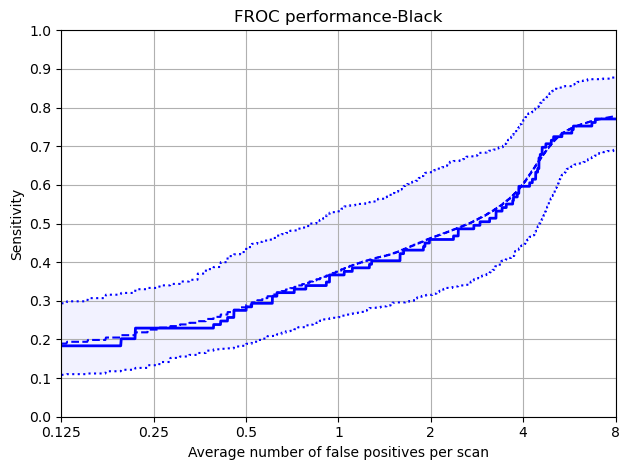

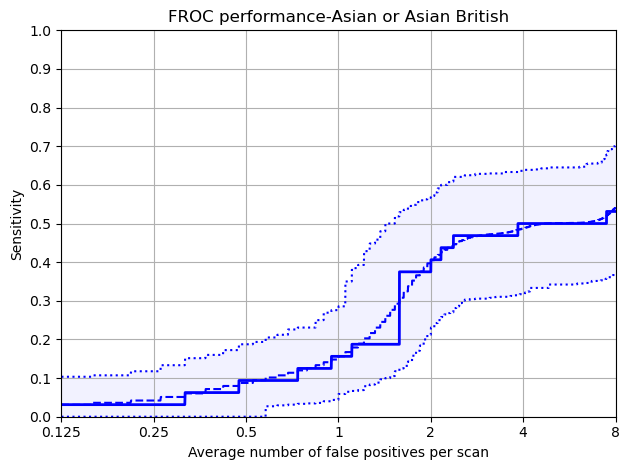

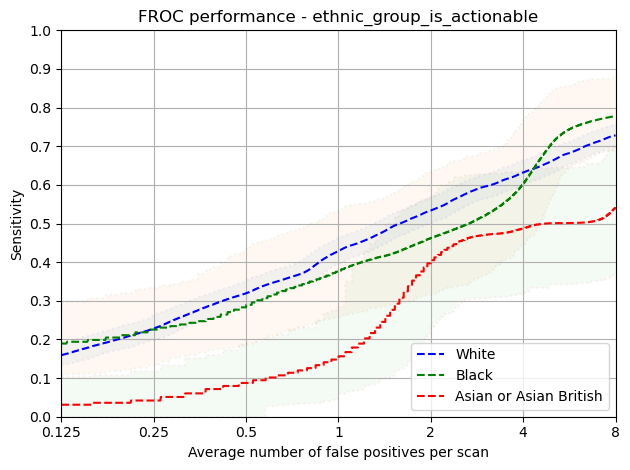

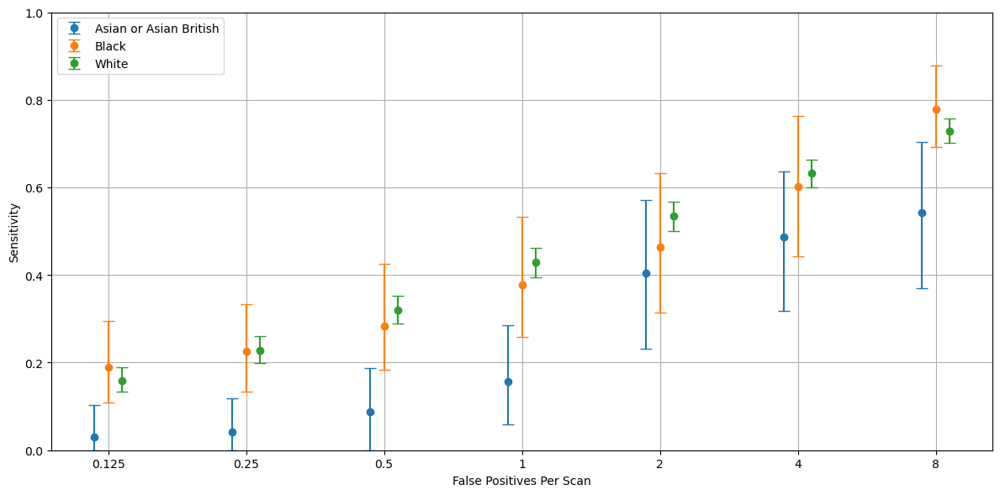

In [84]:
protected_group = 'ethnic_group_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('grt123', flavour, 'Actionable, Ethnic Group', data_dict, order=['Asian or Asian British','Black','White'])

### NonActionable Ethnic Group

Protected Group: White


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,14.0,85.0,1.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpu11n7gn5/annotations.csv
Total number of included nodule annotations: 848
Total number of nodule annotations: 848
Cases: 1298
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: 1802


100%|██████████| 1000/1000 [02:56<00:00,  5.65it/s]


,0,159,476,1111,2381,4920,9999
0,0.161 (0.134 - 0.19),0.253 (0.217 - 0.286),0.372 (0.332 - 0.412),0.488 (0.45 - 0.525),0.605 (0.571 - 0.638),0.726 (0.694 - 0.757),0.807 (0.78 - 0.834)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.161,0.134,0.190
159,0.250,0.253,0.217,0.286
476,0.500,0.372,0.332,0.412
1111,1.000,0.488,0.450,0.525
2381,2.000,0.605,0.571,0.638
4920,4.000,0.726,0.694,0.757
9999,8.000,0.807,0.780,0.834


Mean Sensitivity: 0.49 Low Sensitivity: 0.45 High Sensitivity: 0.52


,True positives,731
0,False positives,65350.000
1,False negatives,117.000
2,True negatives,0.000
3,Total number of candidates,66081.000
4,Total number of nodules,848.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,1.000
7,Sensitivity,0.862
8,Average number of candidates per scan,50.910


Protected Group: Black


,SOLID,PERIFISSURAL
nodule_type,13.0,87.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpsofhdcvl/annotations.csv
Total number of included nodule annotations: 60
Total number of nodule annotations: 60
Cases: 126


100%|██████████| 1000/1000 [00:08<00:00, 117.85it/s]


,0,159,476,1111,2381,4920,9999
0,0.115 (0.019 - 0.312),0.332 (0.158 - 0.49),0.47 (0.333 - 0.603),0.628 (0.483 - 0.767),0.725 (0.606 - 0.844),0.769 (0.675 - 0.867),0.84 (0.75 - 0.921)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.115,0.019,0.312
159,0.250,0.332,0.158,0.490
476,0.500,0.470,0.333,0.603
1111,1.000,0.628,0.483,0.767
2381,2.000,0.725,0.606,0.844
4920,4.000,0.769,0.675,0.867
9999,8.000,0.840,0.750,0.921


Mean Sensitivity: 0.55 Low Sensitivity: 0.43 High Sensitivity: 0.686


,True positives,53
0,False positives,5360.000
1,False negatives,7.000
2,True negatives,0.000
3,Total number of candidates,5413.000
4,Total number of nodules,60.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.883
8,Average number of candidates per scan,42.960


Protected Group: Asian or Asian British


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,12.0,84.0,4.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpt03lu4_4/annotations.csv
Total number of included nodule annotations: 25
Total number of nodule annotations: 25
Cases: 40


100%|██████████| 1000/1000 [00:02<00:00, 453.24it/s]


,0,159,476,1111,2381,4920,9999
0,0.274 (0.074 - 0.48),0.287 (0.091 - 0.517),0.342 (0.13 - 0.571),0.431 (0.205 - 0.68),0.582 (0.381 - 0.8),0.653 (0.444 - 0.864),0.869 (0.706 - 1.0)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.274,0.074,0.480
159,0.250,0.287,0.091,0.517
476,0.500,0.342,0.130,0.571
1111,1.000,0.431,0.205,0.680
2381,2.000,0.582,0.381,0.800
4920,4.000,0.653,0.444,0.864
9999,8.000,0.869,0.706,1.000


Mean Sensitivity: 0.49 Low Sensitivity: 0.29 High Sensitivity: 0.702


,True positives,22
0,False positives,1597.000
1,False negatives,3.000
2,True negatives,0.000
3,Total number of candidates,1619.000
4,Total number of nodules,25.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.880
8,Average number of candidates per scan,40.475


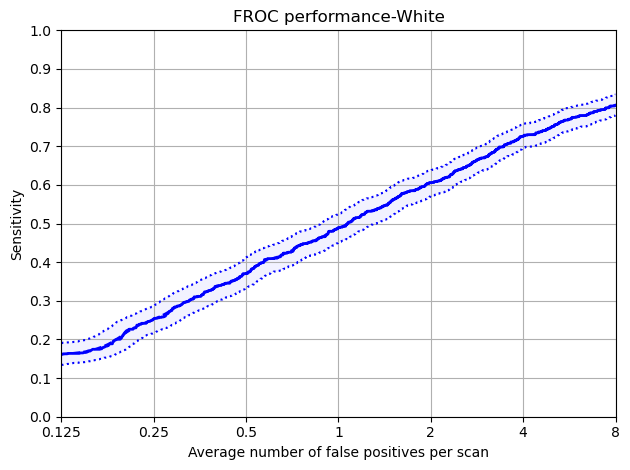

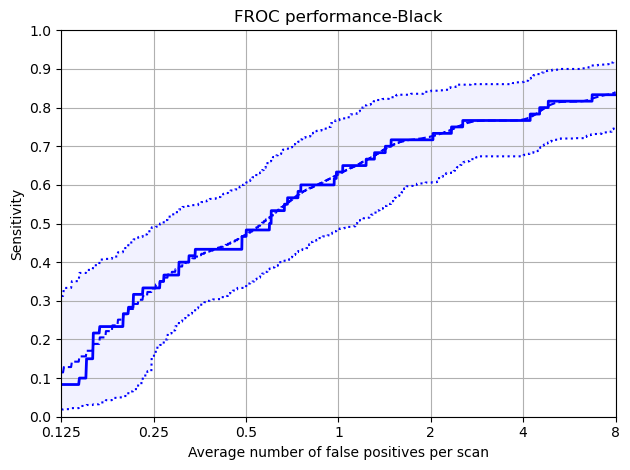

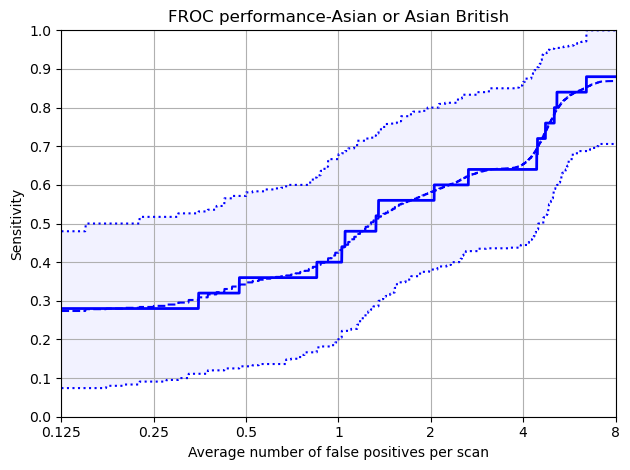

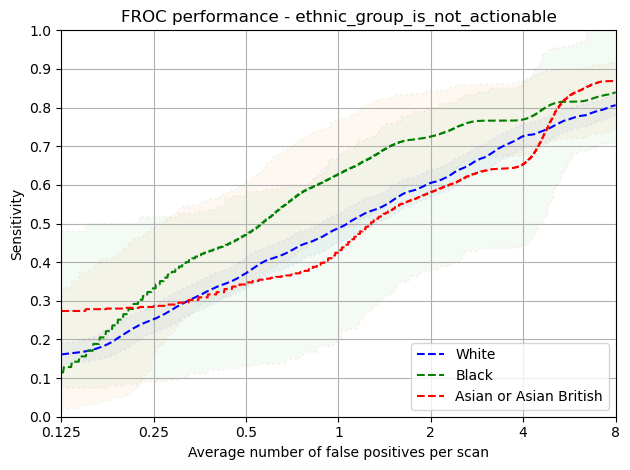

In [85]:
protected_group = 'ethnic_group_is_not_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable IMDRank

Protected Group: High_IMDRank_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,33.0,28.0,11.0,14.0,15.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpubl6vfrn/annotations.csv
Total number of included nodule annotations: 702
Total number of nodule annotations: 702
Cases: 266


100%|██████████| 1000/1000 [00:36<00:00, 27.16it/s]


,0,159,476,1111,2381,4920,9999
0,0.172 (0.135 - 0.216),0.245 (0.195 - 0.295),0.315 (0.268 - 0.362),0.414 (0.362 - 0.464),0.496 (0.444 - 0.548),0.608 (0.555 - 0.66),0.717 (0.673 - 0.759)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.172,0.135,0.216
159,0.250,0.245,0.195,0.295
476,0.500,0.315,0.268,0.362
1111,1.000,0.414,0.362,0.464
2381,2.000,0.496,0.444,0.548
4920,4.000,0.608,0.555,0.660
9999,8.000,0.717,0.673,0.759


Mean Sensitivity: 0.42 Low Sensitivity: 0.38 High Sensitivity: 0.472


,True positives,587
0,False positives,13826.000
1,False negatives,115.000
2,True negatives,0.000
3,Total number of candidates,14438.000
4,Total number of nodules,702.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,25.000
7,Sensitivity,0.836
8,Average number of candidates per scan,54.278


Protected Group: Low_IMDRank_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,37.0,28.0,9.0,9.0,17.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmptqz4ap24/annotations.csv
Total number of included nodule annotations: 663
Total number of nodule annotations: 663
Cases: 259


100%|██████████| 1000/1000 [00:31<00:00, 31.41it/s]


,0,159,476,1111,2381,4920,9999
0,0.148 (0.111 - 0.192),0.225 (0.175 - 0.273),0.316 (0.271 - 0.365),0.421 (0.37 - 0.473),0.543 (0.49 - 0.597),0.631 (0.577 - 0.683),0.741 (0.688 - 0.791)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.148,0.111,0.192
159,0.250,0.225,0.175,0.273
476,0.500,0.316,0.271,0.365
1111,1.000,0.421,0.370,0.473
2381,2.000,0.543,0.490,0.597
4920,4.000,0.631,0.577,0.683
9999,8.000,0.741,0.688,0.791


Mean Sensitivity: 0.43 Low Sensitivity: 0.38 High Sensitivity: 0.482


,True positives,562
0,False positives,13334.000
1,False negatives,101.000
2,True negatives,0.000
3,Total number of candidates,13914.000
4,Total number of nodules,663.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,18.000
7,Sensitivity,0.848
8,Average number of candidates per scan,53.722


Protected Group: Medium_IMDRank_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,39.0,32.0,9.0,7.0,13.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp6gbgvc7o/annotations.csv
Total number of included nodule annotations: 633
Total number of nodule annotations: 633
Cases: 248
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: 2448
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-5854-bku_Y0_BASELINE_A, nodule Annot ID: 1507
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6225-qvf_Y0_BASELINE_A, nodule Annot ID: 1561


100%|██████████| 1000/1000 [00:28<00:00, 34.77it/s]


,0,159,476,1111,2381,4920,9999
0,0.162 (0.115 - 0.21),0.207 (0.168 - 0.248),0.296 (0.24 - 0.352),0.409 (0.345 - 0.474),0.533 (0.476 - 0.593),0.631 (0.579 - 0.684),0.724 (0.681 - 0.768)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.162,0.115,0.210
159,0.250,0.207,0.168,0.248
476,0.500,0.296,0.240,0.352
1111,1.000,0.409,0.345,0.474
2381,2.000,0.533,0.476,0.593
4920,4.000,0.631,0.579,0.684
9999,8.000,0.724,0.681,0.768


Mean Sensitivity: 0.42 Low Sensitivity: 0.37 High Sensitivity: 0.476


,True positives,537
0,False positives,12610.000
1,False negatives,96.000
2,True negatives,0.000
3,Total number of candidates,13171.000
4,Total number of nodules,633.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,27.000
7,Sensitivity,0.848
8,Average number of candidates per scan,53.109


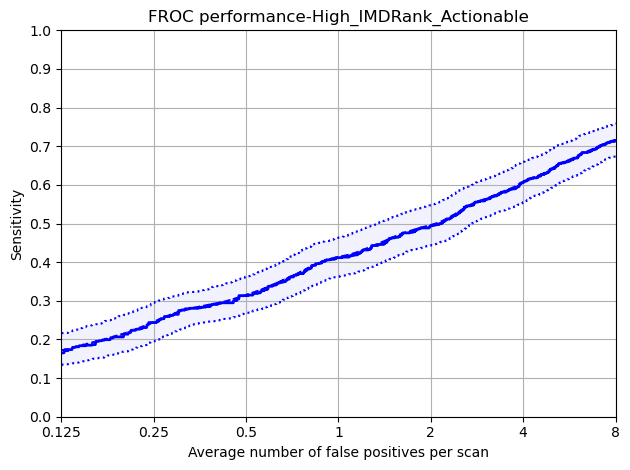

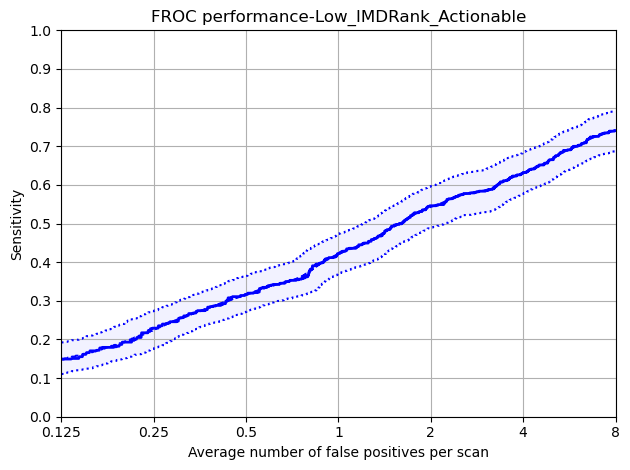

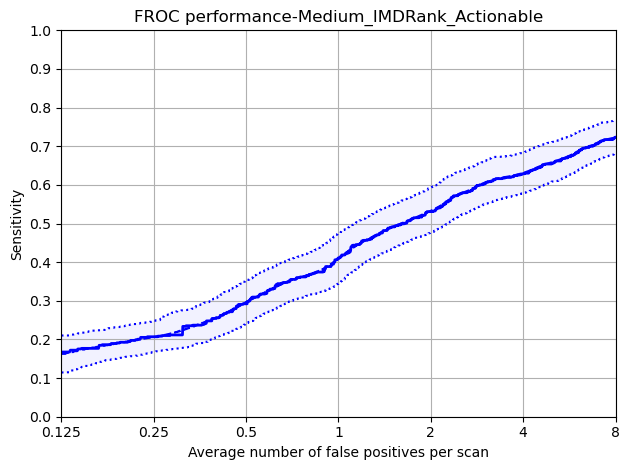

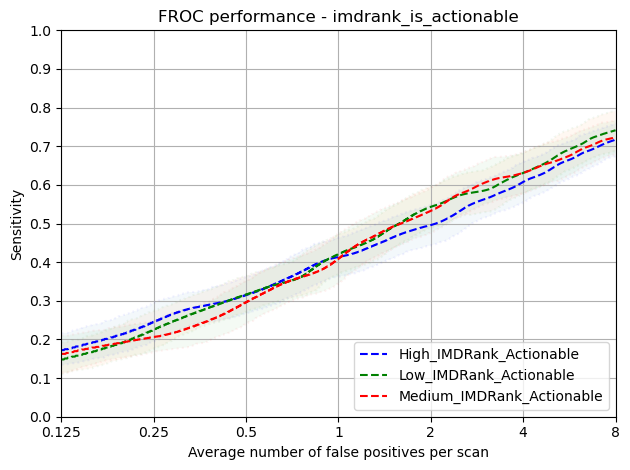

In [86]:
protected_group = 'imdrank_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable Smoking Status

Protected Group: Low_Pack_Years_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,36.0,31.0,9.0,9.0,16.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpe_3z30io/annotations.csv
Total number of included nodule annotations: 751
Total number of nodule annotations: 751


Cases: 300
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: 2448


100%|██████████| 1000/1000 [00:39<00:00, 25.44it/s]


,0,159,476,1111,2381,4920,9999
0,0.132 (0.094 - 0.168),0.2 (0.164 - 0.243),0.294 (0.255 - 0.337),0.396 (0.353 - 0.443),0.489 (0.442 - 0.537),0.593 (0.547 - 0.64),0.707 (0.673 - 0.746)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.132,0.094,0.168
159,0.250,0.200,0.164,0.243
476,0.500,0.294,0.255,0.337
1111,1.000,0.396,0.353,0.443
2381,2.000,0.489,0.442,0.537
4920,4.000,0.593,0.547,0.640
9999,8.000,0.707,0.673,0.746


Mean Sensitivity: 0.4 Low Sensitivity: 0.36 High Sensitivity: 0.445


,True positives,619
0,False positives,15508.000
1,False negatives,132.000
2,True negatives,0.000
3,Total number of candidates,16148.000
4,Total number of nodules,751.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,22.000
7,Sensitivity,0.824
8,Average number of candidates per scan,53.827


Protected Group: High_Pack_Years_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,35.0,25.0,9.0,11.0,19.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpwzv0_5s2/annotations.csv
Total number of included nodule annotations: 540
Total number of nodule annotations: 540
Cases: 222
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-5854-bku_Y0_BASELINE_A, nodule Annot ID: 1507


100%|██████████| 1000/1000 [00:24<00:00, 40.31it/s]


,0,159,476,1111,2381,4920,9999
0,0.168 (0.118 - 0.218),0.231 (0.177 - 0.288),0.321 (0.264 - 0.38),0.435 (0.364 - 0.499),0.57 (0.504 - 0.633),0.676 (0.614 - 0.735),0.76 (0.696 - 0.815)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.168,0.118,0.218
159,0.250,0.231,0.177,0.288
476,0.500,0.321,0.264,0.380
1111,1.000,0.435,0.364,0.499
2381,2.000,0.570,0.504,0.633
4920,4.000,0.676,0.614,0.735
9999,8.000,0.760,0.696,0.815


Mean Sensitivity: 0.45 Low Sensitivity: 0.39 High Sensitivity: 0.51


,True positives,457
0,False positives,11923.000
1,False negatives,83.000
2,True negatives,0.000
3,Total number of candidates,12393.000
4,Total number of nodules,540.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,14.000
7,Sensitivity,0.846
8,Average number of candidates per scan,55.824


Protected Group: Medium_Pack_Years_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,37.0,31.0,11.0,11.0,10.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp5139gerw/annotations.csv
Total number of included nodule annotations: 713
Total number of nodule annotations: 713
Cases: 254
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6225-qvf_Y0_BASELINE_A, nodule Annot ID: 1561


100%|██████████| 1000/1000 [00:25<00:00, 39.30it/s]


,0,159,476,1111,2381,4920,9999
0,0.182 (0.138 - 0.228),0.24 (0.191 - 0.29),0.32 (0.269 - 0.372),0.428 (0.373 - 0.487),0.526 (0.469 - 0.587),0.617 (0.566 - 0.67),0.731 (0.687 - 0.775)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.182,0.138,0.228
159,0.250,0.240,0.191,0.290
476,0.500,0.320,0.269,0.372
1111,1.000,0.428,0.373,0.487
2381,2.000,0.526,0.469,0.587
4920,4.000,0.617,0.566,0.670
9999,8.000,0.731,0.687,0.775


Mean Sensitivity: 0.43 Low Sensitivity: 0.38 High Sensitivity: 0.487


,True positives,616
0,False positives,12483.000
1,False negatives,97.000
2,True negatives,0.000
3,Total number of candidates,13132.000
4,Total number of nodules,713.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,34.000
7,Sensitivity,0.864
8,Average number of candidates per scan,51.701


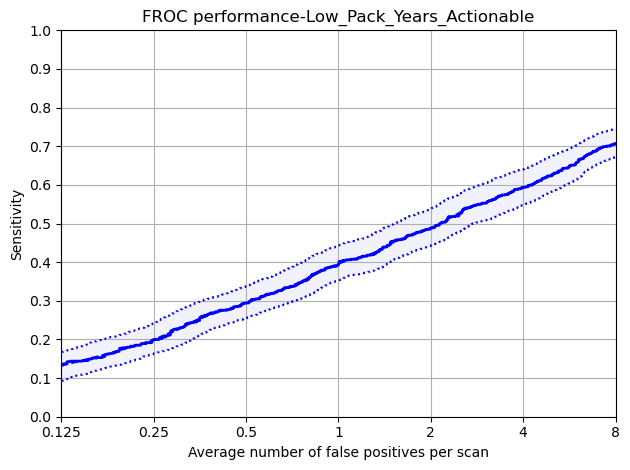

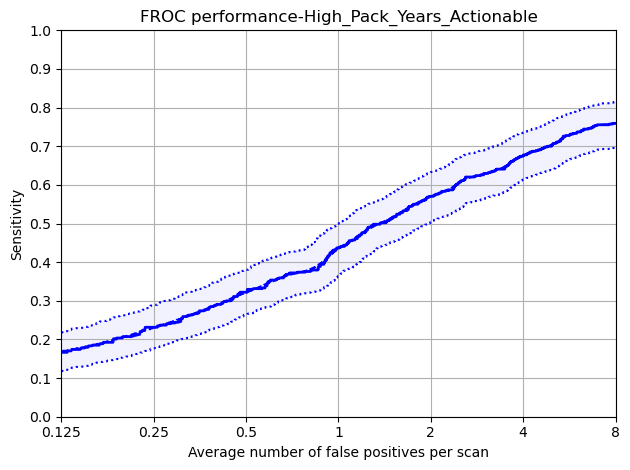

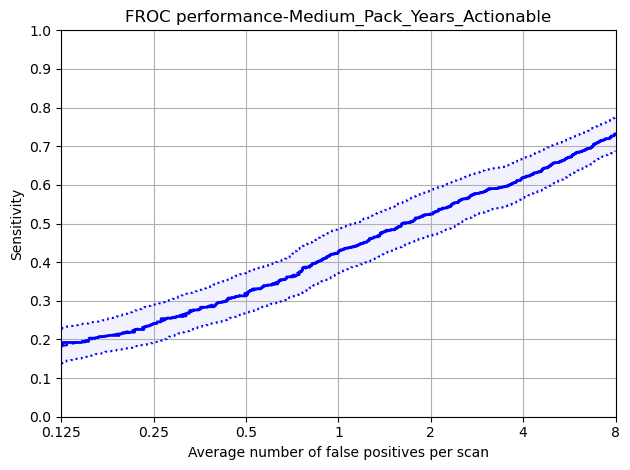

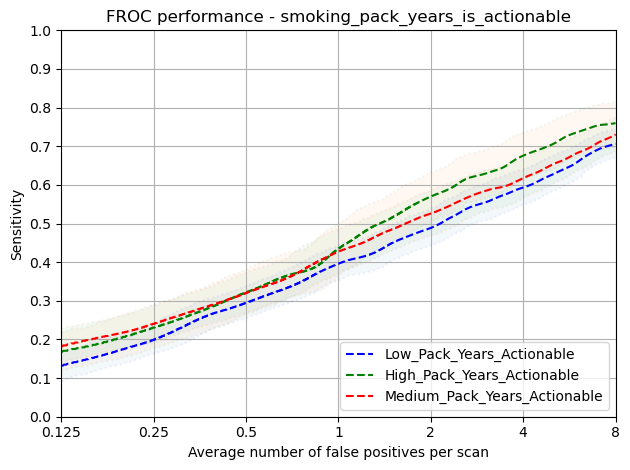

In [87]:
protected_group = 'smoking_pack_years_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)

### False positive and Miss Investigations

In [88]:
import importlib
import utils

importlib.reload(utils)

<module 'utils' from '/Users/john/Projects/SOTAEvaluationNoduleDetection/notebooks/FairnessInNoduleDetectionAlgorithms/utils.py'>

In [89]:
thresholds = utils.get_thresholds(grt123_summit_summit)
missed_metadata = utils.miss_anaysis_at_fpps(
    model='grt123',
    scans_metadata=scan_metadata,
    scans_path=f'{workspace_path}/metadata/summit/{flavour}/test_scans.csv',
    annotations_path=f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv',
    exclusions_path=f'{workspace_path}/data/summit/metadata/grt123_annotations_excluded_empty.csv',
    predictions_path=f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_predictions.csv',
    thresholds=thresholds
)


/Users/john/Projects/SOTAEvaluationNoduleDetection/models/grt123/bbox_result/trained_summit/summit/female_for_inference/female_for_inference_metadata.csv
Total number of included nodule annotations: 2989
Total number of nodule annotations: 2989
Cases: 2337
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: 2448
Missed Annotations at 7.0298104 FPPs: 2516
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/grt123/bbox_result/trained_summit/summit/female_for_inference/female_for_inference_metadata.csv
Total number of included nodule annotations: 2989
Total number of nodule annotations: 2989
Cases: 2337
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: 2448
Missed Annotations at 6.7285514 FPPs: 2297
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/grt123/bbox_result/train

#### Incremental FROC Scores - Gender/ Ethnic Group/ Nodule Type

In [90]:

hit_and_miss_dict = utils.get_protected_group_by_nodule_type(missed_metadata)


In [91]:


recode_dict = {}
for idx in range(7):
    hmm = {}
    for slice in ['all','actionable']:
        for protected_group in ['MALE','FEMALE','All', 'Asian or Asian British', 'Black', 'White']:
            for type in ['SOLID','NON_SOLID','PART_SOLID','PERIFISSURAL','CALCIFIED']:
            
                try:

                    group = 'gender' if protected_group in ['MALE','FEMALE','All'] else 'ethnic_group'

                    total = hit_and_miss_dict[idx][slice][group][(True,type)][protected_group] + hit_and_miss_dict[idx][slice][group][(False,type)][protected_group]
                    hits = hit_and_miss_dict[idx][slice][group][(False,type)][protected_group]
                    perc_hits = round(100 * (hits/total),0)

                    if hits == 0:
                        perc_hits = 0

                    hmm[f'{slice}_{protected_group}_{type}_Hits%'] = perc_hits
                except:
                    print(f'Error: {idx}, {slice}, {protected_group}, {type}')
                    pass

    recode_dict[idx] = hmm

df = pd.DataFrame.from_dict(recode_dict, orient='index')

# Remove ".0" from each value in the dataframe
df = df.applymap(lambda x: str(x).replace('.0', ''))

# Collapse each column into comma-delimited values
collapsed_df = df.apply(lambda x: ', '.join(x), axis=0)

display(collapsed_df)

from scipy.stats import shapiro, ttest_ind, mannwhitneyu

def calculate_significant_differences(df, group1_name, group2_name):

    if group1_name not in df.columns or group2_name not in df.columns:
        print(f'Error: {group1_name} or {group2_name} not in dataframe')
        return

    group1 = df[group1_name].astype(int).values
    group2 = df[group2_name].astype(int).values

    shapiro_group1 = shapiro(group1)
    shapiro_group2 = shapiro(group2)

    print('*'*50)
    if shapiro_group1[1] > 0.05 and shapiro_group2[1] > 0.05:
        t_test = ttest_ind(group1, group2)
        print(f'Independent T-Test: {round(t_test.statistic,3)}, {round(t_test.pvalue,3)}')
    else:
        manwhitney = mannwhitneyu(group1, group2)
        print(f'Mann-Whitney U Test: {round(manwhitney.statistic,3)}, {round(manwhitney.pvalue,3)}')

for type in ['SOLID','NON_SOLID','PART_SOLID','PERIFISSURAL','CALCIFIED']:

    try:
        print(f'*** {type} ***')
        group1 = f'all_White_{type}_Hits%'
        group2 = f'all_Asian or Asian British_{type}_Hits%'
        calculate_significant_differences(df, group1, group2)
    except:
        pass

Error: 0, all, MALE, SOLID
Error: 0, all, MALE, NON_SOLID
Error: 0, all, MALE, PART_SOLID
Error: 0, all, MALE, PERIFISSURAL
Error: 0, all, MALE, CALCIFIED
Error: 0, actionable, MALE, SOLID
Error: 0, actionable, MALE, NON_SOLID
Error: 0, actionable, MALE, PART_SOLID
Error: 0, actionable, MALE, PERIFISSURAL
Error: 0, actionable, MALE, CALCIFIED
Error: 1, all, MALE, SOLID
Error: 1, all, MALE, NON_SOLID
Error: 1, all, MALE, PART_SOLID
Error: 1, all, MALE, PERIFISSURAL
Error: 1, all, MALE, CALCIFIED
Error: 1, actionable, MALE, SOLID
Error: 1, actionable, MALE, NON_SOLID
Error: 1, actionable, MALE, PART_SOLID
Error: 1, actionable, MALE, PERIFISSURAL
Error: 1, actionable, MALE, CALCIFIED
Error: 2, all, MALE, SOLID
Error: 2, all, MALE, NON_SOLID
Error: 2, all, MALE, PART_SOLID
Error: 2, all, MALE, PERIFISSURAL
Error: 2, all, MALE, CALCIFIED
Error: 2, actionable, MALE, SOLID
Error: 2, actionable, MALE, NON_SOLID
Error: 2, actionable, MALE, PART_SOLID
Error: 2, actionable, MALE, PERIFISSURAL
Err

all_FEMALE_SOLID_Hits%                                  24, 31, 42, 53, 63, 75, 83
all_FEMALE_NON_SOLID_Hits%                                 2, 3, 9, 18, 32, 42, 61
all_FEMALE_PART_SOLID_Hits%                             16, 21, 33, 48, 62, 72, 82
all_FEMALE_PERIFISSURAL_Hits%                           15, 24, 35, 48, 59, 70, 79
all_FEMALE_CALCIFIED_Hits%                                6, 9, 14, 19, 29, 39, 49
all_All_SOLID_Hits%                                     24, 31, 42, 53, 63, 75, 83
all_All_NON_SOLID_Hits%                                    2, 3, 9, 18, 32, 42, 61
all_All_PART_SOLID_Hits%                                16, 21, 33, 48, 62, 72, 82
all_All_PERIFISSURAL_Hits%                              15, 24, 35, 48, 59, 70, 79
all_All_CALCIFIED_Hits%                                   6, 9, 14, 19, 29, 39, 49
all_Asian or Asian British_SOLID_Hits%                     0, 8, 8, 15, 54, 62, 62
all_Asian or Asian British_NON_SOLID_Hits%                 0, 0, 0, 11, 33, 33, 44
all_

*** SOLID ***
**************************************************
Mann-Whitney U Test: 37.5, 0.109
*** NON_SOLID ***
**************************************************
Independent T-Test: 0.634, 0.538
*** PART_SOLID ***
**************************************************
Mann-Whitney U Test: 43.0, 0.019
*** PERIFISSURAL ***
**************************************************
Independent T-Test: 0.215, 0.834
*** CALCIFIED ***
**************************************************
Mann-Whitney U Test: 25.5, 0.948


#### Nodule Characteristic Analysis

,RIGHT,LEFT,NOT_ANSWERED
0.125,0.19,0.12,0.13
0.25,0.27,0.18,0.20
0.5,0.37,0.28,0.30
1,0.49,0.39,0.42
2,0.59,0.52,0.54
4,0.68,0.65,0.65
8,0.76,0.77,0.74
Total Annotations,1539.00,934.00,516.00


,UPPER,NOT-UPPER,NOT_ANSWERED
0.125,0.11,0.21,0.13
0.25,0.17,0.30,0.20
0.5,0.25,0.41,0.30
1,0.37,0.53,0.42
2,0.48,0.63,0.54
4,0.59,0.73,0.65
8,0.72,0.81,0.74
Total Annotations,1151.00,1322.00,516.00


,SOLID,NON_SOLID,PART_SOLID,PERIFISSURAL,CALCIFIED
0.125,0.24,0.02,0.16,0.15,0.06
0.25,0.31,0.03,0.21,0.24,0.09
0.5,0.42,0.09,0.33,0.35,0.14
1,0.53,0.18,0.48,0.48,0.19
2,0.63,0.32,0.62,0.59,0.29
4,0.75,0.42,0.72,0.70,0.39
8,0.83,0.61,0.82,0.79,0.49
Total Annotations,865.00,217.00,196.00,1416.00,295.00


,RANDOMISATION_AT_YEAR_1,ALWAYS_SCAN_AT_YEAR_1,3_MONTH_FOLLOW_UP_SCAN,URGENT_REFERRAL
0.125,0.15,0.02,0.18,0.48
0.25,0.23,0.03,0.24,0.54
0.5,0.34,0.09,0.33,0.61
1,0.46,0.19,0.44,0.70
2,0.58,0.34,0.54,0.73
4,0.69,0.45,0.64,0.81
8,0.79,0.64,0.73,0.85
Total Annotations,1775.00,203.00,914.00,97.00


diameter_cats,00-04,04-08,08-15,15-20,20-30,30-40,40-999
0.125,0.01,0.16,0.20,0.17,0.31,0.24,0.5
0.25,0.05,0.24,0.27,0.20,0.39,0.24,0.5
0.5,0.07,0.36,0.38,0.29,0.45,0.29,0.5
1,0.16,0.47,0.51,0.38,0.53,0.35,0.5
2,0.23,0.60,0.61,0.57,0.60,0.41,0.5
4,0.33,0.70,0.72,0.71,0.71,0.47,0.5
8,0.41,0.80,0.83,0.77,0.81,0.59,0.5
Total Annotations,296.00,1701.00,712.00,138.00,105.00,17.00,4.0


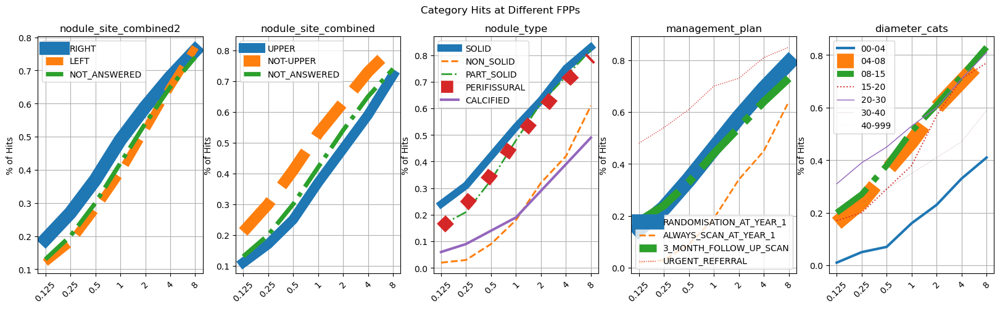

In [92]:
fig, ax = plt.subplots(1, 5, figsize=(20, 5))

nodule_characteristics = {
    'nodule_site_combined2': ['RIGHT', 'LEFT', 'NOT_ANSWERED'],
    'nodule_site_combined': ['UPPER','NOT-UPPER', 'NOT_ANSWERED'],
    'nodule_type': ['SOLID', 'NON_SOLID', 'PART_SOLID', 'PERIFISSURAL', 'CALCIFIED'],
    'management_plan': ['RANDOMISATION_AT_YEAR_1','ALWAYS_SCAN_AT_YEAR_1', '3_MONTH_FOLLOW_UP_SCAN', 'URGENT_REFERRAL'],
    'diameter_cats': diameter_lbs,
}

for ivx, (var, order) in enumerate(nodule_characteristics.items()):
    annotations = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv')
    # annotations = annotations[annotations['management_plan'] != 'RANDOMISATION_AT_YEAR_1']

    total_vc = annotations[var].value_counts().sort_index().rename('Total Annotations')

    operating_points = ['0.125', '0.25', '0.5', '1', '2', '4', '8']

    results = []

    for idx, metadata in enumerate(missed_metadata):
        results.append(
            pd.crosstab(
                metadata[var], 
                metadata['miss'],
                normalize='index'
            )[False]
            .rename(f'{operating_points[idx]}')
            .reindex(order)
            
        )

    df = pd.concat(results, axis=1).fillna(0).round(2).merge(total_vc.to_frame(), left_index=True, right_index=True)

    display(df.T)


    line_styles = ['-', '--', '-.', ':', '-', '--', '-.']
    weights = df.pop('Total Annotations')

    for isx, column in enumerate(df.T):    
            ax[ivx].plot(df.T[column], label=column, linestyle=line_styles[isx], linewidth=weights[isx]/100)
    
    ax[ivx].set_xticklabels(labels=df.columns, rotation=45)
    ax[ivx].set_title(var)
    ax[ivx].legend()
    ax[ivx].set_ylabel('% of Hits')
    ax[ivx].grid(visible=True, which='both')

plt.suptitle('Category Hits at Different FPPs')
plt.show()

In [93]:
missed_at_lowest = missed_metadata[0]
hits = missed_at_lowest[missed_at_lowest['miss'] == False]

(
    pd.crosstab(
        [
            hits['diameter_cats'],
            hits['nodule_type']
        ], 
        hits['nodule_site_combined'],
        normalize='all'
    )[['UPPER','NOT-UPPER']]
    .apply(lambda x: round(100 * x, 1))
)

nodule_site_combined        UPPER  NOT-UPPER
diameter_cats nodule_type                   
00-04         PERIFISSURAL    0.0        0.2
04-08         CALCIFIED       0.2        0.2
              PART_SOLID      0.2        0.0
              PERIFISSURAL    4.2       23.2
              SOLID           5.9       11.2
08-15         CALCIFIED       0.2        0.4
              NON_SOLID       0.4        0.0
              PART_SOLID      1.5        1.1
              PERIFISSURAL    1.5        3.6
              SOLID           5.7       13.1
15-20         CALCIFIED       0.8        0.6
              PART_SOLID      0.8        0.2
              SOLID           1.1        1.3
20-30         CALCIFIED       0.4        0.2
              NON_SOLID       0.4        0.0
              PART_SOLID      2.1        0.4
              SOLID           1.7        1.5
30-40         PART_SOLID      0.2        0.0
              SOLID           0.0        0.6
40-999        SOLID           0.2        0.2

In [94]:
thresholds = get_thresholds(grt123_summit_summit)

scans = pd.read_csv(f'{workspace_path}/metadata/summit/{flavour}/test_scans.csv')
predictions = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_predictions.csv')
annotations = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv')

false_positives_fpps = false_positive_analysis(
    thresholds=thresholds,    
    predictions=predictions,
    annotations=annotations
)

predictions: 765 at threshold: 7.0298104
distance false positives: 291 at threshold: 7.0298104
predictions: 1276 at threshold: 6.7285514
distance false positives: 583 at threshold: 6.7285514
predictions: 2157 at threshold: 6.4005036
distance false positives: 1168 at threshold: 6.4005036
predictions: 3671 at threshold: 6.0057073
distance false positives: 2337 at threshold: 6.0057073
predictions: 6319 at threshold: 5.5186276
distance false positives: 4656 at threshold: 5.5186276
predictions: 11350 at threshold: 4.7985044
distance false positives: 9364 at threshold: 4.7985044
predictions: 21051 at threshold: 3.688333
distance false positives: 18773 at threshold: 3.688333


#### Examples of False Positives

None
[[117.025      137.75        62.88        15.5181724 ]
 [145.095      146.63       229.18         3.46328311]]
summit-8775-bqx_Y0_BASELINE_A - 109.743576 141.61488 69.43342 21.35415
False Positive: True
IoU False Positive: 0.0


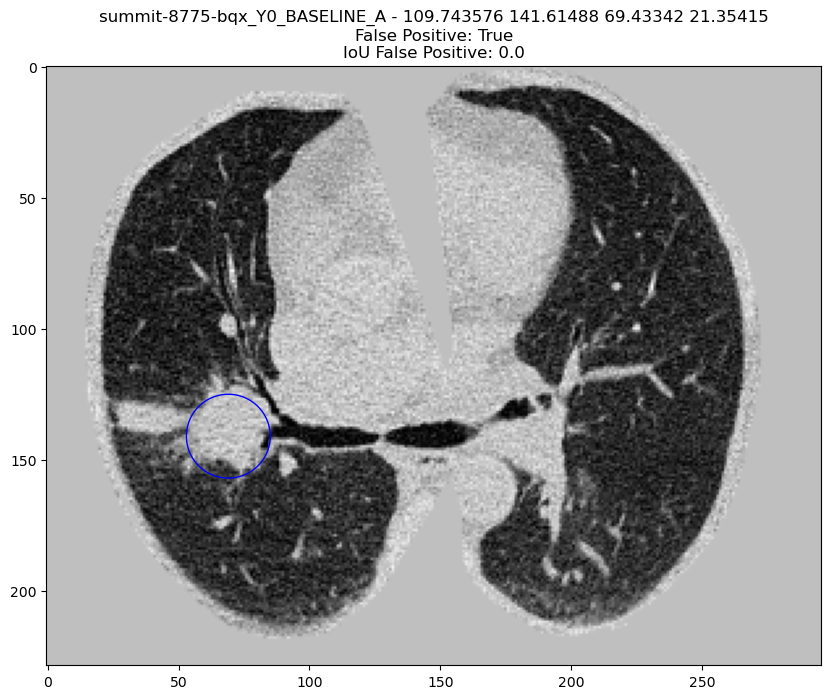

None
[[0 0 0 0]]
summit-8889-bgg_Y0_BASELINE_A - 208.02138 130.33348 73.09426 4.067704
False Positive: True
IoU False Positive: nan


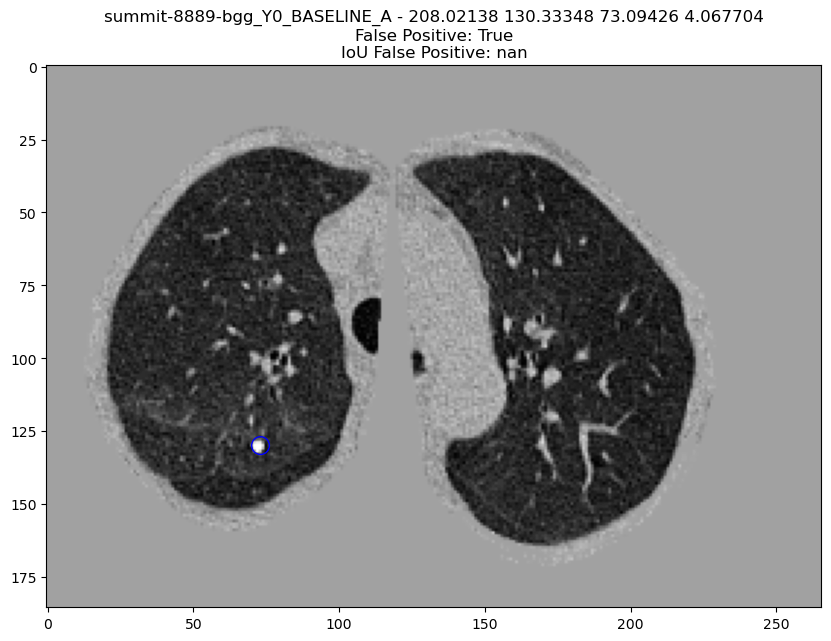

summit-7472-cwh_Y0_BASELINE_A already exists
[[138.755      157.94        83.79000305   2.26562405]]
summit-7472-cwh_Y0_BASELINE_A - 137.83809 157.71877 85.762535 11.574532
False Positive: True
IoU False Positive: 0.008905451229052633


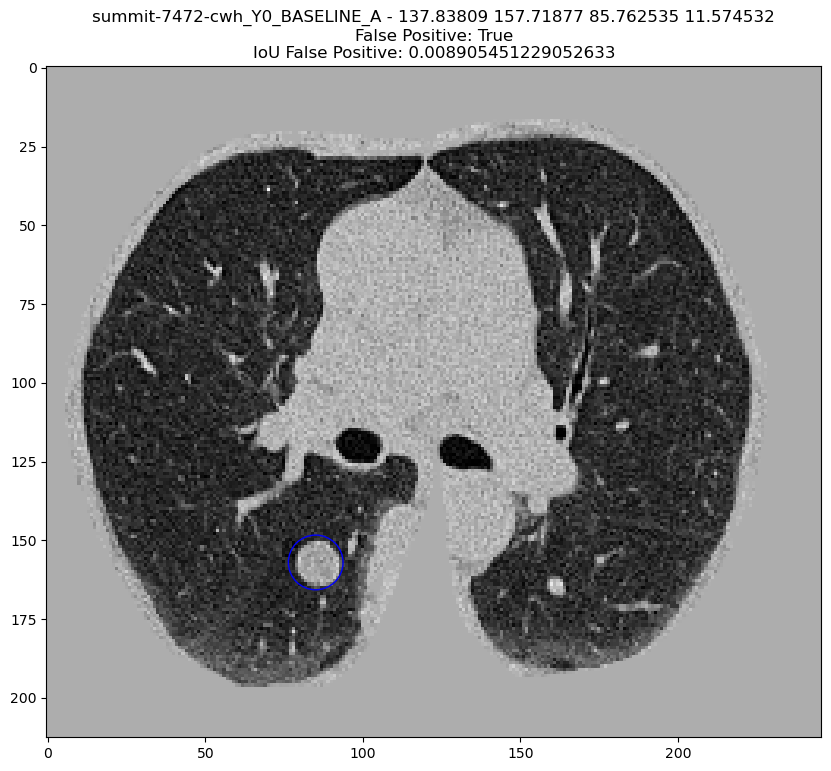

None
[[0 0 0 0]]
summit-3525-qpg_Y0_BASELINE_A - 119.89836 114.243256 45.236565 3.5561302
False Positive: True
IoU False Positive: nan


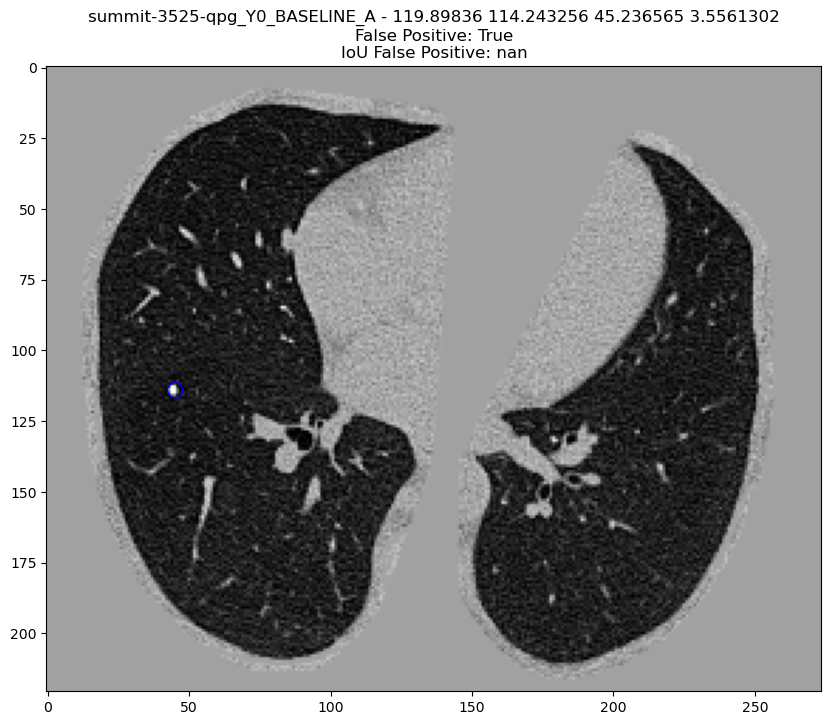

None
[[0 0 0 0]]
summit-7787-ngf_Y0_BASELINE_A - 58.52013 26.233776 48.837444 5.733652
False Positive: True
IoU False Positive: nan


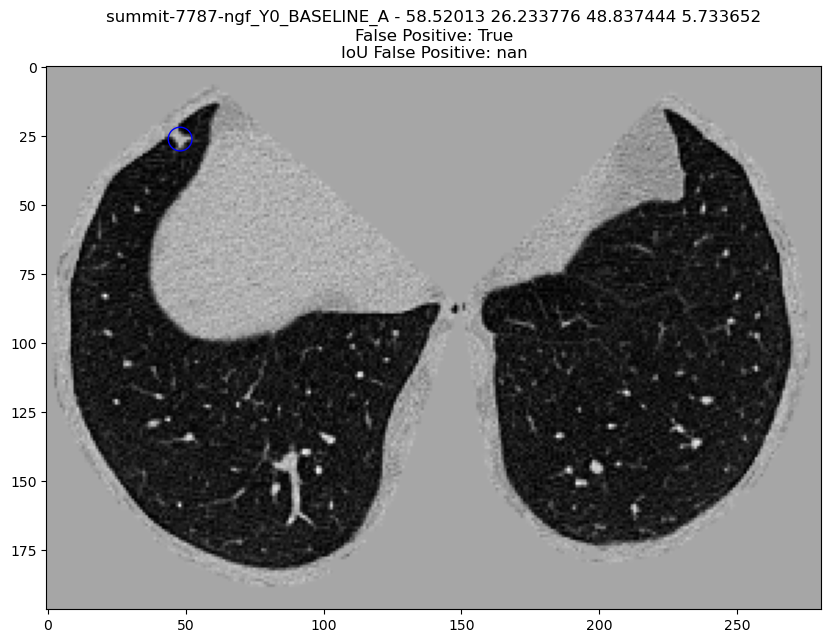

None
[[ 88.43       136.52        18.9          5.07695606]]
summit-6643-wbt_Y0_BASELINE_A - 72.52584 170.0577 88.71624 5.1034503
False Positive: True
IoU False Positive: 0.0


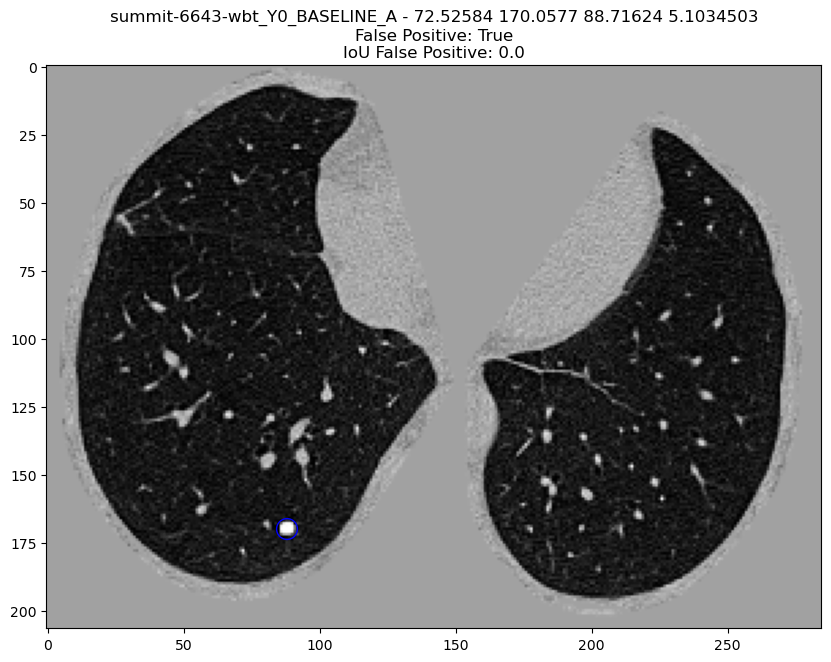

None
[[0 0 0 0]]
summit-5353-mdu_Y0_BASELINE_A - 193.58197 145.02753 214.37823 8.177297
False Positive: True
IoU False Positive: nan


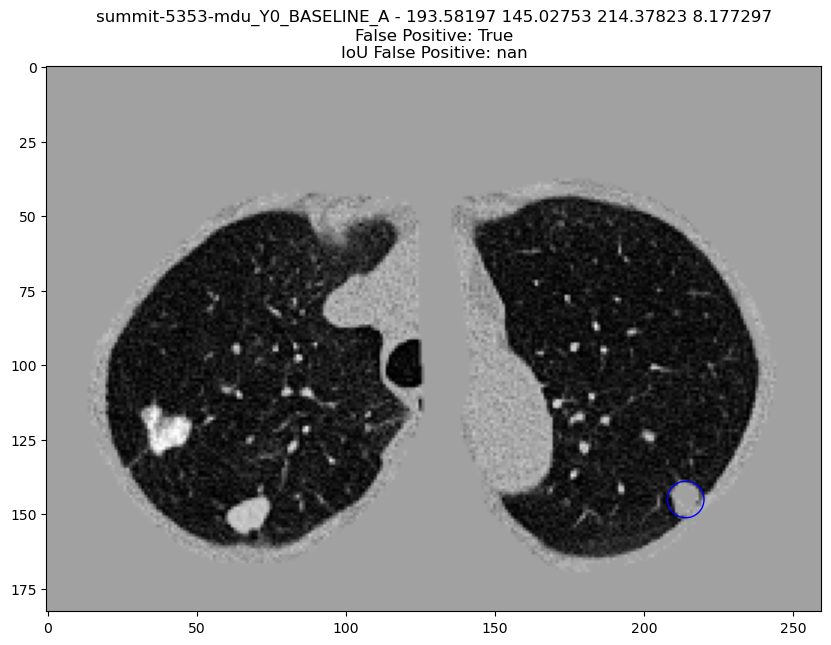

None
[[0 0 0 0]]
summit-6987-skx_Y0_BASELINE_A - 81.65821 156.97275 60.641903 5.189096
False Positive: True
IoU False Positive: nan


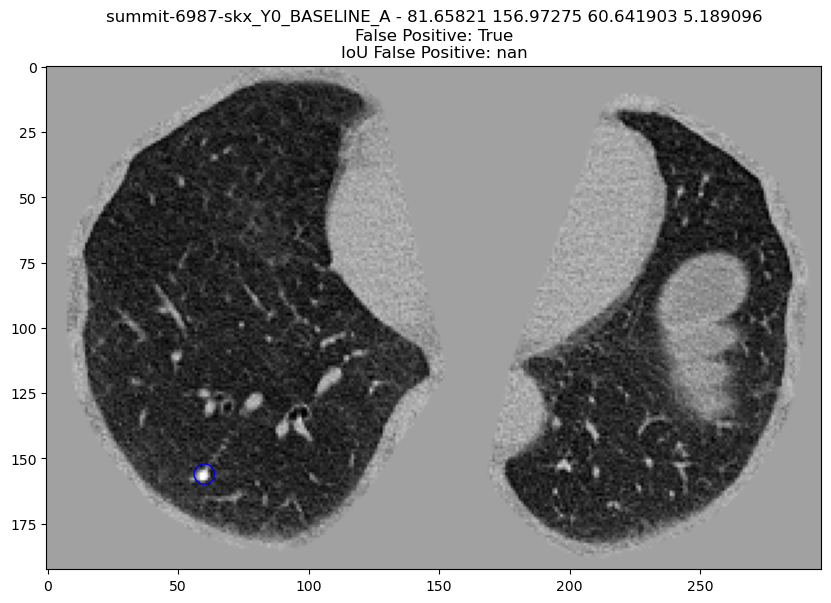

None
[[0 0 0 0]]
summit-2693-gcs_Y0_BASELINE_A - 144.30573 120.383575 42.546253 5.1271467
False Positive: True
IoU False Positive: nan


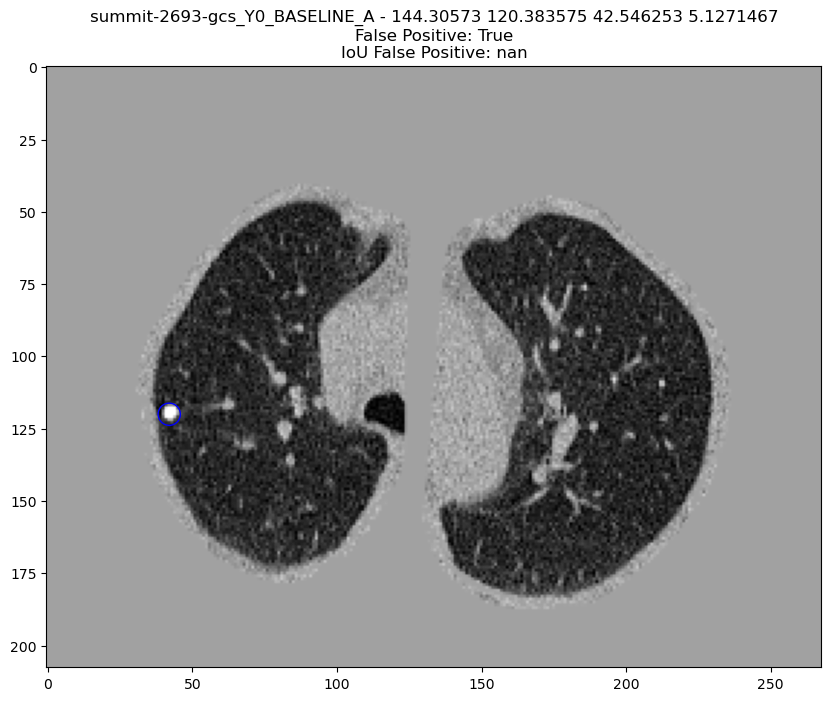

None
[[0 0 0 0]]
summit-2876-azb_Y0_BASELINE_A - 72.27536 45.906593 60.366695 5.799327
False Positive: True
IoU False Positive: nan


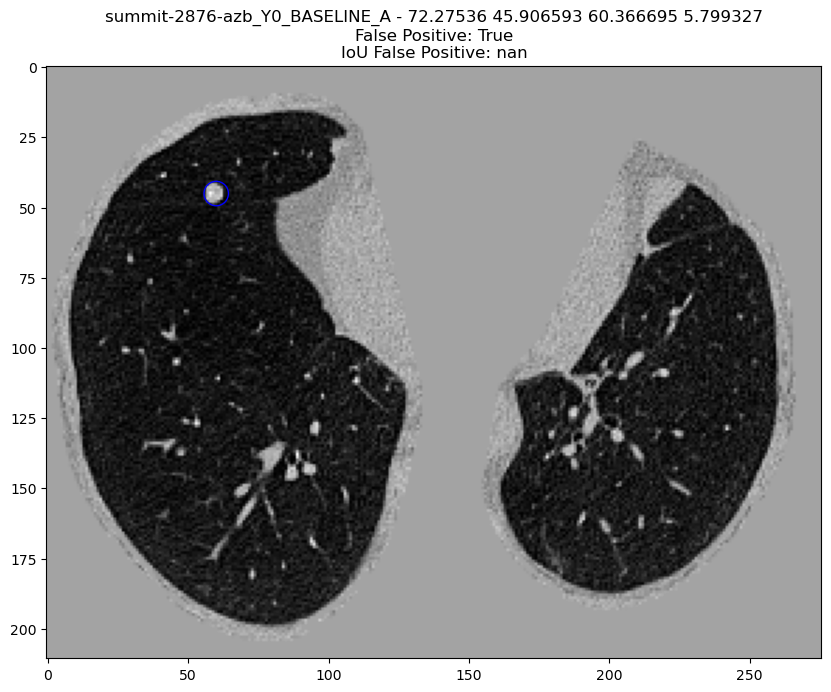

None
[[0 0 0 0]]
summit-5387-jpu_Y0_BASELINE_A - 184.0517 34.04131 225.74559 3.982297
False Positive: True
IoU False Positive: nan


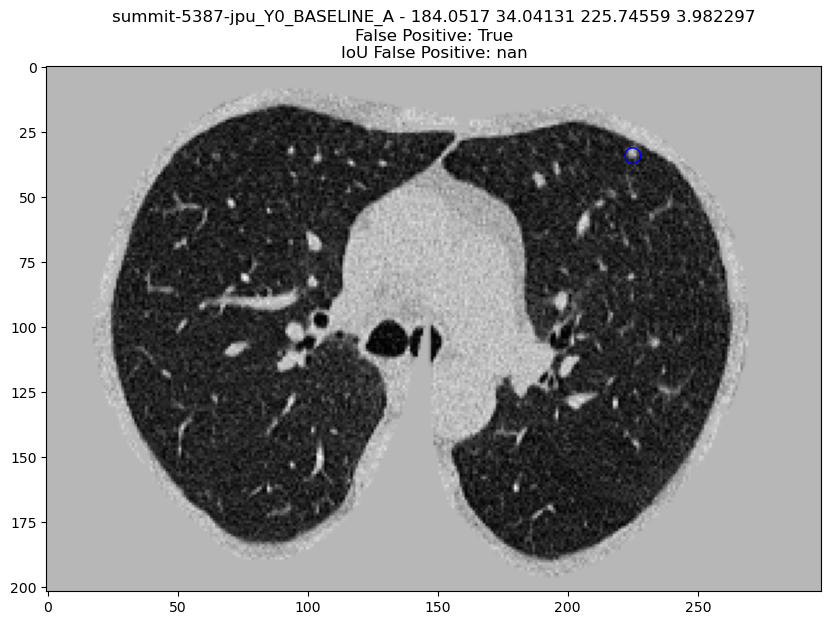

None
[[151.595       41.78999695  61.2099939    5.36230165]
 [ 89.335       73.43999695 221.1699939    1.89257705]
 [102.625       64.04999695 220.4599939    2.83886558]
 [166.795      119.28999695 190.7199939    2.96503738]]
summit-9366-kkj_Y0_BASELINE_A - 128.85559 65.10258 36.899994 5.2561803
False Positive: True
IoU False Positive: 0.0


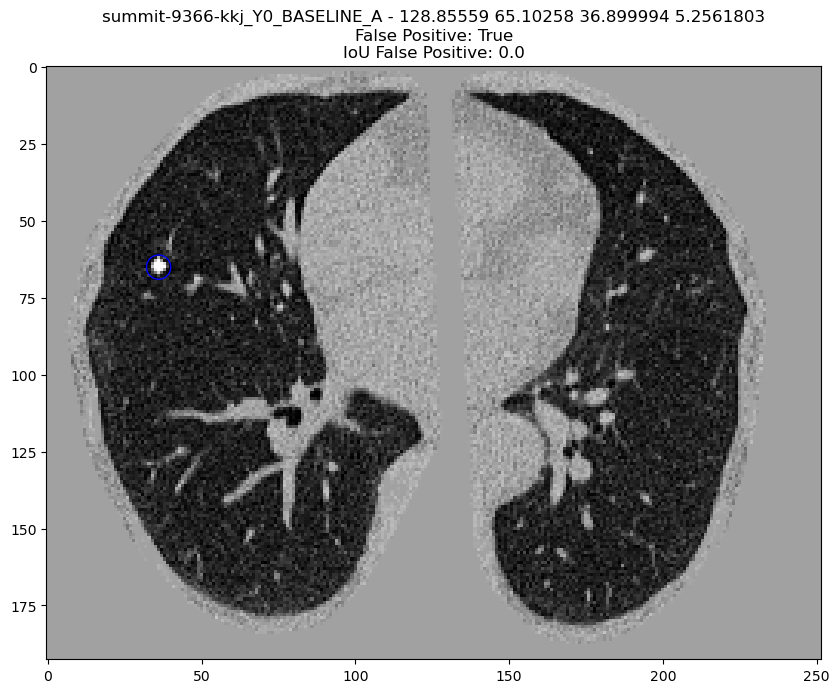

In [95]:
cnt = 0

df = false_positives_fpps['0.125']

for idx, row in df[df.distance_false_positive].sort_values(by='threshold', ascending=False).iterrows():
    study_id = row['name']
    x = row['row']
    y = row['col']
    z = row['index']
    diameter = row['diameter']
    

    copy_numpy_from_cluster(study_id)
    show_numpy_candidate_location(study_id, x, y, z, diameter, row.distance_false_positive, row.iou_false_positive)
    cnt+=1
    if cnt == 12:
        break

## MONAI Detection

/Users/john/Projects/SOTAEvaluationNoduleDetection/models/detection/result/trained_summit/summit/female_for_inference/result_female_for_inference.json
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/detection/result/trained_summit/summit/female_for_inference/annotations.csv
Total number of included nodule annotations: 2989
Total number of nodule annotations: 2989
Cases: 2337
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-5854-bku_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A

100%|██████████| 1000/1000 [02:41<00:00,  6.21it/s]


,0,159,476,1111,2381,4920,9999
0,0.215 (0.194 - 0.238),0.329 (0.303 - 0.354),0.455 (0.425 - 0.485),0.606 (0.579 - 0.632),0.743 (0.723 - 0.763),0.84 (0.825 - 0.856),0.909 (0.897 - 0.921)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.215,0.194,0.238
159,0.250,0.329,0.303,0.354
476,0.500,0.455,0.425,0.485
1111,1.000,0.606,0.579,0.632
2381,2.000,0.743,0.723,0.763
4920,4.000,0.840,0.825,0.856
9999,8.000,0.909,0.897,0.921


Mean Sensitivity: 0.59 Low Sensitivity: 0.56 High Sensitivity: 0.607


,True positives,2822
0,False positives,48939.000
1,False negatives,167.000
2,True negatives,0.000
3,Total number of candidates,53185.000
4,Total number of nodules,2989.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,1432.000
7,Sensitivity,0.944
8,Average number of candidates per scan,22.758


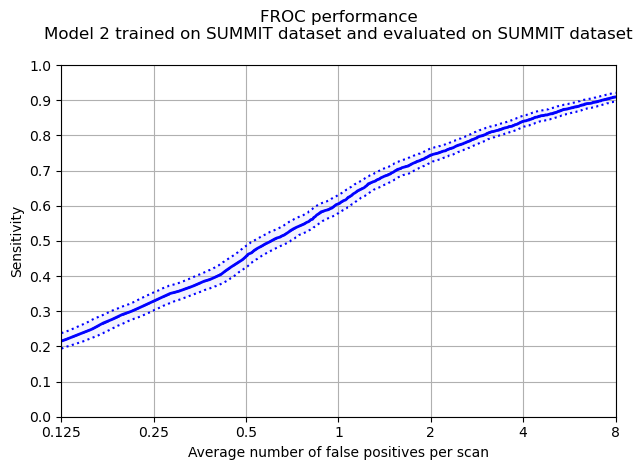

In [96]:

detection_predictions_path = combine_predictions(f'{workspace_path}/models/detection/result/trained_summit/summit/{flavour}', 'test')
detection_predictions = pd.read_csv(detection_predictions_path)

annotations = (
    pd.read_csv(f'{workspace_path}/metadata/summit/{flavour}/test_metadata.csv')
    .assign(name=lambda df: df.participant_id + '_Y0_BASELINE_A')
    .assign(row=lambda df: df['nodule_x_coordinate'])
    .assign(col=lambda df: df['nodule_y_coordinate'])
    .assign(index=lambda df: df['nodule_z_coordinate'])
    .assign(diameter=lambda df: df['nodule_diameter_mm'])
    .assign(diameter_cats=lambda df: pd.cut(
        df['nodule_diameter_mm'],
        bins=diameter_cats,
        labels=diameter_lbs
    ))
    .assign(nodule_site_combined=lambda df: df['nodule_site'].apply(combine_site))
    .assign(nodule_site_combined2=lambda df: df['nodule_site'].apply(combine_site2))
)

annotations.to_csv(f'{workspace_path}/models/detection/result/trained_summit/summit/{flavour}/annotations.csv', index=False)

detection_summit_summit = noduleCADEvaluation(
    annotations_filename=f'{workspace_path}/models/detection/result/trained_summit/summit/{flavour}/annotations.csv',
    annotations_excluded_filename=f'{workspace_path}/data/summit/metadata/annotations_excluded_empty.csv',
    seriesuids_filename=f'{workspace_path}/metadata/summit/{flavour}/test_scans.csv',
    results_filename=detection_predictions_path,
    filter='\nModel 2 trained on SUMMIT dataset and evaluated on SUMMIT dataset\n',
    outputDir=f'{workspace_path}/results/detection/trained_summit/summit/{flavour}',
)
caluclate_cpm_from_bootstrapping(f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/froc_predictions_bootstrapping.csv')
show_metrics(f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/CADAnalysis.txt')


### Gender analysis

Protected Group: FEMALE


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,29.0,47.0,7.0,7.0,10.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpyw_p3mf0/annotations.csv
Total number of included nodule annotations: 2975
Total number of nodule annotations: 2975
Cases: 2317
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-5854-bku_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark

100%|██████████| 1000/1000 [02:51<00:00,  5.82it/s]


,0,159,476,1111,2381,4920,9999
0,0.215 (0.193 - 0.24),0.329 (0.302 - 0.357),0.455 (0.424 - 0.488),0.605 (0.577 - 0.632),0.742 (0.72 - 0.762),0.839 (0.822 - 0.854),0.908 (0.895 - 0.92)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.215,0.193,0.240
159,0.250,0.329,0.302,0.357
476,0.500,0.455,0.424,0.488
1111,1.000,0.605,0.577,0.632
2381,2.000,0.742,0.720,0.762
4920,4.000,0.839,0.822,0.854
9999,8.000,0.908,0.895,0.920


Mean Sensitivity: 0.58 Low Sensitivity: 0.56 High Sensitivity: 0.608


,True positives,2808
0,False positives,48599.000
1,False negatives,167.000
2,True negatives,0.000
3,Total number of candidates,52827.000
4,Total number of nodules,2975.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,1428.000
7,Sensitivity,0.944
8,Average number of candidates per scan,22.800


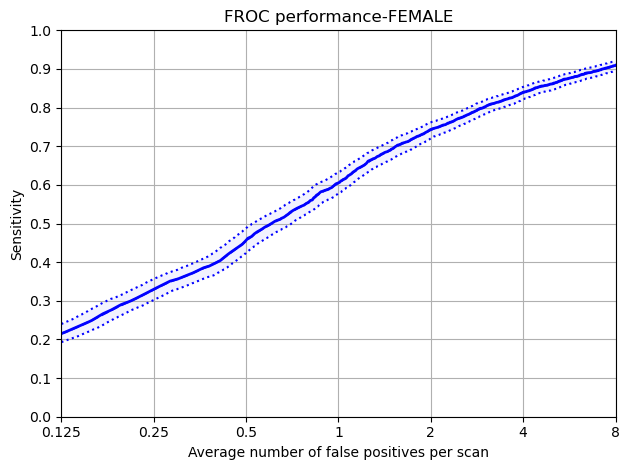

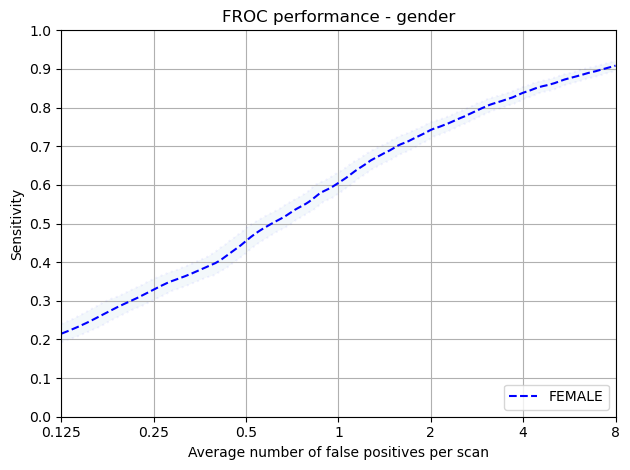

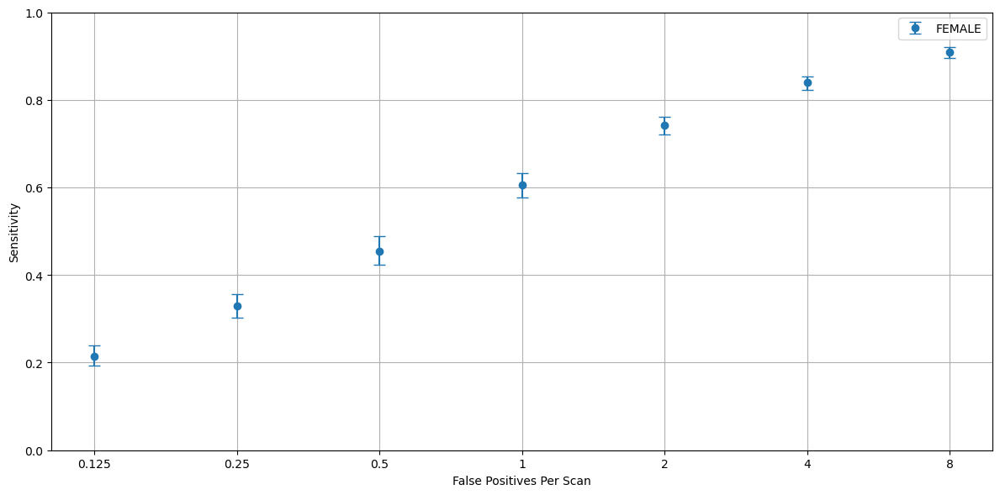

In [97]:


annotations = pd.read_csv(f'{workspace_path}/models/detection/result/trained_summit/summit/{flavour}/annotations.csv')

predictions = pd.read_csv(detection_predictions_path)

protected_group = 'gender'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('detection', flavour, 'Gender', data_dict)

### Age analysis

Protected Group: 70-75


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,32.0,47.0,7.0,8.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpww0uvtjl/annotations.csv
Total number of included nodule annotations: 735
Total number of nodule annotations: 735
Cases: 561
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:20<00:00, 48.15it/s]


,0,159,476,1111,2381,4920,9999
0,0.227 (0.183 - 0.281),0.346 (0.292 - 0.398),0.468 (0.417 - 0.52),0.605 (0.563 - 0.648),0.744 (0.71 - 0.78),0.841 (0.812 - 0.873),0.911 (0.891 - 0.933)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.227,0.183,0.281
159,0.250,0.346,0.292,0.398
476,0.500,0.468,0.417,0.520
1111,1.000,0.605,0.563,0.648
2381,2.000,0.744,0.710,0.780
4920,4.000,0.841,0.812,0.873
9999,8.000,0.911,0.891,0.933


Mean Sensitivity: 0.59 Low Sensitivity: 0.55 High Sensitivity: 0.633


,True positives,705
0,False positives,13177.000
1,False negatives,30.000
2,True negatives,0.000
3,Total number of candidates,14277.000
4,Total number of nodules,735.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,399.000
7,Sensitivity,0.959
8,Average number of candidates per scan,25.449


Protected Group: 60-64


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,25.0,48.0,8.0,9.0,10.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpum3_svfw/annotations.csv
Total number of included nodule annotations: 788
Total number of nodule annotations: 788
Cases: 556


100%|██████████| 1000/1000 [00:19<00:00, 50.31it/s]


,0,159,476,1111,2381,4920,9999
0,0.191 (0.142 - 0.24),0.289 (0.238 - 0.338),0.407 (0.344 - 0.468),0.569 (0.515 - 0.625),0.717 (0.674 - 0.758),0.82 (0.782 - 0.85),0.896 (0.867 - 0.922)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.191,0.142,0.240
159,0.250,0.289,0.238,0.338
476,0.500,0.407,0.344,0.468
1111,1.000,0.569,0.515,0.625
2381,2.000,0.717,0.674,0.758
4920,4.000,0.820,0.782,0.850
9999,8.000,0.896,0.867,0.922


Mean Sensitivity: 0.56 Low Sensitivity: 0.51 High Sensitivity: 0.6


,True positives,733
0,False positives,11265.000
1,False negatives,55.000
2,True negatives,0.000
3,Total number of candidates,12331.000
4,Total number of nodules,788.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,333.000
7,Sensitivity,0.930
8,Average number of candidates per scan,22.178


Protected Group: 55-59


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,28.0,57.0,5.0,4.0,6.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpp2zcjr8d/annotations.csv
Total number of included nodule annotations: 487
Total number of nodule annotations: 487
Cases: 507
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-5854-bku_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:16<00:00, 60.44it/s]


,0,159,476,1111,2381,4920,9999
0,0.254 (0.203 - 0.317),0.409 (0.353 - 0.472),0.557 (0.486 - 0.623),0.704 (0.647 - 0.757),0.803 (0.758 - 0.844),0.9 (0.869 - 0.932),0.946 (0.924 - 0.967)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.254,0.203,0.317
159,0.250,0.409,0.353,0.472
476,0.500,0.557,0.486,0.623
1111,1.000,0.704,0.647,0.757
2381,2.000,0.803,0.758,0.844
4920,4.000,0.900,0.869,0.932
9999,8.000,0.946,0.924,0.967


Mean Sensitivity: 0.65 Low Sensitivity: 0.61 High Sensitivity: 0.702


,True positives,468
0,False positives,8489.000
1,False negatives,19.000
2,True negatives,0.000
3,Total number of candidates,9179.000
4,Total number of nodules,487.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,223.000
7,Sensitivity,0.961
8,Average number of candidates per scan,18.105


Protected Group: 75+


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,41.0,31.0,8.0,10.0,10.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp7_uk0yrk/annotations.csv
Total number of included nodule annotations: 193
Total number of nodule annotations: 193
Cases: 129
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:05<00:00, 188.35it/s]


,0,159,476,1111,2381,4920,9999
0,0.225 (0.149 - 0.302),0.313 (0.223 - 0.405),0.463 (0.335 - 0.58),0.582 (0.5 - 0.673),0.706 (0.63 - 0.783),0.784 (0.717 - 0.85),0.88 (0.82 - 0.934)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.225,0.149,0.302
159,0.250,0.313,0.223,0.405
476,0.500,0.463,0.335,0.580
1111,1.000,0.582,0.500,0.673
2381,2.000,0.706,0.630,0.783
4920,4.000,0.784,0.717,0.850
9999,8.000,0.880,0.820,0.934


Mean Sensitivity: 0.56 Low Sensitivity: 0.48 High Sensitivity: 0.647


,True positives,184
0,False positives,3386.000
1,False negatives,9.000
2,True negatives,0.000
3,Total number of candidates,3660.000
4,Total number of nodules,193.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,91.000
7,Sensitivity,0.953
8,Average number of candidates per scan,28.372


Protected Group: 65-69


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,27.0,46.0,5.0,6.0,15.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp1twmk76f/annotations.csv
Total number of included nodule annotations: 772
Total number of nodule annotations: 772
Cases: 568
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6225-qvf_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6225-qvf_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:25<00:00, 38.92it/s]


,0,159,476,1111,2381,4920,9999
0,0.212 (0.169 - 0.26),0.316 (0.271 - 0.363),0.432 (0.376 - 0.488),0.591 (0.531 - 0.65),0.735 (0.69 - 0.78),0.82 (0.784 - 0.858),0.89 (0.862 - 0.918)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.212,0.169,0.260
159,0.250,0.316,0.271,0.363
476,0.500,0.432,0.376,0.488
1111,1.000,0.591,0.531,0.650
2381,2.000,0.735,0.690,0.780
4920,4.000,0.820,0.784,0.858
9999,8.000,0.890,0.862,0.918


Mean Sensitivity: 0.57 Low Sensitivity: 0.53 High Sensitivity: 0.617


,True positives,718
0,False positives,12282.000
1,False negatives,54.000
2,True negatives,0.000
3,Total number of candidates,13380.000
4,Total number of nodules,772.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,382.000
7,Sensitivity,0.930
8,Average number of candidates per scan,23.556


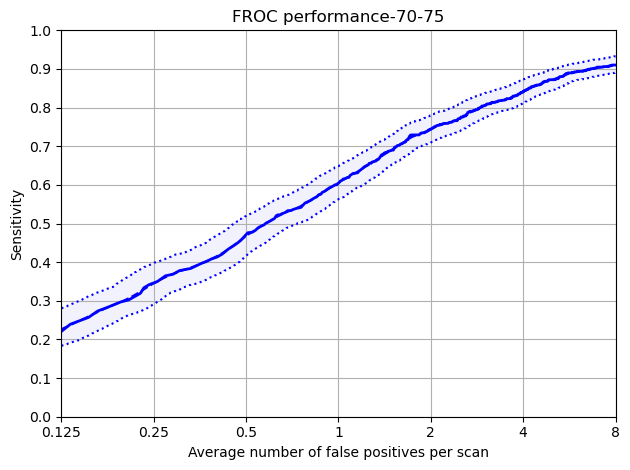

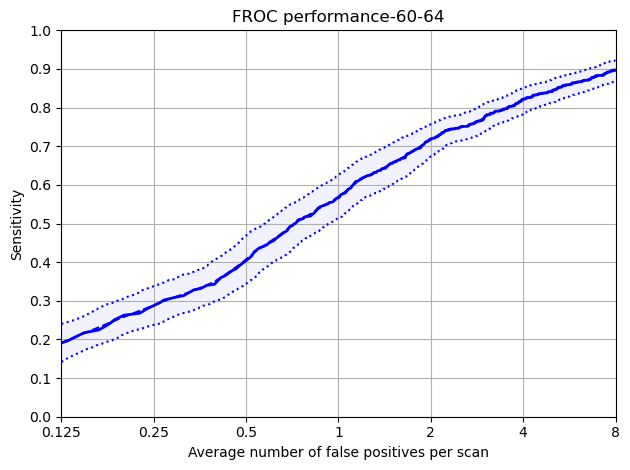

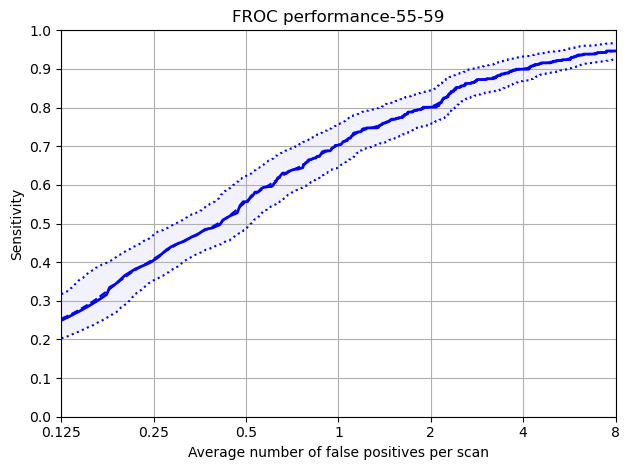

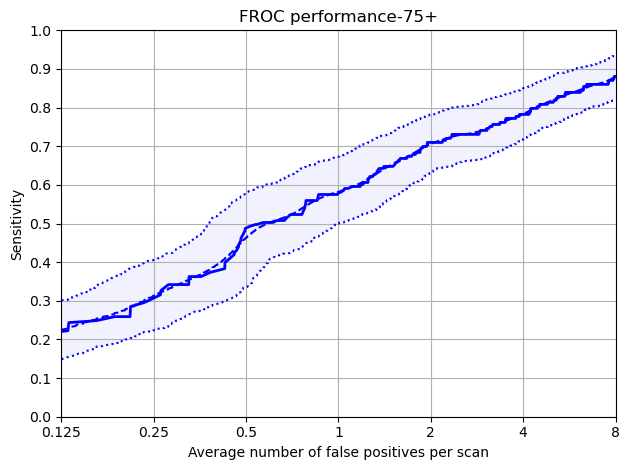

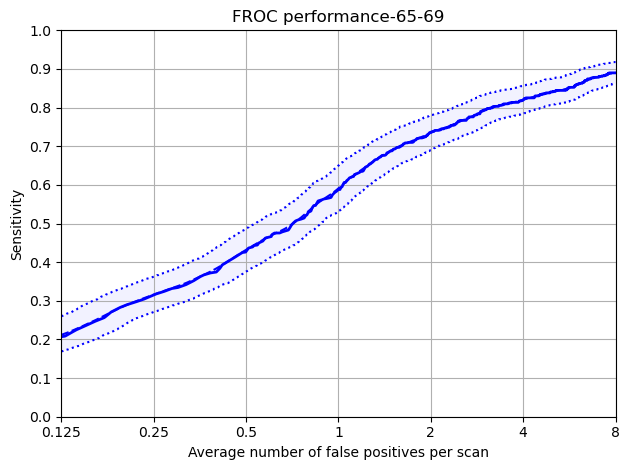

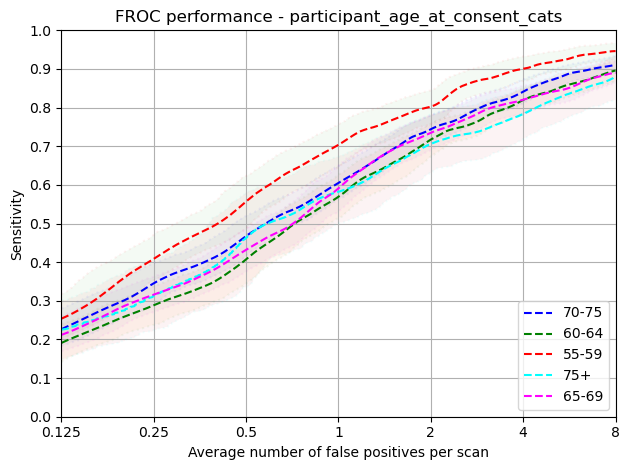

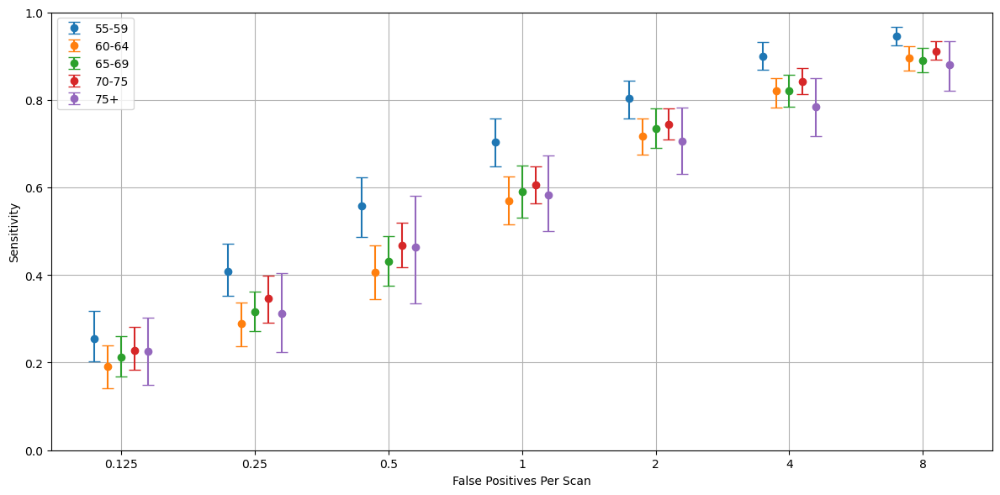

In [98]:
protected_group = 'participant_age_at_consent_cats'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('detection', flavour, 'Age', data_dict, ['55-59','60-64','65-69','70-75','75+'])

### Ethnicity Analysis

Protected Group: White


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,28.0,47.0,7.0,7.0,10.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpv4v5n26g/annotations.csv
Total number of included nodule annotations: 2636
Total number of nodule annotations: 2636
Cases: 1974
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-5854-bku_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark

100%|██████████| 1000/1000 [02:24<00:00,  6.94it/s]


,0,159,476,1111,2381,4920,9999
0,0.217 (0.195 - 0.241),0.326 (0.298 - 0.353),0.45 (0.419 - 0.483),0.599 (0.571 - 0.625),0.74 (0.717 - 0.762),0.834 (0.815 - 0.851),0.905 (0.89 - 0.919)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.217,0.195,0.241
159,0.250,0.326,0.298,0.353
476,0.500,0.450,0.419,0.483
1111,1.000,0.599,0.571,0.625
2381,2.000,0.740,0.717,0.762
4920,4.000,0.834,0.815,0.851
9999,8.000,0.905,0.890,0.919


Mean Sensitivity: 0.58 Low Sensitivity: 0.56 High Sensitivity: 0.605


,True positives,2492
0,False positives,42888.000
1,False negatives,144.000
2,True negatives,0.000
3,Total number of candidates,46660.000
4,Total number of nodules,2636.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,1288.000
7,Sensitivity,0.945
8,Average number of candidates per scan,23.637


Protected Group: Other ethnic groups


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,32.0,36.0,4.0,15.0,13.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpgp5mkzug/annotations.csv
Total number of included nodule annotations: 47
Total number of nodule annotations: 47
Cases: 58


100%|██████████| 1000/1000 [00:01<00:00, 584.01it/s]


,0,159,476,1111,2381,4920,9999
0,0.171 (0.067 - 0.44),0.343 (0.119 - 0.6),0.537 (0.339 - 0.729),0.637 (0.479 - 0.804),0.692 (0.549 - 0.836),0.827 (0.69 - 0.956),0.869 (0.739 - 0.978)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.171,0.067,0.440
159,0.250,0.343,0.119,0.600
476,0.500,0.537,0.339,0.729
1111,1.000,0.637,0.479,0.804
2381,2.000,0.692,0.549,0.836
4920,4.000,0.827,0.690,0.956
9999,8.000,0.869,0.739,0.978


Mean Sensitivity: 0.58 Low Sensitivity: 0.43 High Sensitivity: 0.763


,True positives,41
0,False positives,980.000
1,False negatives,6.000
2,True negatives,0.000
3,Total number of candidates,1036.000
4,Total number of nodules,47.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,15.000
7,Sensitivity,0.872
8,Average number of candidates per scan,17.862


Protected Group: Black


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,33.0,56.0,4.0,4.0,5.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmprdfw8zky/annotations.csv
Total number of included nodule annotations: 169
Total number of nodule annotations: 169
Cases: 171


100%|██████████| 1000/1000 [00:04<00:00, 222.32it/s]


,0,159,476,1111,2381,4920,9999
0,0.295 (0.154 - 0.425),0.408 (0.293 - 0.53),0.536 (0.416 - 0.666),0.714 (0.593 - 0.832),0.836 (0.754 - 0.917),0.916 (0.861 - 0.964),0.964 (0.932 - 0.992)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.295,0.154,0.425
159,0.250,0.408,0.293,0.530
476,0.500,0.536,0.416,0.666
1111,1.000,0.714,0.593,0.832
2381,2.000,0.836,0.754,0.917
4920,4.000,0.916,0.861,0.964
9999,8.000,0.964,0.932,0.992


Mean Sensitivity: 0.67 Low Sensitivity: 0.57 High Sensitivity: 0.761


,True positives,164
0,False positives,2714.000
1,False negatives,5.000
2,True negatives,0.000
3,Total number of candidates,2934.000
4,Total number of nodules,169.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,56.000
7,Sensitivity,0.970
8,Average number of candidates per scan,17.158


Protected Group: Asian or Asian British


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,23.0,49.0,5.0,16.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpdtlqnxpm/annotations.csv
Total number of included nodule annotations: 57
Total number of nodule annotations: 57
Cases: 58


100%|██████████| 1000/1000 [00:01<00:00, 514.88it/s]


,0,159,476,1111,2381,4920,9999
0,0.144 (0.026 - 0.29),0.221 (0.103 - 0.356),0.332 (0.169 - 0.524),0.518 (0.385 - 0.657),0.647 (0.527 - 0.762),0.773 (0.667 - 0.891),0.864 (0.762 - 0.953)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.144,0.026,0.290
159,0.250,0.221,0.103,0.356
476,0.500,0.332,0.169,0.524
1111,1.000,0.518,0.385,0.657
2381,2.000,0.647,0.527,0.762
4920,4.000,0.773,0.667,0.891
9999,8.000,0.864,0.762,0.953


Mean Sensitivity: 0.5 Low Sensitivity: 0.38 High Sensitivity: 0.633


,True positives,50
0,False positives,1077.000
1,False negatives,7.000
2,True negatives,0.000
3,Total number of candidates,1165.000
4,Total number of nodules,57.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,38.000
7,Sensitivity,0.877
8,Average number of candidates per scan,20.086


Protected Group: Mixed


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,41.0,42.0,3.0,6.0,8.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpdrr_6w7b/annotations.csv
Total number of included nodule annotations: 66
Total number of nodule annotations: 66
Cases: 60


100%|██████████| 1000/1000 [00:01<00:00, 585.50it/s]


,0,159,476,1111,2381,4920,9999
0,0.201 (0.071 - 0.438),0.33 (0.162 - 0.532),0.442 (0.245 - 0.712),0.605 (0.411 - 0.842),0.762 (0.594 - 0.912),0.836 (0.721 - 0.935),0.893 (0.821 - 0.958)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.201,0.071,0.438
159,0.250,0.330,0.162,0.532
476,0.500,0.442,0.245,0.712
1111,1.000,0.605,0.411,0.842
2381,2.000,0.762,0.594,0.912
4920,4.000,0.836,0.721,0.935
9999,8.000,0.893,0.821,0.958


Mean Sensitivity: 0.58 Low Sensitivity: 0.43 High Sensitivity: 0.761


,True positives,61
0,False positives,940.000
1,False negatives,5.000
2,True negatives,0.000
3,Total number of candidates,1032.000
4,Total number of nodules,66.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,31.000
7,Sensitivity,0.924
8,Average number of candidates per scan,17.200


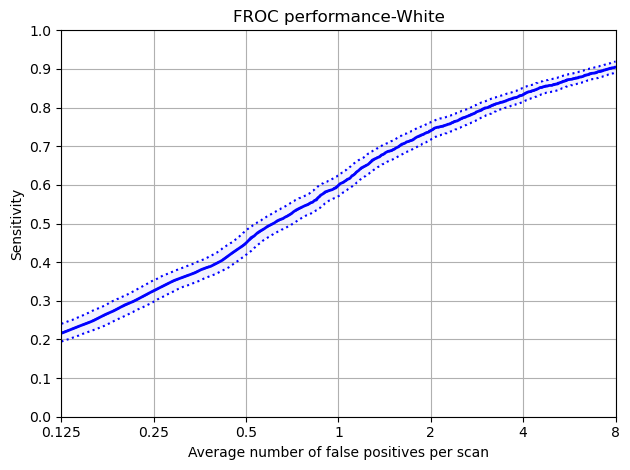

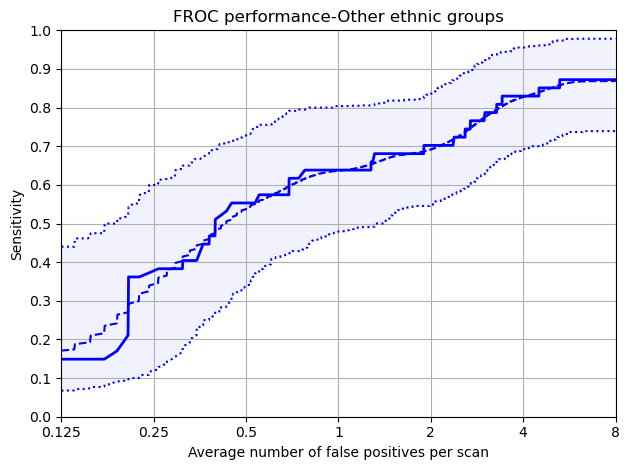

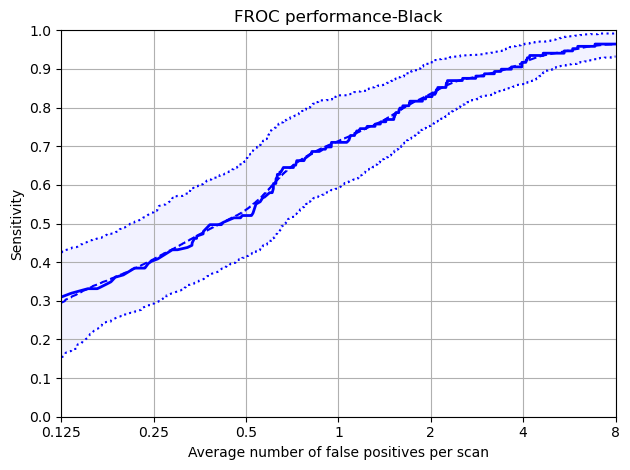

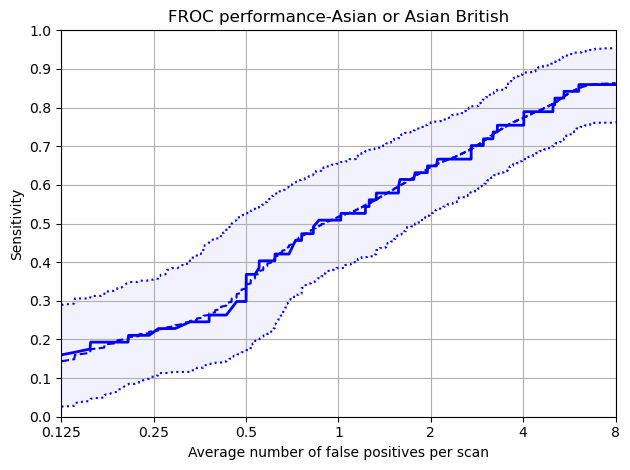

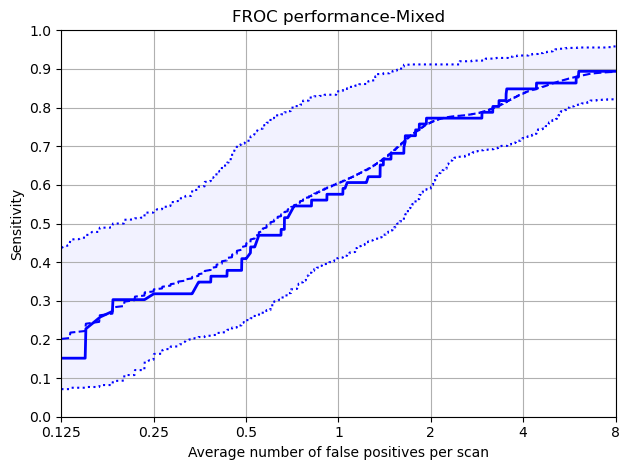

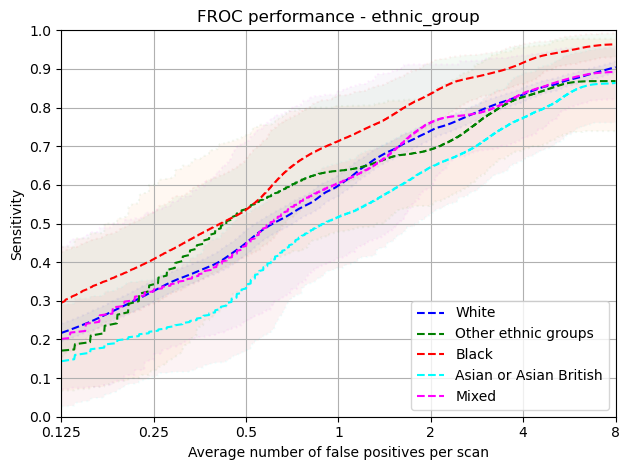

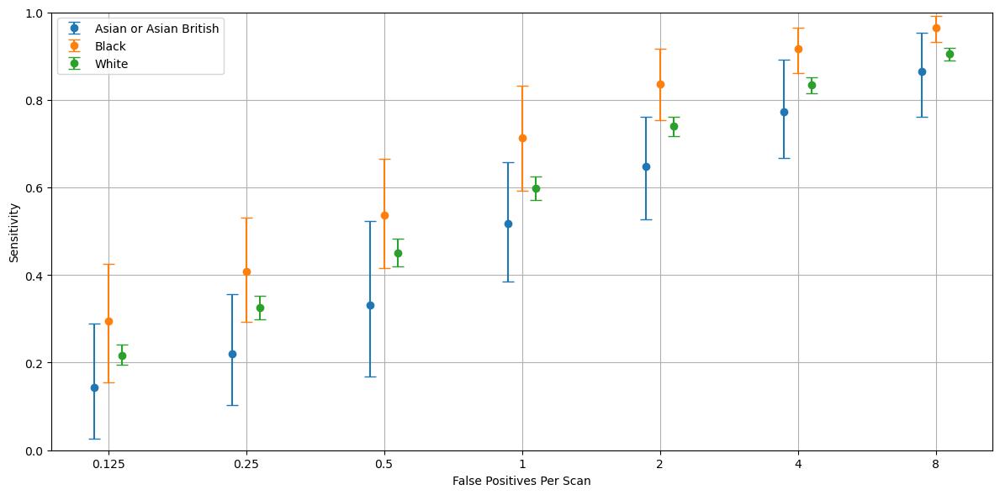

In [99]:
protected_group = 'ethnic_group'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('detection', flavour,'Ethnic Group', data_dict, order=['Asian or Asian British','Black','White'])

### IMDRank_tertile

Protected Group: Low


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,30.0,45.0,6.0,7.0,12.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpltryomab/annotations.csv
Total number of included nodule annotations: 962
Total number of nodule annotations: 962
Cases: 754


100%|██████████| 1000/1000 [00:32<00:00, 30.59it/s]


,0,159,476,1111,2381,4920,9999
0,0.213 (0.166 - 0.255),0.343 (0.296 - 0.387),0.479 (0.431 - 0.526),0.618 (0.574 - 0.662),0.752 (0.716 - 0.786),0.846 (0.82 - 0.873),0.91 (0.887 - 0.932)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.213,0.166,0.255
159,0.250,0.343,0.296,0.387
476,0.500,0.479,0.431,0.526
1111,1.000,0.618,0.574,0.662
2381,2.000,0.752,0.716,0.786
4920,4.000,0.846,0.820,0.873
9999,8.000,0.910,0.887,0.932


Mean Sensitivity: 0.59 Low Sensitivity: 0.56 High Sensitivity: 0.632


,True positives,909
0,False positives,16067.000
1,False negatives,53.000
2,True negatives,0.000
3,Total number of candidates,17484.000
4,Total number of nodules,962.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,508.000
7,Sensitivity,0.945
8,Average number of candidates per scan,23.188


Protected Group: High


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,26.0,48.0,7.0,9.0,10.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpr7furf26/annotations.csv
Total number of included nodule annotations: 1043
Total number of nodule annotations: 1043
Cases: 793


100%|██████████| 1000/1000 [00:39<00:00, 25.01it/s]


,0,159,476,1111,2381,4920,9999
0,0.21 (0.171 - 0.254),0.311 (0.269 - 0.354),0.427 (0.379 - 0.479),0.568 (0.525 - 0.609),0.729 (0.69 - 0.765),0.825 (0.792 - 0.854),0.894 (0.869 - 0.916)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.210,0.171,0.254
159,0.250,0.311,0.269,0.354
476,0.500,0.427,0.379,0.479
1111,1.000,0.568,0.525,0.609
2381,2.000,0.729,0.690,0.765
4920,4.000,0.825,0.792,0.854
9999,8.000,0.894,0.869,0.916


Mean Sensitivity: 0.57 Low Sensitivity: 0.53 High Sensitivity: 0.604


,True positives,979
0,False positives,16722.000
1,False negatives,64.000
2,True negatives,0.000
3,Total number of candidates,18244.000
4,Total number of nodules,1043.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,543.000
7,Sensitivity,0.939
8,Average number of candidates per scan,23.006


Protected Group: Medium


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,31.0,50.0,6.0,5.0,9.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpqprwp8et/annotations.csv
Total number of included nodule annotations: 960
Total number of nodule annotations: 960
Cases: 751
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-5854-bku_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark No

100%|██████████| 1000/1000 [00:32<00:00, 30.75it/s]


,0,159,476,1111,2381,4920,9999
0,0.224 (0.186 - 0.261),0.336 (0.289 - 0.383),0.462 (0.41 - 0.516),0.636 (0.588 - 0.682),0.747 (0.713 - 0.78),0.844 (0.814 - 0.874),0.92 (0.899 - 0.939)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.224,0.186,0.261
159,0.250,0.336,0.289,0.383
476,0.500,0.462,0.410,0.516
1111,1.000,0.636,0.588,0.682
2381,2.000,0.747,0.713,0.780
4920,4.000,0.844,0.814,0.874
9999,8.000,0.920,0.899,0.939


Mean Sensitivity: 0.6 Low Sensitivity: 0.56 High Sensitivity: 0.634


,True positives,910
0,False positives,15534.000
1,False negatives,50.000
2,True negatives,0.000
3,Total number of candidates,16809.000
4,Total number of nodules,960.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,373.000
7,Sensitivity,0.948
8,Average number of candidates per scan,22.382


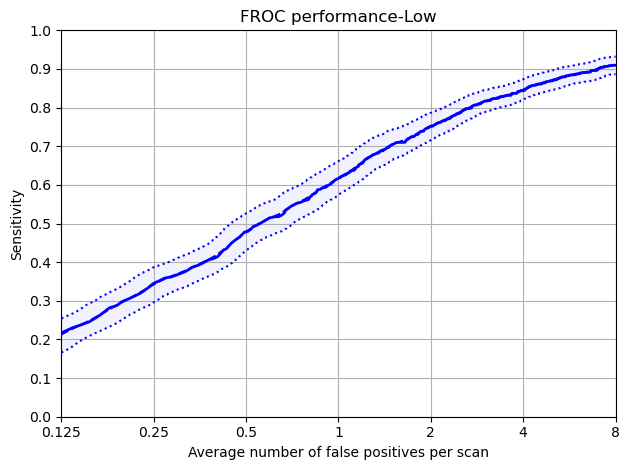

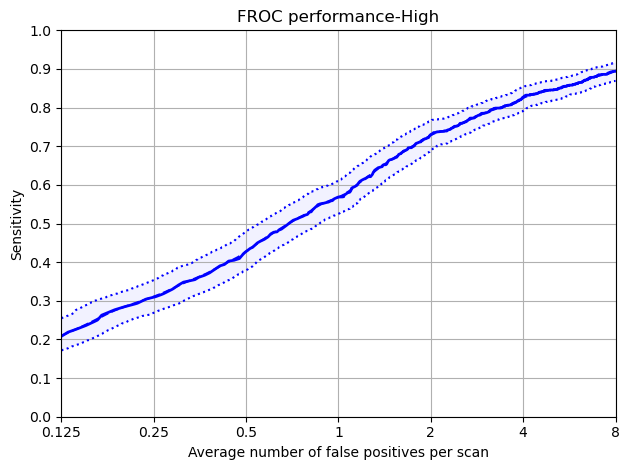

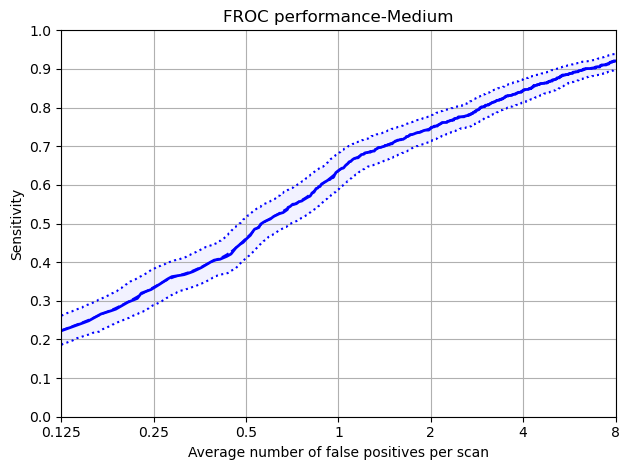

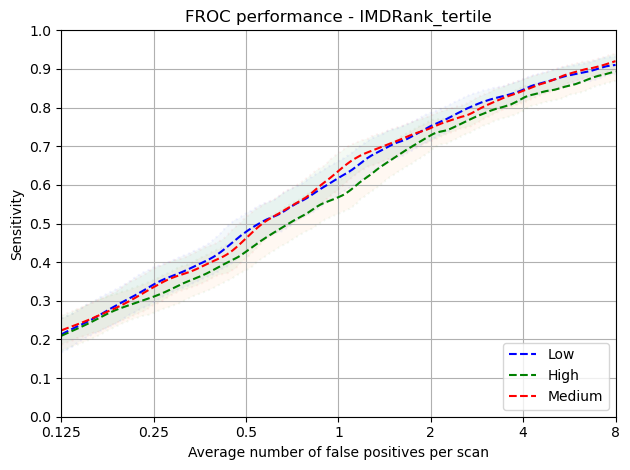

In [100]:
protected_group = 'IMDRank_tertile'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)

### Smoking Pack Years


Protected Group: High (50+)


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,29.0,43.0,6.0,8.0,14.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp7s7oc1sp/annotations.csv
Total number of included nodule annotations: 766
Total number of nodule annotations: 766
Cases: 573
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-5854-bku_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:31<00:00, 32.04it/s]


,0,159,476,1111,2381,4920,9999
0,0.179 (0.134 - 0.229),0.299 (0.248 - 0.352),0.469 (0.416 - 0.524),0.611 (0.56 - 0.654),0.726 (0.682 - 0.768),0.836 (0.801 - 0.871),0.907 (0.876 - 0.933)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.179,0.134,0.229
159,0.250,0.299,0.248,0.352
476,0.500,0.469,0.416,0.524
1111,1.000,0.611,0.560,0.654
2381,2.000,0.726,0.682,0.768
4920,4.000,0.836,0.801,0.871
9999,8.000,0.907,0.876,0.933


Mean Sensitivity: 0.58 Low Sensitivity: 0.53 High Sensitivity: 0.619


,True positives,731
0,False positives,13143.000
1,False negatives,35.000
2,True negatives,0.000
3,Total number of candidates,14247.000
4,Total number of nodules,766.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,374.000
7,Sensitivity,0.954
8,Average number of candidates per scan,24.864


Protected Group: Low (15-35)


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,28.0,50.0,6.0,6.0,10.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp1vivjagm/annotations.csv
Total number of included nodule annotations: 1156
Total number of nodule annotations: 1156
Cases: 919
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:45<00:00, 21.85it/s]


,0,159,476,1111,2381,4920,9999
0,0.244 (0.199 - 0.29),0.353 (0.316 - 0.389),0.464 (0.421 - 0.508),0.606 (0.568 - 0.648),0.754 (0.726 - 0.781),0.835 (0.811 - 0.858),0.906 (0.886 - 0.925)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.244,0.199,0.290
159,0.250,0.353,0.316,0.389
476,0.500,0.464,0.421,0.508
1111,1.000,0.606,0.568,0.648
2381,2.000,0.754,0.726,0.781
4920,4.000,0.835,0.811,0.858
9999,8.000,0.906,0.886,0.925


Mean Sensitivity: 0.59 Low Sensitivity: 0.56 High Sensitivity: 0.628


,True positives,1081
0,False positives,18371.000
1,False negatives,75.000
2,True negatives,0.000
3,Total number of candidates,19967.000
4,Total number of nodules,1156.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,516.000
7,Sensitivity,0.935
8,Average number of candidates per scan,21.727


Protected Group: Medium (35-50)


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,30.0,47.0,8.0,8.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp_03zqypf/annotations.csv
Total number of included nodule annotations: 1053
Total number of nodule annotations: 1053
Cases: 827
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6225-qvf_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark 

100%|██████████| 1000/1000 [00:35<00:00, 27.96it/s]


,0,159,476,1111,2381,4920,9999
0,0.217 (0.177 - 0.259),0.322 (0.273 - 0.369),0.432 (0.377 - 0.493),0.607 (0.552 - 0.657),0.739 (0.701 - 0.774),0.842 (0.814 - 0.869),0.91 (0.889 - 0.93)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.217,0.177,0.259
159,0.250,0.322,0.273,0.369
476,0.500,0.432,0.377,0.493
1111,1.000,0.607,0.552,0.657
2381,2.000,0.739,0.701,0.774
4920,4.000,0.842,0.814,0.869
9999,8.000,0.910,0.889,0.930


Mean Sensitivity: 0.58 Low Sensitivity: 0.54 High Sensitivity: 0.622


,True positives,996
0,False positives,17085.000
1,False negatives,57.000
2,True negatives,0.000
3,Total number of candidates,18613.000
4,Total number of nodules,1053.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,538.000
7,Sensitivity,0.946
8,Average number of candidates per scan,22.507


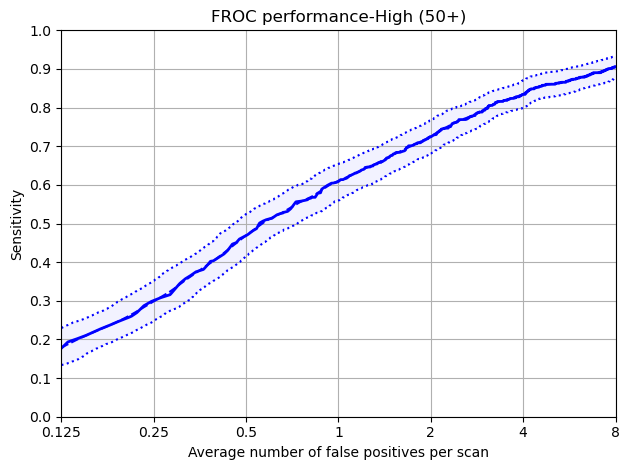

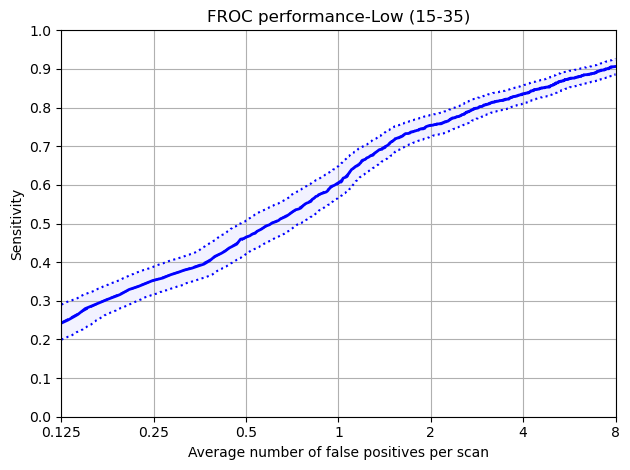

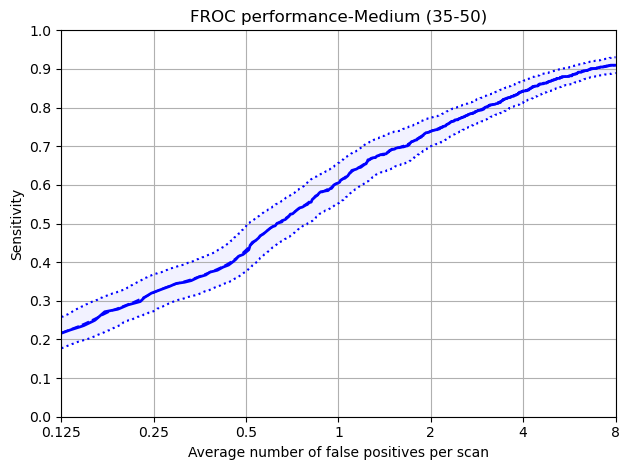

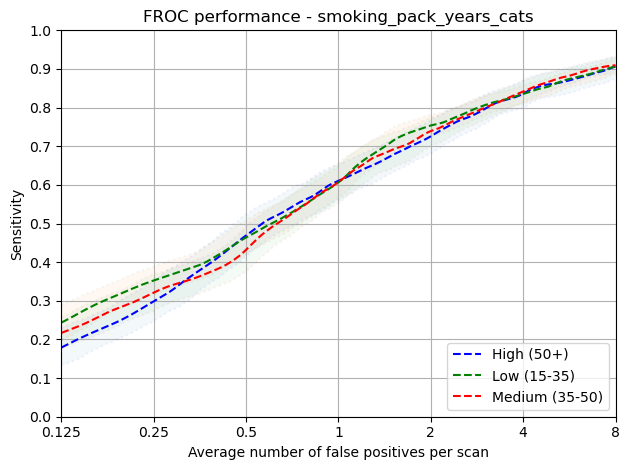

In [101]:
protected_group = 'smoking_pack_years_cats'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable Vs Non-Actionable

Protected Group: Non-Actionable


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,14.0,85.0,1.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp5v6ass68/annotations.csv
Total number of included nodule annotations: 971
Total number of nodule annotations: 971
Cases: 1544
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [01:12<00:00, 13.77it/s]


,0,159,476,1111,2381,4920,9999
0,0.241 (0.203 - 0.283),0.381 (0.345 - 0.418),0.534 (0.492 - 0.576),0.707 (0.673 - 0.739),0.817 (0.791 - 0.842),0.898 (0.877 - 0.918),0.952 (0.939 - 0.966)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.241,0.203,0.283
159,0.250,0.381,0.345,0.418
476,0.500,0.534,0.492,0.576
1111,1.000,0.707,0.673,0.739
2381,2.000,0.817,0.791,0.842
4920,4.000,0.898,0.877,0.918
9999,8.000,0.952,0.939,0.966


Mean Sensitivity: 0.65 Low Sensitivity: 0.62 High Sensitivity: 0.677


,True positives,947
0,False positives,28568.000
1,False negatives,24.000
2,True negatives,0.000
3,Total number of candidates,29702.000
4,Total number of nodules,971.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,191.000
7,Sensitivity,0.975
8,Average number of candidates per scan,19.237


Protected Group: Actonable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,36.0,29.0,10.0,10.0,15.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpucbb8msd/annotations.csv
Total number of included nodule annotations: 2004
Total number of nodule annotations: 2004
Cases: 774
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-5854-bku_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6225-qvf_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6225-qvf_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:58<00:00, 17.14it/s]


,0,159,476,1111,2381,4920,9999
0,0.23 (0.195 - 0.264),0.322 (0.29 - 0.351),0.429 (0.388 - 0.466),0.55 (0.516 - 0.586),0.688 (0.657 - 0.716),0.79 (0.768 - 0.811),0.869 (0.852 - 0.887)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.230,0.195,0.264
159,0.250,0.322,0.290,0.351
476,0.500,0.429,0.388,0.466
1111,1.000,0.550,0.516,0.586
2381,2.000,0.688,0.657,0.716
4920,4.000,0.790,0.768,0.811
9999,8.000,0.869,0.852,0.887


Mean Sensitivity: 0.55 Low Sensitivity: 0.52 High Sensitivity: 0.583


,True positives,1861
0,False positives,20031.000
1,False negatives,143.000
2,True negatives,0.000
3,Total number of candidates,23125.000
4,Total number of nodules,2004.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,1237.000
7,Sensitivity,0.929
8,Average number of candidates per scan,29.877


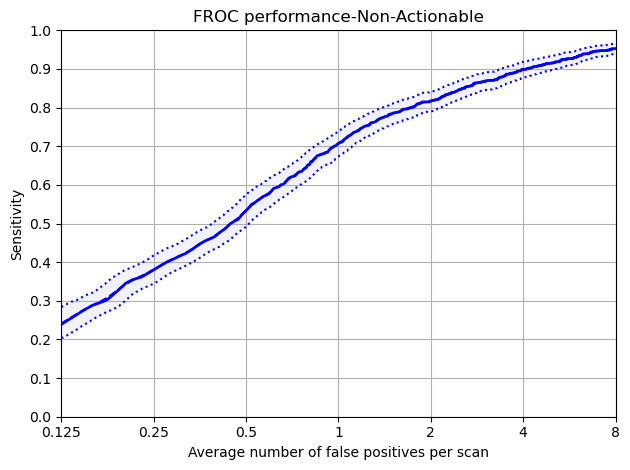

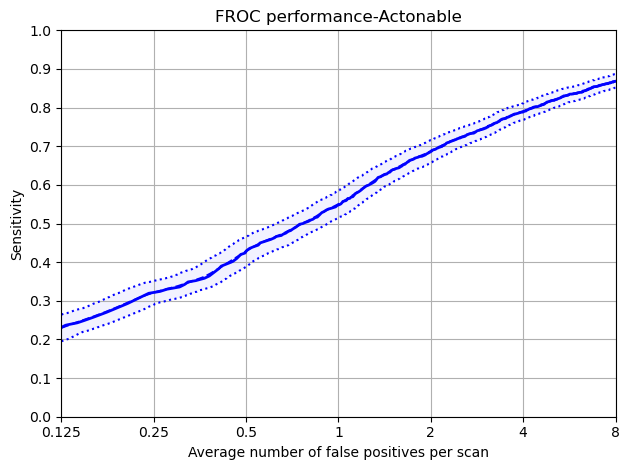

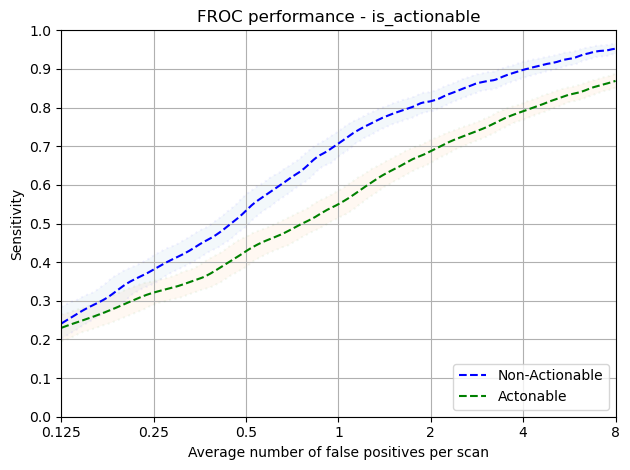

In [102]:
protected_group = 'is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable Gender

Protected Group: Female


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,36.0,29.0,10.0,10.0,15.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpigswsfd7/annotations.csv
Total number of included nodule annotations: 2004
Total number of nodule annotations: 2004
Cases: 774
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-5854-bku_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6225-qvf_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6225-qvf_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:49<00:00, 20.35it/s]


,0,159,476,1111,2381,4920,9999
0,0.23 (0.194 - 0.262),0.321 (0.292 - 0.349),0.428 (0.389 - 0.465),0.549 (0.513 - 0.584),0.686 (0.656 - 0.714),0.79 (0.768 - 0.811),0.869 (0.851 - 0.888)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.230,0.194,0.262
159,0.250,0.321,0.292,0.349
476,0.500,0.428,0.389,0.465
1111,1.000,0.549,0.513,0.584
2381,2.000,0.686,0.656,0.714
4920,4.000,0.790,0.768,0.811
9999,8.000,0.869,0.851,0.888


Mean Sensitivity: 0.55 Low Sensitivity: 0.52 High Sensitivity: 0.582


,True positives,1861
0,False positives,20031.000
1,False negatives,143.000
2,True negatives,0.000
3,Total number of candidates,23125.000
4,Total number of nodules,2004.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,1237.000
7,Sensitivity,0.929
8,Average number of candidates per scan,29.877


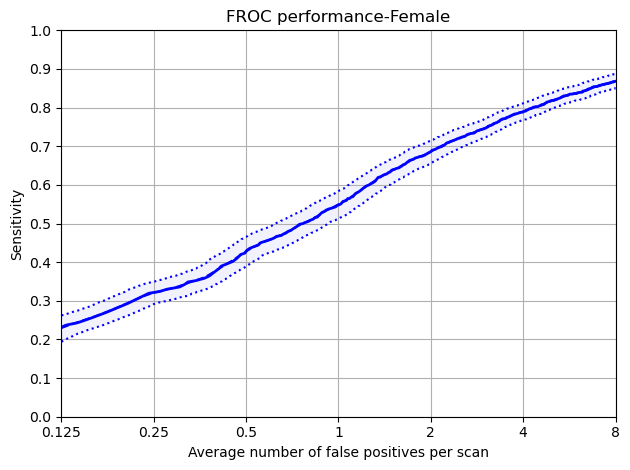

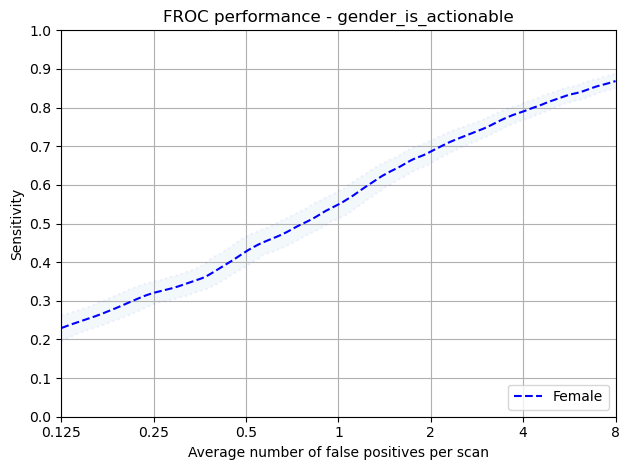

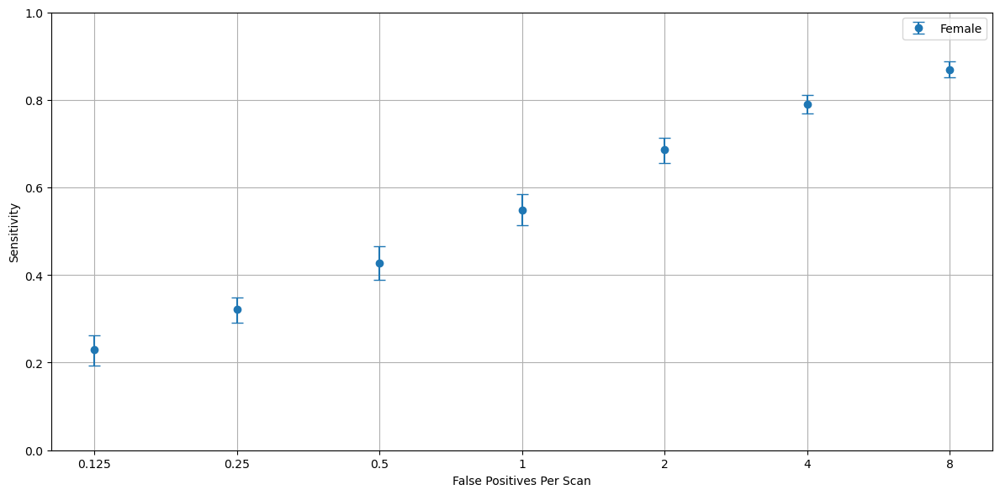

In [103]:
protected_group = 'gender_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('detection', flavour,'Actionable, Gender', data_dict)

### Non-Actionable Gender

Protected Group: Female


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,14.0,85.0,1.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpfz2rjg45/annotations.csv
Total number of included nodule annotations: 971
Total number of nodule annotations: 971
Cases: 1544
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [01:23<00:00, 11.98it/s]


,0,159,476,1111,2381,4920,9999
0,0.239 (0.203 - 0.281),0.38 (0.344 - 0.415),0.533 (0.491 - 0.574),0.706 (0.674 - 0.737),0.816 (0.791 - 0.839),0.897 (0.877 - 0.92),0.952 (0.938 - 0.966)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.239,0.203,0.281
159,0.250,0.380,0.344,0.415
476,0.500,0.533,0.491,0.574
1111,1.000,0.706,0.674,0.737
2381,2.000,0.816,0.791,0.839
4920,4.000,0.897,0.877,0.920
9999,8.000,0.952,0.938,0.966


Mean Sensitivity: 0.65 Low Sensitivity: 0.62 High Sensitivity: 0.676


,True positives,947
0,False positives,28568.000
1,False negatives,24.000
2,True negatives,0.000
3,Total number of candidates,29702.000
4,Total number of nodules,971.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,191.000
7,Sensitivity,0.975
8,Average number of candidates per scan,19.237


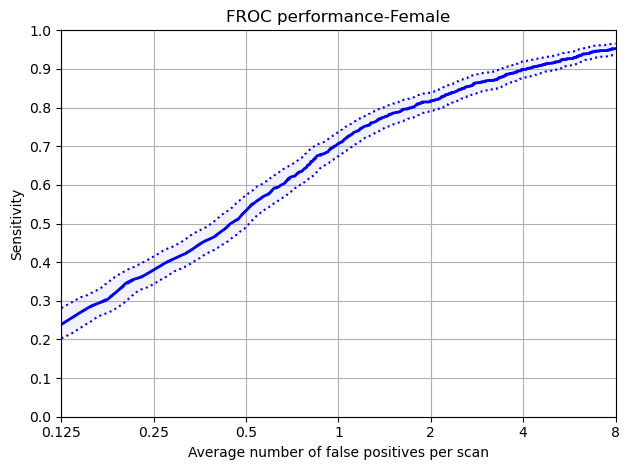

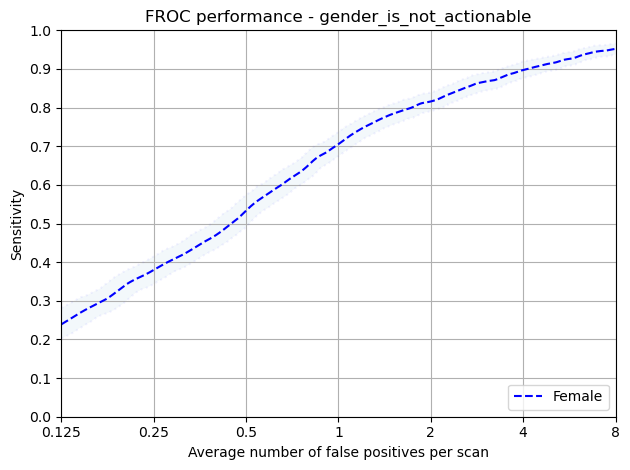

In [104]:
protected_group = 'gender_is_not_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)


### Actionable Ethnic Group

Protected Group: White


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,35.0,29.0,10.0,10.0,15.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpbxb498lf/annotations.csv
Total number of included nodule annotations: 1788
Total number of nodule annotations: 1788
Cases: 677
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-5854-bku_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6225-qvf_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6225-qvf_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:40<00:00, 24.73it/s]


,0,159,476,1111,2381,4920,9999
0,0.23 (0.195 - 0.263),0.326 (0.292 - 0.358),0.43 (0.39 - 0.471),0.549 (0.514 - 0.583),0.686 (0.655 - 0.717),0.789 (0.766 - 0.813),0.865 (0.845 - 0.884)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.230,0.195,0.263
159,0.250,0.326,0.292,0.358
476,0.500,0.430,0.390,0.471
1111,1.000,0.549,0.514,0.583
2381,2.000,0.686,0.655,0.717
4920,4.000,0.789,0.766,0.813
9999,8.000,0.865,0.845,0.884


Mean Sensitivity: 0.55 Low Sensitivity: 0.52 High Sensitivity: 0.584


,True positives,1665
0,False positives,17957.000
1,False negatives,123.000
2,True negatives,0.000
3,Total number of candidates,20741.000
4,Total number of nodules,1788.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,1123.000
7,Sensitivity,0.931
8,Average number of candidates per scan,30.637


Protected Group: Black


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,43.0,39.0,6.0,6.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpznsaewt4/annotations.csv
Total number of included nodule annotations: 109
Total number of nodule annotations: 109
Cases: 46


100%|██████████| 1000/1000 [00:01<00:00, 596.57it/s]


,0,159,476,1111,2381,4920,9999
0,0.235 (0.096 - 0.417),0.363 (0.214 - 0.572),0.496 (0.353 - 0.688),0.685 (0.522 - 0.845),0.802 (0.693 - 0.909),0.886 (0.815 - 0.964),0.951 (0.909 - 0.99)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.235,0.096,0.417
159,0.250,0.363,0.214,0.572
476,0.500,0.496,0.353,0.688
1111,1.000,0.685,0.522,0.845
2381,2.000,0.802,0.693,0.909
4920,4.000,0.886,0.815,0.964
9999,8.000,0.951,0.909,0.990


Mean Sensitivity: 0.63 Low Sensitivity: 0.51 High Sensitivity: 0.769


,True positives,105
0,False positives,898.000
1,False negatives,4.000
2,True negatives,0.000
3,Total number of candidates,1051.000
4,Total number of nodules,109.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,48.000
7,Sensitivity,0.963
8,Average number of candidates per scan,22.848


Protected Group: Asian or Asian British


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,31.0,22.0,9.0,25.0,12.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp7n8tfe19/annotations.csv
Total number of included nodule annotations: 32
Total number of nodule annotations: 32
Cases: 19


100%|██████████| 1000/1000 [00:01<00:00, 881.85it/s]


,0,159,476,1111,2381,4920,9999
0,0.099 (0.0 - 0.257),0.142 (0.0 - 0.281),0.179 (0.034 - 0.351),0.393 (0.192 - 0.595),0.553 (0.406 - 0.714),0.648 (0.5 - 0.808),0.745 (0.6 - 0.923)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.099,0.000,0.257
159,0.250,0.142,0.000,0.281
476,0.500,0.179,0.034,0.351
1111,1.000,0.393,0.192,0.595
2381,2.000,0.553,0.406,0.714
4920,4.000,0.648,0.500,0.808
9999,8.000,0.745,0.600,0.923


Mean Sensitivity: 0.39 Low Sensitivity: 0.25 High Sensitivity: 0.561


,True positives,25
0,False positives,491.000
1,False negatives,7.000
2,True negatives,0.000
3,Total number of candidates,544.000
4,Total number of nodules,32.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,28.000
7,Sensitivity,0.781
8,Average number of candidates per scan,28.632


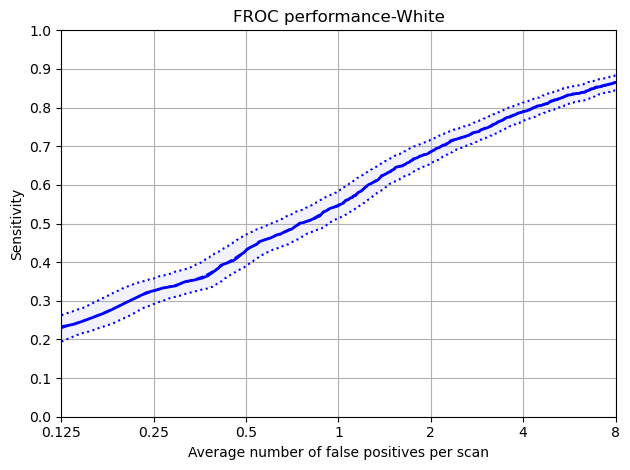

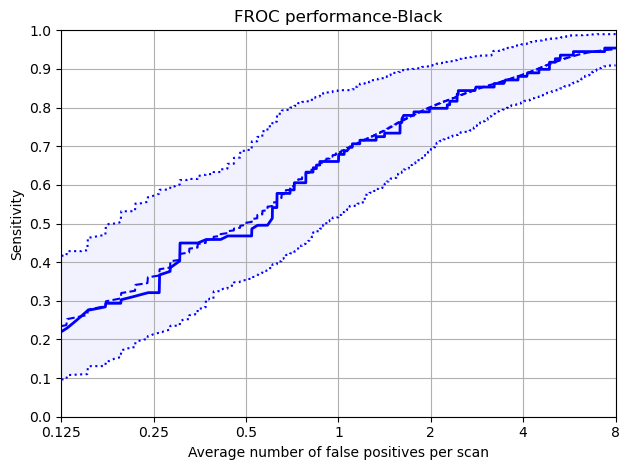

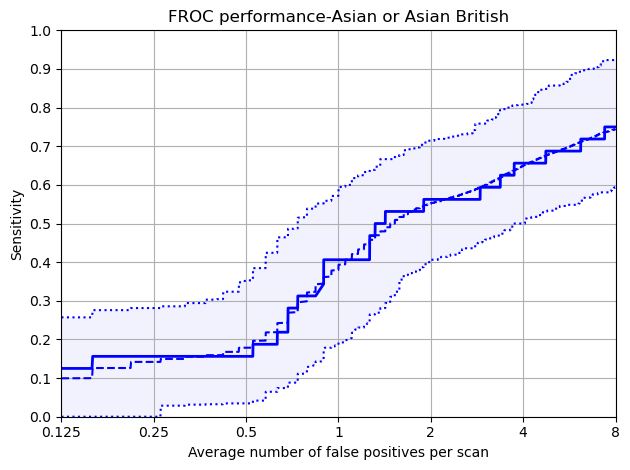

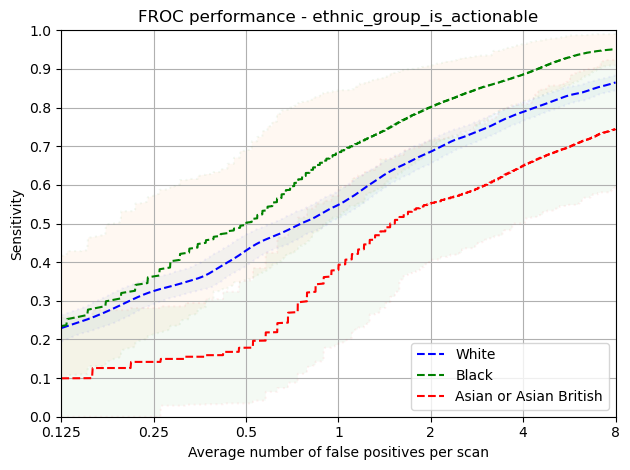

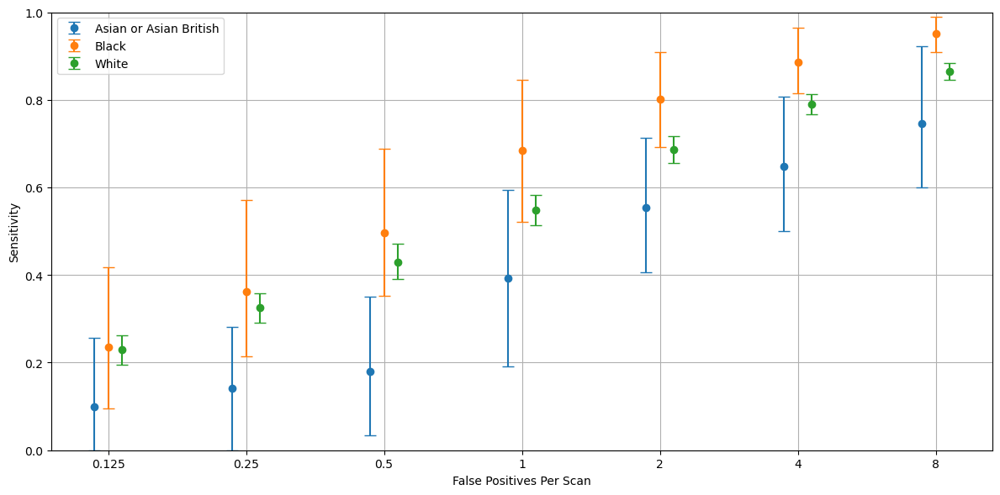

In [105]:
protected_group = 'ethnic_group_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('detection', flavour,'Actionable, Ethnic Group', data_dict, order=['Asian or Asian British','Black','White'])

### NonActionable - Ethnic Group

Protected Group: White


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,14.0,85.0,1.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpujkq36tx/annotations.csv
Total number of included nodule annotations: 848
Total number of nodule annotations: 848
Cases: 1298
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [01:07<00:00, 14.87it/s]


,0,159,476,1111,2381,4920,9999
0,0.245 (0.208 - 0.285),0.376 (0.337 - 0.413),0.523 (0.481 - 0.565),0.695 (0.661 - 0.729),0.817 (0.791 - 0.843),0.894 (0.87 - 0.915),0.948 (0.932 - 0.963)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.245,0.208,0.285
159,0.250,0.376,0.337,0.413
476,0.500,0.523,0.481,0.565
1111,1.000,0.695,0.661,0.729
2381,2.000,0.817,0.791,0.843
4920,4.000,0.894,0.870,0.915
9999,8.000,0.948,0.932,0.963


Mean Sensitivity: 0.64 Low Sensitivity: 0.61 High Sensitivity: 0.673


,True positives,827
0,False positives,24931.000
1,False negatives,21.000
2,True negatives,0.000
3,Total number of candidates,25919.000
4,Total number of nodules,848.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,165.000
7,Sensitivity,0.975
8,Average number of candidates per scan,19.968


Protected Group: Black


,SOLID,PERIFISSURAL
nodule_type,13.0,87.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp59b37lv2/annotations.csv
Total number of included nodule annotations: 60
Total number of nodule annotations: 60
Cases: 126


100%|██████████| 1000/1000 [00:02<00:00, 373.99it/s]


,0,159,476,1111,2381,4920,9999
0,0.378 (0.161 - 0.545),0.532 (0.399 - 0.66),0.637 (0.493 - 0.804),0.8 (0.694 - 0.905),0.899 (0.808 - 0.975),0.931 (0.857 - 0.986),0.983 (0.94 - 1.0)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.378,0.161,0.545
159,0.250,0.532,0.399,0.660
476,0.500,0.637,0.493,0.804
1111,1.000,0.800,0.694,0.905
2381,2.000,0.899,0.808,0.975
4920,4.000,0.931,0.857,0.986
9999,8.000,0.983,0.940,1.000


Mean Sensitivity: 0.74 Low Sensitivity: 0.62 High Sensitivity: 0.839


,True positives,59
0,False positives,1816.000
1,False negatives,1.000
2,True negatives,0.000
3,Total number of candidates,1883.000
4,Total number of nodules,60.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,8.000
7,Sensitivity,0.983
8,Average number of candidates per scan,14.944


Protected Group: Asian or Asian British


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,12.0,84.0,4.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpzeygixz7/annotations.csv
Total number of included nodule annotations: 25
Total number of nodule annotations: 25
Cases: 40


100%|██████████| 1000/1000 [00:01<00:00, 859.29it/s]


,0,159,476,1111,2381,4920,9999
0,0.215 (0.0 - 0.526),0.35 (0.109 - 0.667),0.534 (0.235 - 0.8),0.668 (0.5 - 0.85),0.774 (0.6 - 0.926),0.926 (0.806 - 1.0),1.0 (1.0 - 1.0)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.215,0.000,0.526
159,0.250,0.350,0.109,0.667
476,0.500,0.534,0.235,0.800
1111,1.000,0.668,0.500,0.850
2381,2.000,0.774,0.600,0.926
4920,4.000,0.926,0.806,1.000
9999,8.000,1.000,1.000,1.000


Mean Sensitivity: 0.64 Low Sensitivity: 0.46 High Sensitivity: 0.824


,True positives,25
0,False positives,586.000
1,False negatives,0.000
2,True negatives,0.000
3,Total number of candidates,621.000
4,Total number of nodules,25.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,10.000
7,Sensitivity,1.000
8,Average number of candidates per scan,15.525


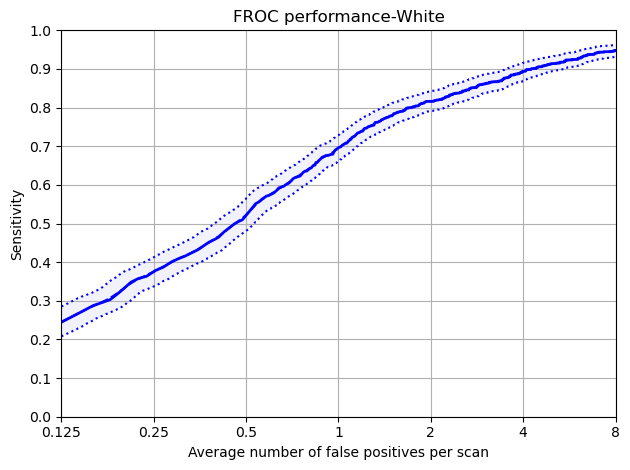

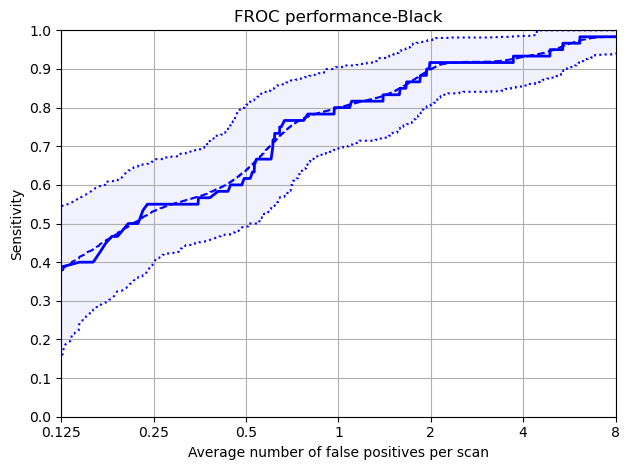

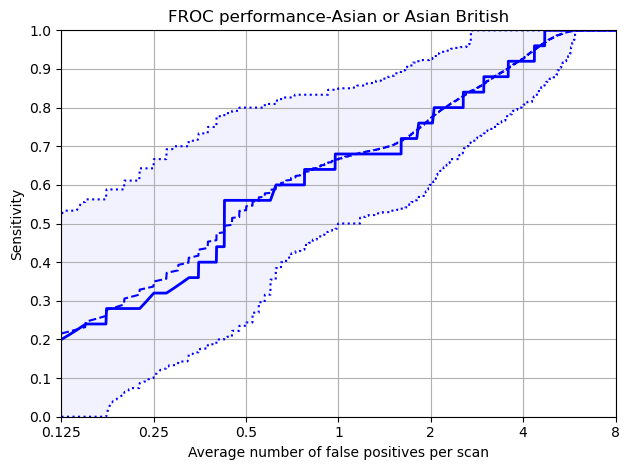

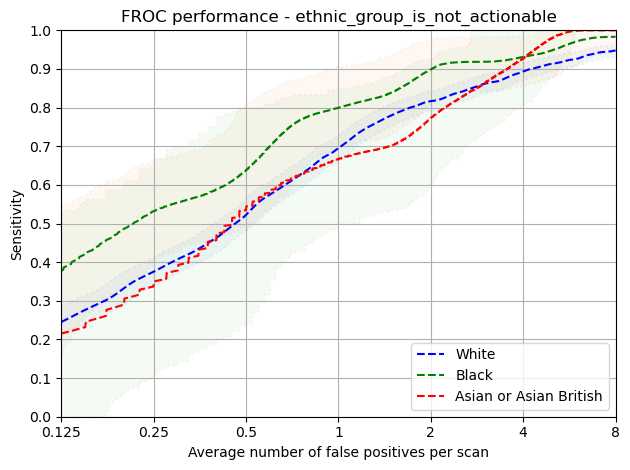

In [106]:
protected_group = 'ethnic_group_is_not_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable IMDRank

Protected Group: High_IMDRank_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,33.0,28.0,11.0,14.0,15.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpwq1pyawq/annotations.csv
Total number of included nodule annotations: 702
Total number of nodule annotations: 702
Cases: 266


100%|██████████| 1000/1000 [00:09<00:00, 109.29it/s]


,0,159,476,1111,2381,4920,9999
0,0.231 (0.169 - 0.288),0.312 (0.263 - 0.369),0.406 (0.347 - 0.467),0.508 (0.453 - 0.569),0.656 (0.599 - 0.714),0.758 (0.72 - 0.796),0.838 (0.804 - 0.874)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.231,0.169,0.288
159,0.250,0.312,0.263,0.369
476,0.500,0.406,0.347,0.467
1111,1.000,0.508,0.453,0.569
2381,2.000,0.656,0.599,0.714
4920,4.000,0.758,0.720,0.796
9999,8.000,0.838,0.804,0.874


Mean Sensitivity: 0.53 Low Sensitivity: 0.48 High Sensitivity: 0.582


,True positives,643
0,False positives,6810.000
1,False negatives,59.000
2,True negatives,0.000
3,Total number of candidates,7917.000
4,Total number of nodules,702.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,464.000
7,Sensitivity,0.916
8,Average number of candidates per scan,29.763


Protected Group: Low_IMDRank_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,37.0,28.0,9.0,9.0,17.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmps2nqao76/annotations.csv
Total number of included nodule annotations: 663
Total number of nodule annotations: 663
Cases: 259


100%|██████████| 1000/1000 [00:11<00:00, 90.35it/s]


,0,159,476,1111,2381,4920,9999
0,0.236 (0.187 - 0.301),0.332 (0.275 - 0.39),0.462 (0.395 - 0.532),0.592 (0.533 - 0.652),0.719 (0.669 - 0.77),0.817 (0.78 - 0.859),0.883 (0.848 - 0.915)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.236,0.187,0.301
159,0.250,0.332,0.275,0.390
476,0.500,0.462,0.395,0.532
1111,1.000,0.592,0.533,0.652
2381,2.000,0.719,0.669,0.770
4920,4.000,0.817,0.780,0.859
9999,8.000,0.883,0.848,0.915


Mean Sensitivity: 0.58 Low Sensitivity: 0.53 High Sensitivity: 0.631


,True positives,618
0,False positives,6758.000
1,False negatives,45.000
2,True negatives,0.000
3,Total number of candidates,7827.000
4,Total number of nodules,663.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,451.000
7,Sensitivity,0.932
8,Average number of candidates per scan,30.220


Protected Group: Medium_IMDRank_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,39.0,32.0,9.0,7.0,13.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmppitzo70m/annotations.csv
Total number of included nodule annotations: 633
Total number of nodule annotations: 633
Cases: 248
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-5854-bku_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6225-qvf_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6225-qvf_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:09<00:00, 101.05it/s]


,0,159,476,1111,2381,4920,9999
0,0.223 (0.172 - 0.276),0.316 (0.259 - 0.372),0.415 (0.342 - 0.486),0.549 (0.487 - 0.617),0.686 (0.636 - 0.732),0.796 (0.753 - 0.841),0.885 (0.854 - 0.916)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.223,0.172,0.276
159,0.250,0.316,0.259,0.372
476,0.500,0.415,0.342,0.486
1111,1.000,0.549,0.487,0.617
2381,2.000,0.686,0.636,0.732
4920,4.000,0.796,0.753,0.841
9999,8.000,0.885,0.854,0.916


Mean Sensitivity: 0.55 Low Sensitivity: 0.5 High Sensitivity: 0.606


,True positives,594
0,False positives,6396.000
1,False negatives,39.000
2,True negatives,0.000
3,Total number of candidates,7304.000
4,Total number of nodules,633.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,318.000
7,Sensitivity,0.938
8,Average number of candidates per scan,29.452


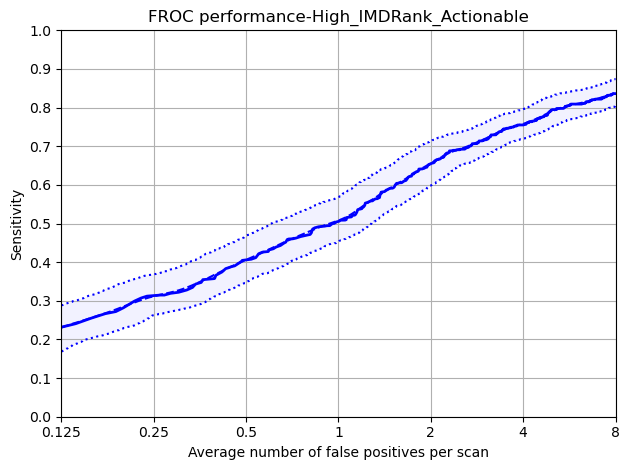

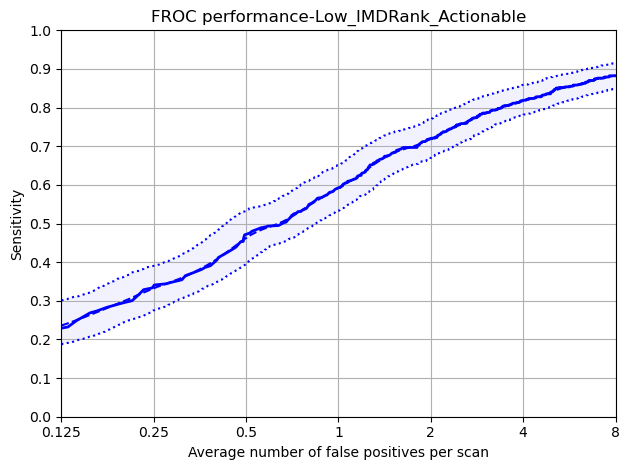

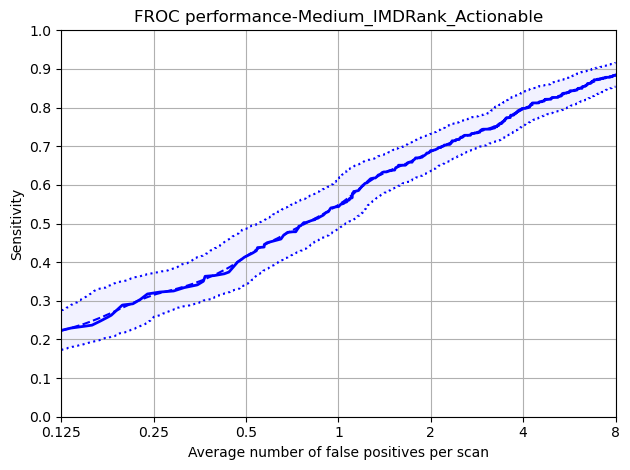

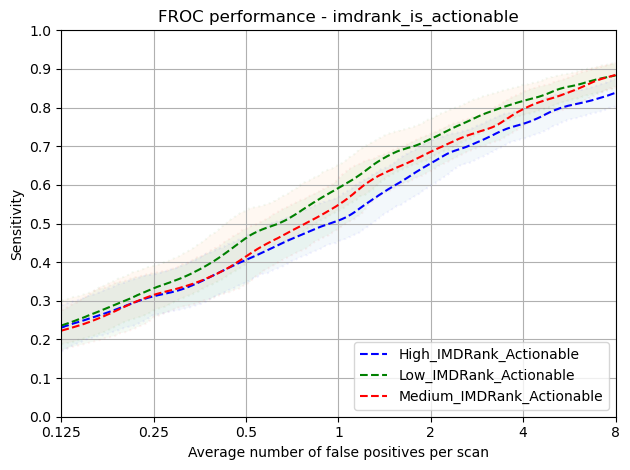

In [107]:
protected_group = 'imdrank_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable Smoking Status

Protected Group: Low_Pack_Years_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,36.0,31.0,9.0,9.0,16.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp772fug6o/annotations.csv
Total number of included nodule annotations: 751
Total number of nodule annotations: 751
Cases: 300
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-8739-emz_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:10<00:00, 93.61it/s]


,0,159,476,1111,2381,4920,9999
0,0.233 (0.185 - 0.283),0.302 (0.258 - 0.348),0.414 (0.356 - 0.467),0.528 (0.477 - 0.582),0.688 (0.647 - 0.728),0.783 (0.751 - 0.817),0.856 (0.826 - 0.886)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.233,0.185,0.283
159,0.250,0.302,0.258,0.348
476,0.500,0.414,0.356,0.467
1111,1.000,0.528,0.477,0.582
2381,2.000,0.688,0.647,0.728
4920,4.000,0.783,0.751,0.817
9999,8.000,0.856,0.826,0.886


Mean Sensitivity: 0.54 Low Sensitivity: 0.5 High Sensitivity: 0.587


,True positives,686
0,False positives,7537.000
1,False negatives,65.000
2,True negatives,0.000
3,Total number of candidates,8649.000
4,Total number of nodules,751.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,427.000
7,Sensitivity,0.913
8,Average number of candidates per scan,28.830


Protected Group: High_Pack_Years_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,35.0,25.0,9.0,11.0,19.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpqj_ahs8i/annotations.csv
Total number of included nodule annotations: 540
Total number of nodule annotations: 540
Cases: 222
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-5854-bku_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:09<00:00, 106.25it/s]


,0,159,476,1111,2381,4920,9999
0,0.222 (0.161 - 0.292),0.341 (0.269 - 0.408),0.464 (0.394 - 0.531),0.577 (0.512 - 0.635),0.692 (0.634 - 0.742),0.8 (0.758 - 0.84),0.869 (0.827 - 0.905)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.222,0.161,0.292
159,0.250,0.341,0.269,0.408
476,0.500,0.464,0.394,0.531
1111,1.000,0.577,0.512,0.635
2381,2.000,0.692,0.634,0.742
4920,4.000,0.800,0.758,0.840
9999,8.000,0.869,0.827,0.905


Mean Sensitivity: 0.57 Low Sensitivity: 0.51 High Sensitivity: 0.622


,True positives,508
0,False positives,6123.000
1,False negatives,32.000
2,True negatives,0.000
3,Total number of candidates,6965.000
4,Total number of nodules,540.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,335.000
7,Sensitivity,0.941
8,Average number of candidates per scan,31.374


Protected Group: Medium_Pack_Years_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,37.0,31.0,11.0,11.0,10.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpu2wp9s2i/annotations.csv
Total number of included nodule annotations: 713
Total number of nodule annotations: 713
Cases: 254
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6225-qvf_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6225-qvf_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:12<00:00, 82.33it/s]


,0,159,476,1111,2381,4920,9999
0,0.23 (0.179 - 0.295),0.317 (0.263 - 0.377),0.411 (0.337 - 0.494),0.561 (0.491 - 0.638),0.693 (0.634 - 0.749),0.796 (0.753 - 0.838),0.884 (0.855 - 0.913)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.230,0.179,0.295
159,0.250,0.317,0.263,0.377
476,0.500,0.411,0.337,0.494
1111,1.000,0.561,0.491,0.638
2381,2.000,0.693,0.634,0.749
4920,4.000,0.796,0.753,0.838
9999,8.000,0.884,0.855,0.913


Mean Sensitivity: 0.56 Low Sensitivity: 0.5 High Sensitivity: 0.615


,True positives,667
0,False positives,6371.000
1,False negatives,46.000
2,True negatives,0.000
3,Total number of candidates,7511.000
4,Total number of nodules,713.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,475.000
7,Sensitivity,0.935
8,Average number of candidates per scan,29.571


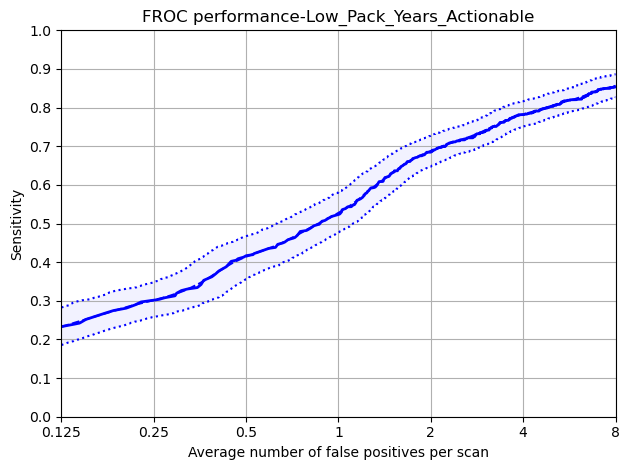

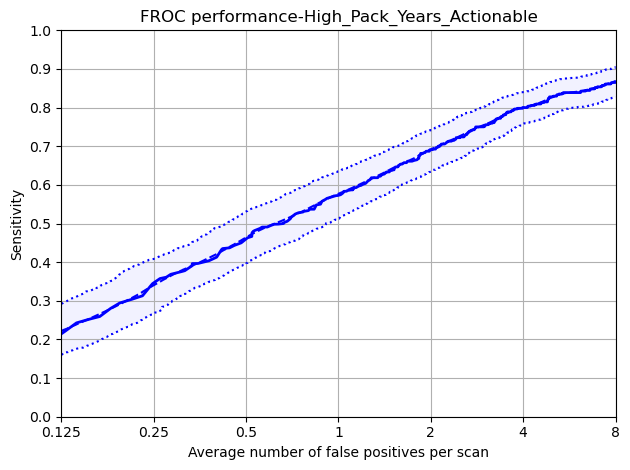

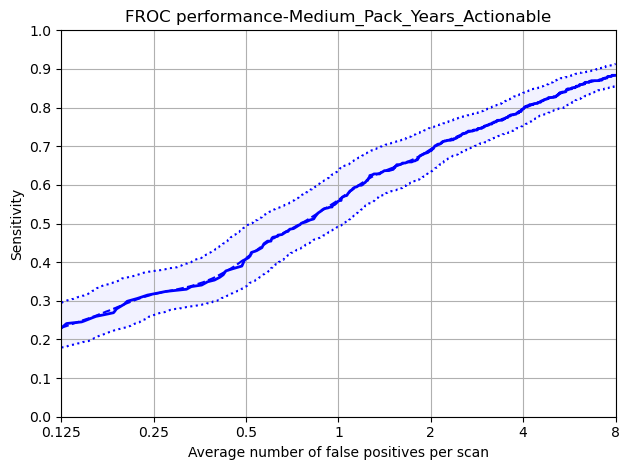

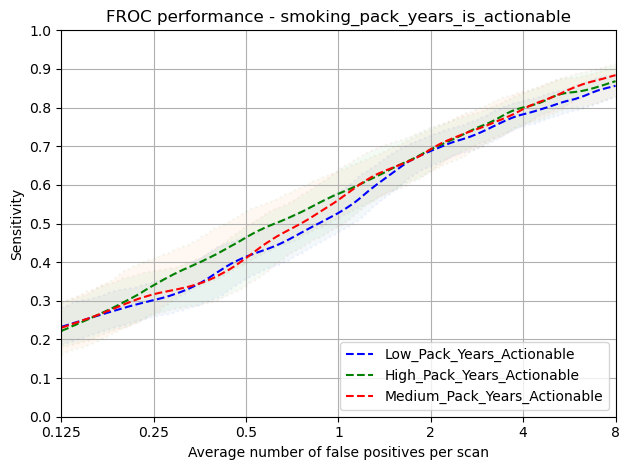

In [108]:
protected_group = 'smoking_pack_years_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)


### False Positive and Miss Analysis


In [109]:
thresholds = utils.get_thresholds(detection_summit_summit)
print(thresholds)
missed_metadata = utils.miss_anaysis_at_fpps(
    model='detection',
    scans_metadata=scan_metadata,
    scans_path=f'{workspace_path}/metadata/summit/{flavour}/test_scans.csv',
    annotations_path=f'{workspace_path}/models/detection/result/trained_summit/summit/{flavour}/annotations.csv',
    exclusions_path=f'{workspace_path}/data/summit/metadata/annotations_excluded_empty.csv',
    predictions_path=detection_predictions_path,
    thresholds=thresholds
)

[0.9951171875, 0.99072265625, 0.98291015625, 0.96142578125, 0.8974609375, 0.66015625, 0.2091064453125]
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/detection/result/trained_summit/summit/female_for_inference/annotations.csv
Total number of included nodule annotations: 2989
Total number of nodule annotations: 2989
Cases: 2337
Missed Annotations at 0.9951171875 FPPs: 2384
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/detection/result/trained_summit/summit/female_for_inference/annotations.csv
Total number of included nodule annotations: 2989
Total number of nodule annotations: 2989
Cases: 2337
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-5854-bku_Y0_BASELINE_A, nodule Annot ID: None
Missed Annotations at 0.99072265625 FPPs: 2026
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/detection/result/trained_summit/summit/female_for_inference/annotations.csv
Total number of included nodule annot

In [110]:
hit_and_miss_dict = utils.get_protected_group_by_nodule_type(missed_metadata)

#### Incremental FROC Scores - Gender/ Ethnic Group / Nodule Type

In [111]:

# display(hit_and_miss_dict[0])
recode_dict = {}
for idx in range(7):
    hmm = {}
    for slice in ['all','actionable']:
        for protected_group in ['MALE','FEMALE','All', 'Asian or Asian British', 'Black', 'White']:
            for type in ['SOLID','NON_SOLID','PART_SOLID','PERIFISSURAL','CALCIFIED']:
            
                try:

                    group = 'gender' if protected_group in ['MALE','FEMALE','All'] else 'ethnic_group'

                    total = hit_and_miss_dict[idx][slice][group][(True,type)][protected_group] + hit_and_miss_dict[idx][slice][group][(False,type)][protected_group]
                    hits = hit_and_miss_dict[idx][slice][group][(False,type)][protected_group]
                    perc_hits = round(100 * (hits/total),0)

                    hmm[f'{slice}_{protected_group}_{type}_Hits%'] = perc_hits
                except:
                    print(f'Error: {idx}, {slice}, {protected_group}, {type}')
                    hmm[f'{slice}_{protected_group}_{type}_Hits%'] = 100
                    

    recode_dict[idx] = hmm

pd.DataFrame.from_dict(recode_dict, orient='index').head(7)

df = pd.DataFrame.from_dict(recode_dict, orient='index').head(7)

# Remove ".0" from each value in the dataframe
df = df.applymap(lambda x: str(x).replace('.0', ''))

# Collapse each column into comma-delimited values
collapsed_df = df.apply(lambda x: ', '.join(x), axis=0)

display(collapsed_df)

from scipy.stats import shapiro, ttest_ind, mannwhitneyu

def calculate_significant_differences(df, group1_name, group2_name):

    group1 = df[group1_name].astype(int).values
    group2 = df[group2_name].astype(int).values

    shapiro_group1 = shapiro(group1)
    shapiro_group2 = shapiro(group2)

    print('*'*50)
    if shapiro_group1[1] > 0.05 and shapiro_group2[1] > 0.05:
        t_test = ttest_ind(group1, group2)
        print(f'Independent T-Test: {round(t_test.statistic,3)}, {round(t_test.pvalue,3)}')
    else:
        manwhitney = mannwhitneyu(group1, group2)
        print(f'Mann-Whitney U Test: {round(manwhitney.statistic,3)}, {round(manwhitney.pvalue,3)}')

a='White'
b='Black'

for type in ['SOLID','NON_SOLID','PART_SOLID','PERIFISSURAL','CALCIFIED']:

    print(f'*** all {type} ***')
    group1 = f'all_{a}_{type}_Hits%'
    group2 = f'all_{b}_{type}_Hits%'
    calculate_significant_differences(df, group1, group2)

for type in ['SOLID','NON_SOLID','PART_SOLID','PERIFISSURAL','CALCIFIED']:

    print(f'*** actionable {type} ***')
    group1 = f'actionable_{a}_{type}_Hits%'
    group2 = f'actionable_{b}_{type}_Hits%'
    calculate_significant_differences(df, group1, group2)

Error: 0, all, MALE, SOLID
Error: 0, all, MALE, NON_SOLID
Error: 0, all, MALE, PART_SOLID
Error: 0, all, MALE, PERIFISSURAL
Error: 0, all, MALE, CALCIFIED
Error: 0, actionable, MALE, SOLID
Error: 0, actionable, MALE, NON_SOLID
Error: 0, actionable, MALE, PART_SOLID
Error: 0, actionable, MALE, PERIFISSURAL
Error: 0, actionable, MALE, CALCIFIED
Error: 1, all, MALE, SOLID
Error: 1, all, MALE, NON_SOLID
Error: 1, all, MALE, PART_SOLID
Error: 1, all, MALE, PERIFISSURAL
Error: 1, all, MALE, CALCIFIED
Error: 1, actionable, MALE, SOLID
Error: 1, actionable, MALE, NON_SOLID
Error: 1, actionable, MALE, PART_SOLID
Error: 1, actionable, MALE, PERIFISSURAL
Error: 1, actionable, MALE, CALCIFIED
Error: 2, all, MALE, SOLID
Error: 2, all, MALE, NON_SOLID
Error: 2, all, MALE, PART_SOLID
Error: 2, all, MALE, PERIFISSURAL
Error: 2, all, MALE, CALCIFIED
Error: 2, actionable, MALE, SOLID
Error: 2, actionable, MALE, NON_SOLID
Error: 2, actionable, MALE, PART_SOLID
Error: 2, actionable, MALE, PERIFISSURAL
Err

all_MALE_SOLID_Hits%                                    100, 100, 100, 100, 100, 100, 100
all_MALE_NON_SOLID_Hits%                                100, 100, 100, 100, 100, 100, 100
all_MALE_PART_SOLID_Hits%                               100, 100, 100, 100, 100, 100, 100
all_MALE_PERIFISSURAL_Hits%                             100, 100, 100, 100, 100, 100, 100
all_MALE_CALCIFIED_Hits%                                100, 100, 100, 100, 100, 100, 100
all_FEMALE_SOLID_Hits%                                         33, 48, 60, 74, 85, 93, 97
all_FEMALE_NON_SOLID_Hits%                                       2, 6, 14, 28, 50, 67, 80
all_FEMALE_PART_SOLID_Hits%                                    16, 28, 44, 61, 77, 87, 93
all_FEMALE_PERIFISSURAL_Hits%                                  19, 32, 46, 64, 78, 87, 94
all_FEMALE_CALCIFIED_Hits%                                       5, 9, 16, 29, 44, 55, 64
all_All_SOLID_Hits%                                            33, 48, 60, 74, 85, 93, 97
all_All_NO

*** all SOLID ***
**************************************************
Independent T-Test: -0.247, 0.809
*** all NON_SOLID ***
**************************************************
Mann-Whitney U Test: 27.0, 0.797
*** all PART_SOLID ***
**************************************************
Independent T-Test: 0.188, 0.854
*** all PERIFISSURAL ***
**************************************************
Independent T-Test: 0.028, 0.979
*** all CALCIFIED ***
**************************************************
Mann-Whitney U Test: 30.0, 0.521
*** actionable SOLID ***
**************************************************
Independent T-Test: -0.269, 0.793
*** actionable NON_SOLID ***
**************************************************
Mann-Whitney U Test: 27.0, 0.797
*** actionable PART_SOLID ***
**************************************************
Independent T-Test: 0.197, 0.847
*** actionable PERIFISSURAL ***
**************************************************
Independent T-Test: 0.334, 0.744
*** actionable C

#### Nodule Characteristic Analysis

,RIGHT,LEFT,NOT_ANSWERED
0.125,0.23,0.19,0.15
0.25,0.35,0.30,0.29
0.5,0.47,0.43,0.40
1,0.61,0.61,0.57
2,0.75,0.75,0.70
4,0.84,0.85,0.82
8,0.91,0.92,0.89
Total Annotations,1539.00,934.00,516.00


,UPPER,NOT-UPPER,NOT_ANSWERED
0.125,0.18,0.24,0.15
0.25,0.29,0.36,0.29
0.5,0.41,0.49,0.40
1,0.58,0.64,0.57
2,0.74,0.76,0.70
4,0.84,0.85,0.82
8,0.91,0.92,0.89
Total Annotations,1151.00,1322.00,516.00


,SOLID,NON_SOLID,PART_SOLID,PERIFISSURAL,CALCIFIED
0.125,0.33,0.02,0.16,0.19,0.05
0.25,0.48,0.06,0.28,0.32,0.09
0.5,0.60,0.14,0.44,0.46,0.16
1,0.74,0.28,0.61,0.64,0.29
2,0.85,0.50,0.77,0.78,0.44
4,0.93,0.67,0.87,0.87,0.55
8,0.97,0.80,0.93,0.94,0.64
Total Annotations,865.00,217.00,196.00,1416.00,295.00


,RANDOMISATION_AT_YEAR_1,ALWAYS_SCAN_AT_YEAR_1,3_MONTH_FOLLOW_UP_SCAN,URGENT_REFERRAL
0.125,0.20,0.02,0.22,0.42
0.25,0.33,0.07,0.33,0.58
0.5,0.47,0.15,0.44,0.65
1,0.64,0.30,0.59,0.73
2,0.78,0.52,0.71,0.85
4,0.87,0.70,0.80,0.88
8,0.94,0.83,0.86,0.93
Total Annotations,1775.00,203.00,914.00,97.00


diameter_cats,00-04,04-08,08-15,15-20,20-30,30-40,40-999
0.125,0.03,0.23,0.23,0.12,0.21,0.12,0.00
0.25,0.08,0.36,0.36,0.24,0.24,0.41,0.25
0.5,0.16,0.50,0.46,0.37,0.35,0.47,0.75
1,0.31,0.67,0.63,0.47,0.51,0.53,0.75
2,0.47,0.79,0.77,0.69,0.70,0.71,0.75
4,0.63,0.88,0.87,0.77,0.83,0.82,0.75
8,0.77,0.94,0.94,0.89,0.88,0.82,0.75
Total Annotations,296.00,1701.00,712.00,138.00,105.00,17.00,4.00


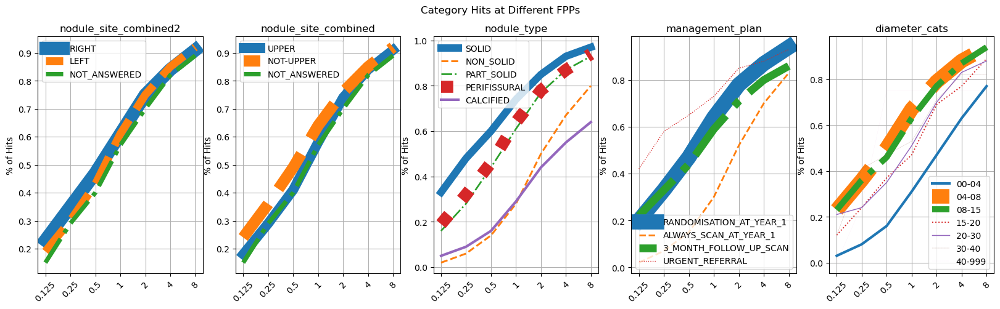

In [112]:

fig, ax = plt.subplots(1, 5, figsize=(20, 5))

nodule_characteristics = {
    'nodule_site_combined2': ['RIGHT', 'LEFT', 'NOT_ANSWERED'],
    'nodule_site_combined': ['UPPER','NOT-UPPER', 'NOT_ANSWERED'],
    'nodule_type': ['SOLID', 'NON_SOLID', 'PART_SOLID', 'PERIFISSURAL', 'CALCIFIED'],
    'management_plan': ['RANDOMISATION_AT_YEAR_1','ALWAYS_SCAN_AT_YEAR_1', '3_MONTH_FOLLOW_UP_SCAN', 'URGENT_REFERRAL'],
    'diameter_cats': diameter_lbs,
}

for ivx, (var, order) in enumerate(nodule_characteristics.items()):
    annotations = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv')
    # annotations = annotations[annotations['management_plan'] != 'RANDOMISATION_AT_YEAR_1']

    total_vc = annotations[var].value_counts().sort_index().rename('Total Annotations')

    operating_points = ['0.125', '0.25', '0.5', '1', '2', '4', '8']

    results = []

    for idx, metadata in enumerate(missed_metadata):
        results.append(
            pd.crosstab(
                metadata[var], 
                metadata['miss'],
                normalize='index'
            )[False]
            .rename(f'{operating_points[idx]}')
            .reindex(order)
            
        )

    df = pd.concat(results, axis=1).fillna(0).round(2).merge(total_vc.to_frame(), left_index=True, right_index=True)

    display(df.T)


    line_styles = ['-', '--', '-.', ':', '-', '--', '-.']
    weights = df.pop('Total Annotations')

    for isx, column in enumerate(df.T):    
            ax[ivx].plot(df.T[column], label=column, linestyle=line_styles[isx], linewidth=weights[isx]/100)
    
    ax[ivx].set_xticklabels(labels=df.columns, rotation=45)
    ax[ivx].set_title(var)
    ax[ivx].legend()
    ax[ivx].set_ylabel('% of Hits')
    ax[ivx].grid(visible=True, which='both')

plt.suptitle('Category Hits at Different FPPs')
plt.show()

,FEMALE,Total
"(CALCIFIED, 3_MONTH_FOLLOW_UP_SCAN)",295 (9.9%),295 (9.9%)
"(NON_SOLID, ALWAYS_SCAN_AT_YEAR_1)",203 (6.8%),203 (6.8%)
"(NON_SOLID, RANDOMISATION_AT_YEAR_1)",14 (0.5%),14 (0.5%)
"(PART_SOLID, 3_MONTH_FOLLOW_UP_SCAN)",196 (6.6%),196 (6.6%)
"(PERIFISSURAL, RANDOMISATION_AT_YEAR_1)",1416 (47.4%),1416 (47.4%)
"(SOLID, 3_MONTH_FOLLOW_UP_SCAN)",423 (14.2%),423 (14.2%)
"(SOLID, RANDOMISATION_AT_YEAR_1)",345 (11.5%),345 (11.5%)
"(SOLID, URGENT_REFERRAL)",97 (3.2%),97 (3.2%)
Total,2989,2989


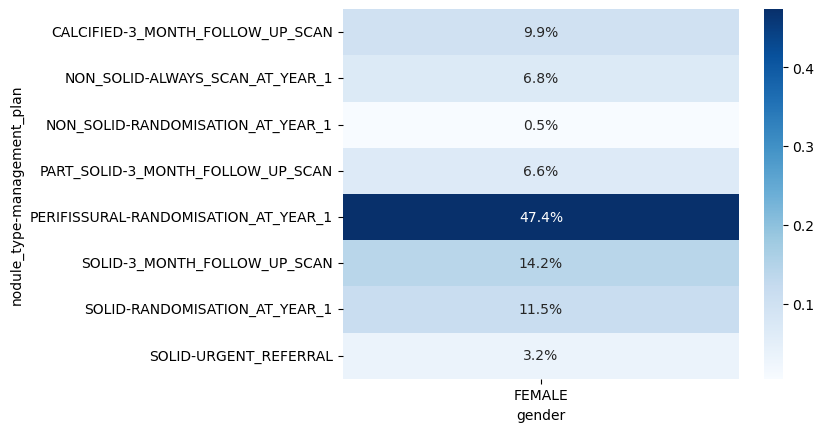

In [113]:
# Check what nodules have been missed by gender


missed_metadata_at_2fpps = missed_metadata[4]

def crosstab_with_percentages(rows, columns, x_order=None, y_order=None, table=False, heatmap=False):
    # Create the crosstab with absolutes
    cols = [c.astype(str) for c in columns]
    rows = [r.astype(str) for r in rows]

    xabs = pd.crosstab(rows, cols).fillna(0)
    xperc = pd.crosstab(rows, cols, normalize='columns').fillna(0)

    if x_order:
        xabs = xabs.reindex(x_order, axis=1)
        xperc = xperc.reindex(x_order, axis=1)

    if y_order:
        xabs = xabs.reindex(y_order)
        xperc = xperc.reindex(y_order)

    combined_data = {}

    for (adx, rabs), (pdx, rperc) in zip(xabs.iterrows(), xperc.iterrows()):

        row_data = {}
        row_total = 0

        for col in xabs.columns:
            row_data[col] = f"{rabs[col]} ({rperc[col]:.1%})"
            row_total += rabs[col]

        row_data['Total'] = f'{row_total} ({row_total / xabs.sum().sum():.1%})'
        combined_data[adx] = row_data

    row_data = {}
    row_total = 0
    for col in xabs.columns:
        row_data[col] = f'{sum(xabs[col])}'
        row_total += xabs[col].sum()

    row_data['Total'] = row_total
    combined_data['Total'] = row_data

    if table:
        display(pd.DataFrame.from_dict(combined_data).T)
        
    
    if heatmap:
        sns.heatmap(xperc, annot=True, fmt=".1%", cmap='Blues')
        plt.show()

    return xperc, pd.DataFrame.from_dict(combined_data)

_ = crosstab_with_percentages(
    [missed_metadata_at_2fpps['nodule_type'], missed_metadata_at_2fpps['management_plan']],
    [missed_metadata_at_2fpps['gender']],
    table=True,
    heatmap=True)

In [114]:
scans = pd.read_csv(f'{workspace_path}/metadata/summit/{flavour}/test_scans.csv')
predictions = pd.read_csv(detection_predictions_path)
annotations = pd.read_csv(f'{workspace_path}/models/detection/result/trained_summit/summit/{flavour}/annotations.csv')

false_positives_fpps = false_positive_analysis(
    thresholds=thresholds,    
    predictions=predictions,
    annotations=annotations
)

predictions: 870 at threshold: 0.9951171875
distance false positives: 263 at threshold: 0.9951171875
predictions: 1523 at threshold: 0.99072265625
distance false positives: 561 at threshold: 0.99072265625
predictions: 2457 at threshold: 0.98291015625
distance false positives: 1131 at threshold: 0.98291015625
predictions: 4117 at threshold: 0.96142578125
distance false positives: 2311 at threshold: 0.96142578125
predictions: 6874 at threshold: 0.8974609375
distance false positives: 4637 at threshold: 0.8974609375
predictions: 11942 at threshold: 0.66015625
distance false positives: 9334 at threshold: 0.66015625
predictions: 21780 at threshold: 0.2091064453125
distance false positives: 18688 at threshold: 0.2091064453125


#### Examples of False Positives

None
summit-2862-wqj_Y0_BASELINE_A - 358 223 107 4.21875
False Positive: True
IoU False Positive: nan


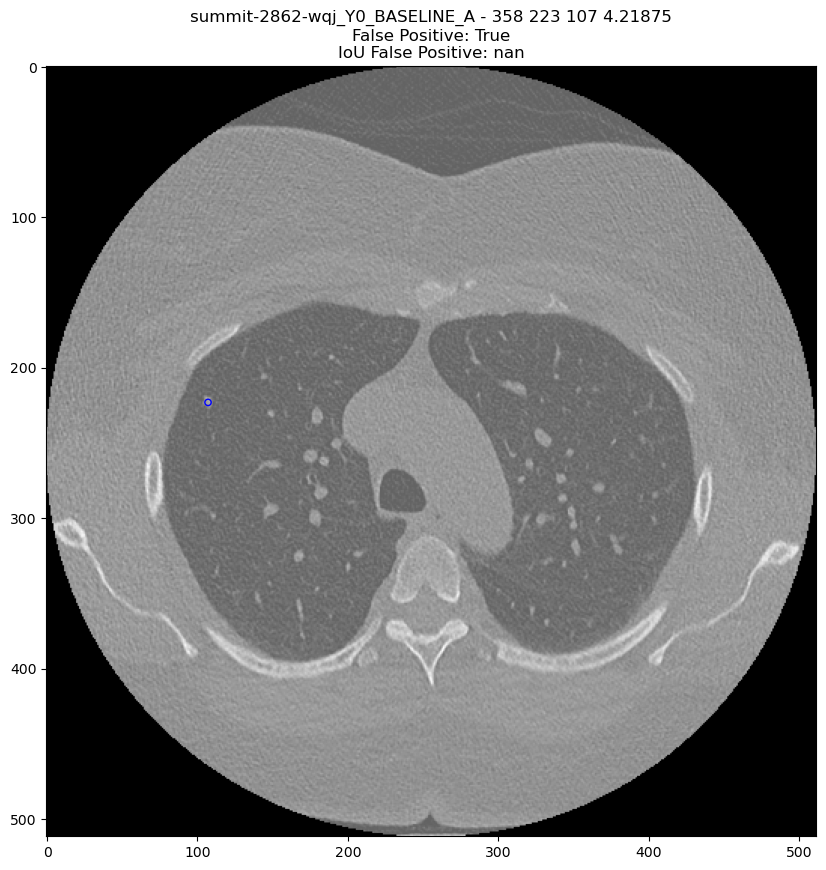

None
summit-2693-gcs_Y0_BASELINE_A - 278 276 111 7.3828125
False Positive: True
IoU False Positive: nan


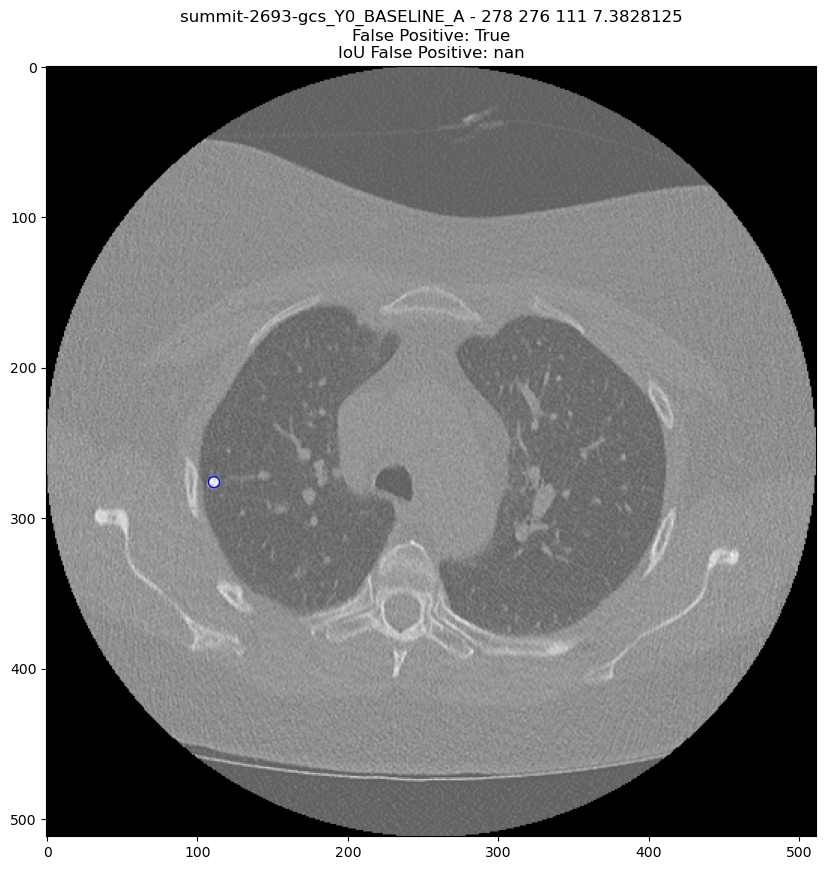

None
summit-7387-eaq_Y0_BASELINE_A - 296 140 272 7.55859375
False Positive: True
IoU False Positive: nan


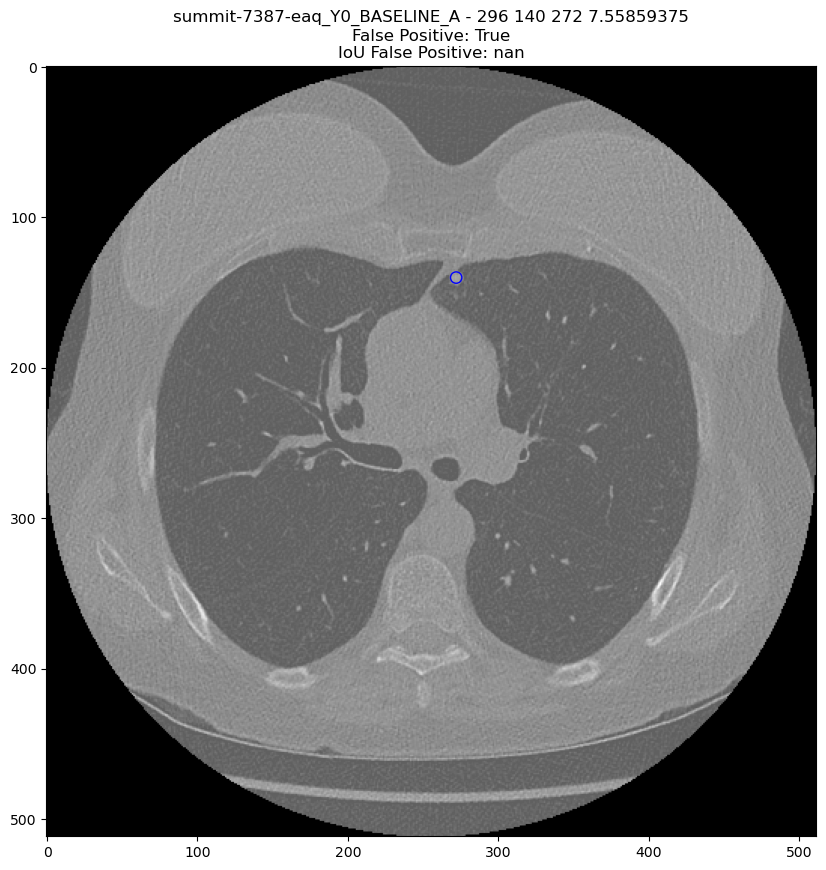

summit-7653-wpy_Y0_BASELINE_A already exists
summit-7653-wpy_Y0_BASELINE_A - 356 300 86 6.15234375
False Positive: True
IoU False Positive: 0.0


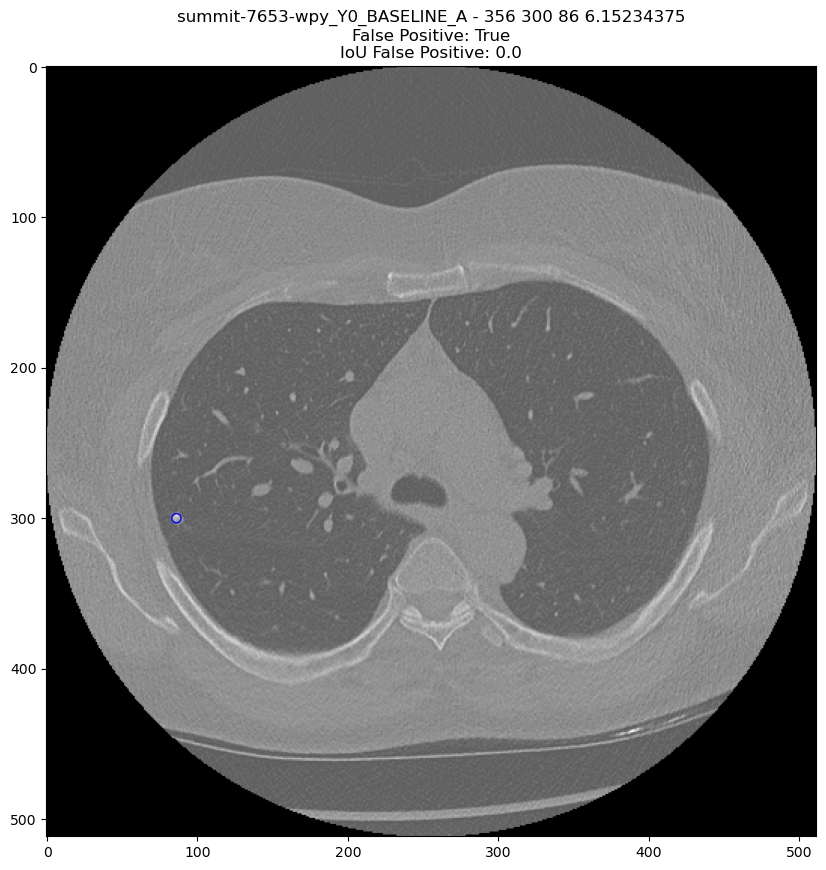

summit-5968-bsv_Y0_BASELINE_A already exists
summit-5968-bsv_Y0_BASELINE_A - 288 214 160 5.9765625
False Positive: True
IoU False Positive: 0.0


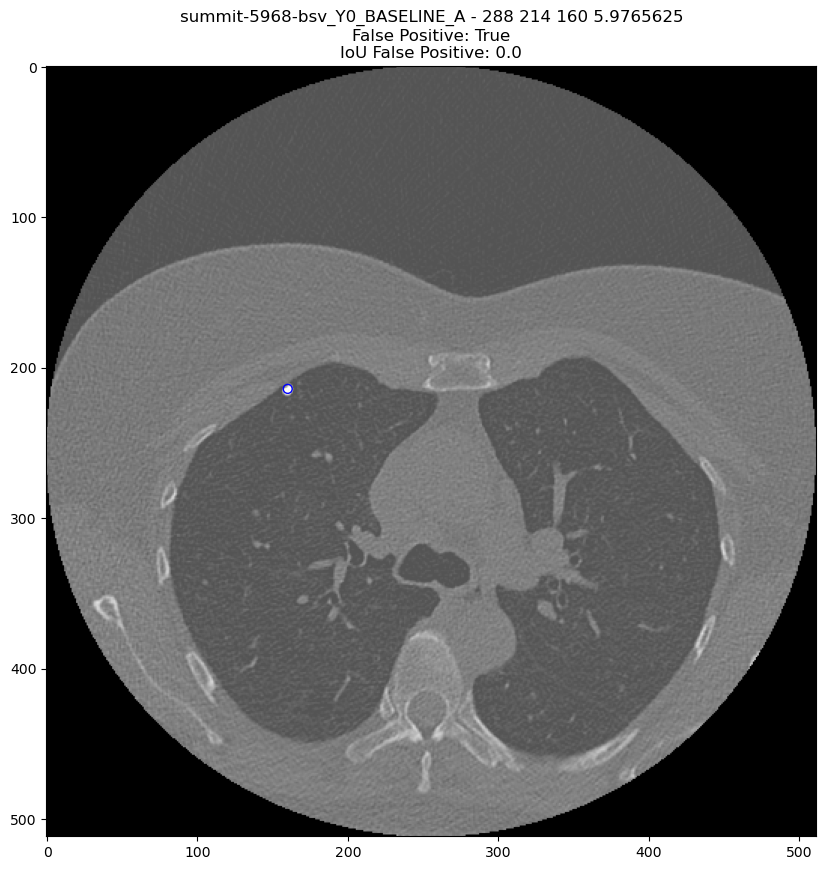

None
summit-3423-prv_Y0_BASELINE_A - 289 255 113 5.44921875
False Positive: True
IoU False Positive: nan


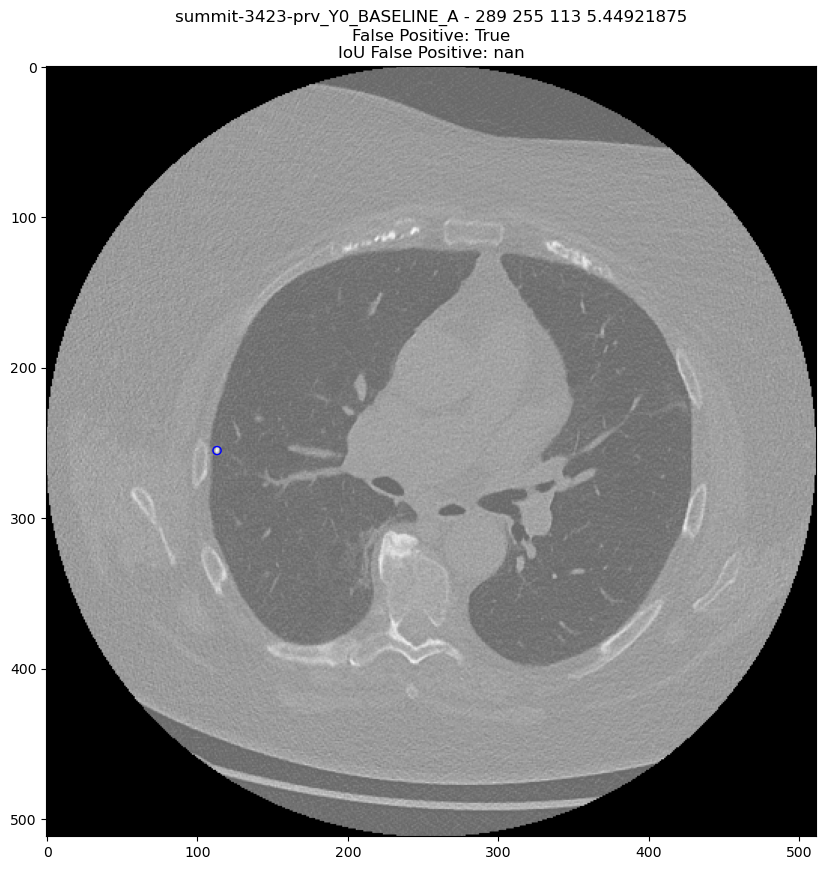

None
summit-4863-fcp_Y0_BASELINE_A - 266 266 440 6.4599609375
False Positive: True
IoU False Positive: 0.0


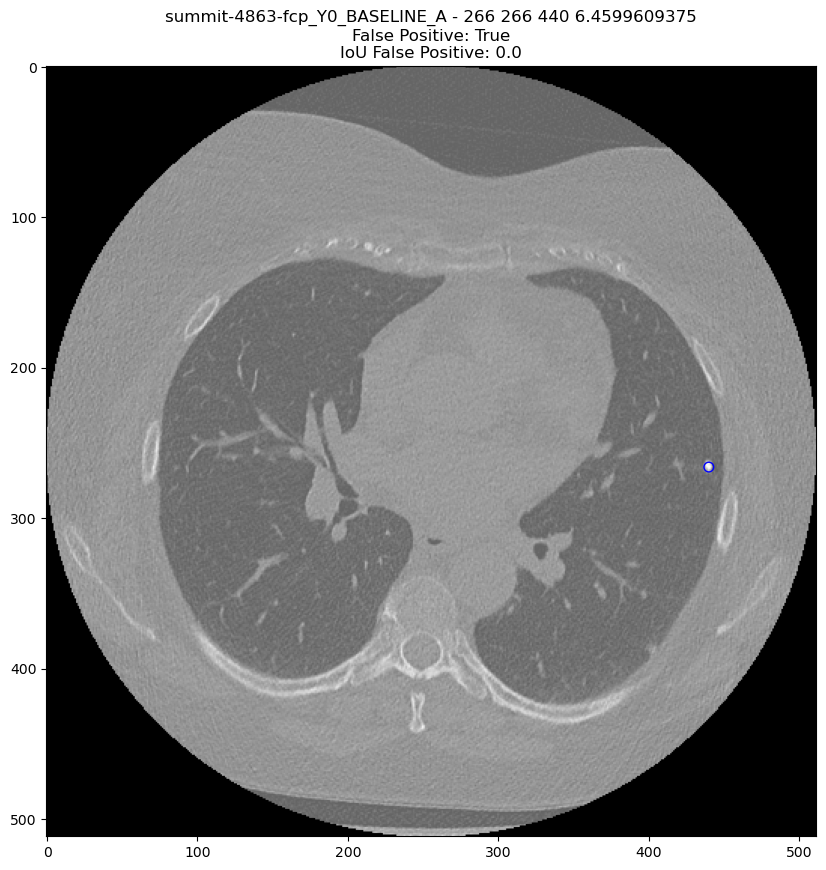

summit-4247-hkj_Y0_BASELINE_A already exists
summit-4247-hkj_Y0_BASELINE_A - 235 363 192 5.80078125
False Positive: True
IoU False Positive: nan


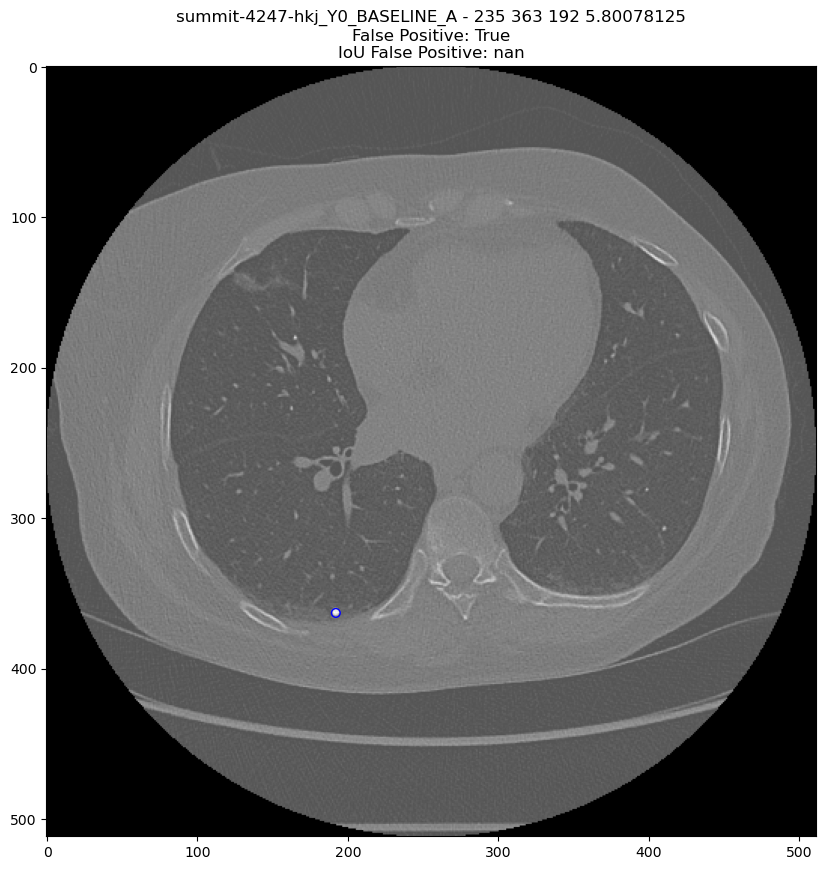

None
summit-3576-spc_Y0_BASELINE_A - 386 224 426 5.80078125
False Positive: True
IoU False Positive: nan


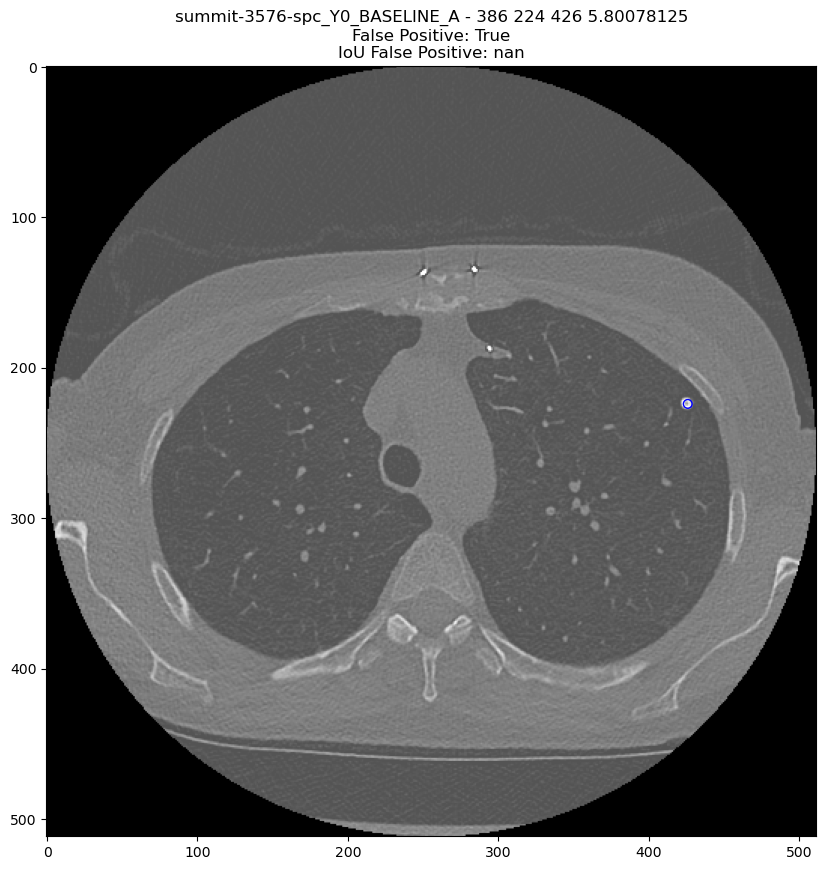

None
summit-6643-wbt_Y0_BASELINE_A - 135 367 162 6.240234375
False Positive: True
IoU False Positive: 0.0


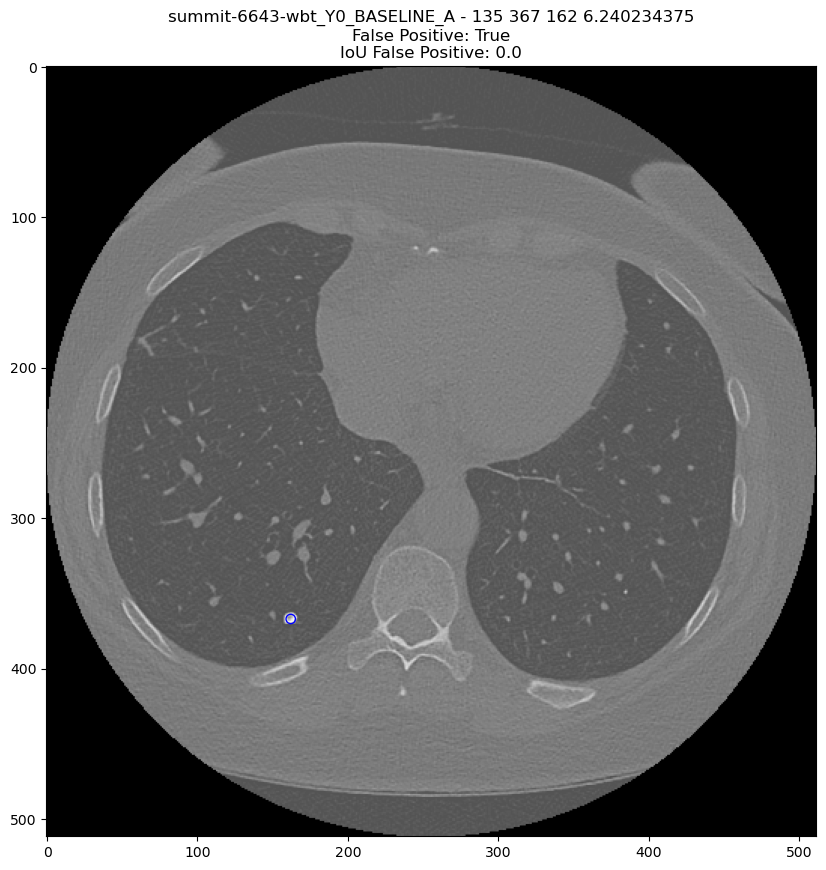

None
summit-4966-rup_Y0_BASELINE_A - 185 408 317 4.53125
False Positive: True
IoU False Positive: nan


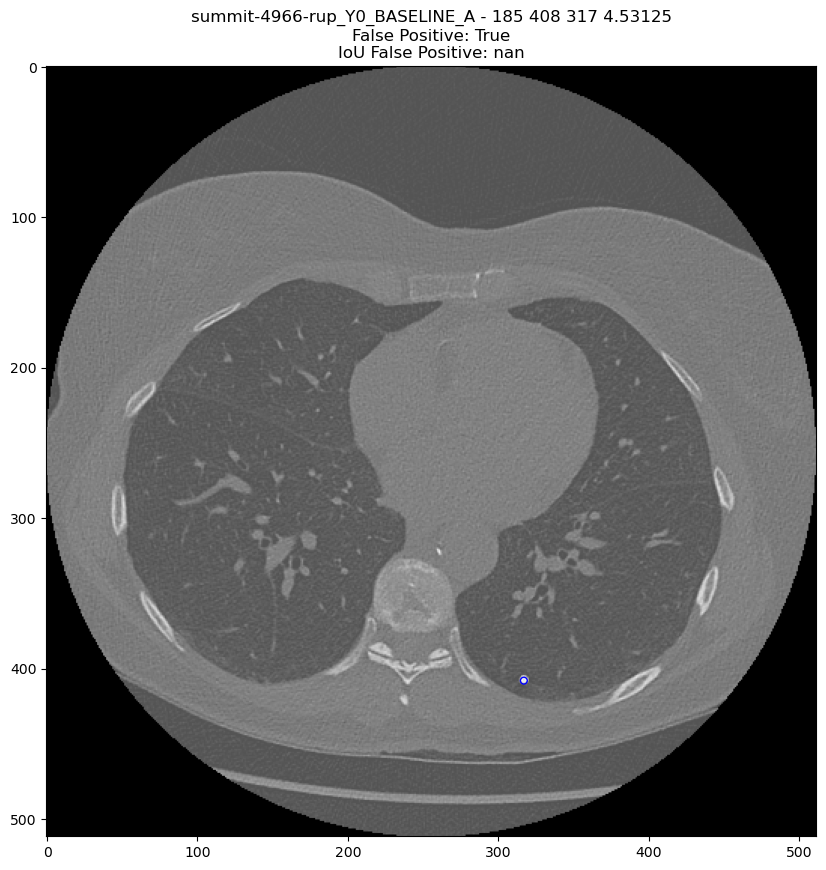

None
summit-5563-nec_Y0_BASELINE_A - 134 335 188 9.755859375
False Positive: True
IoU False Positive: nan


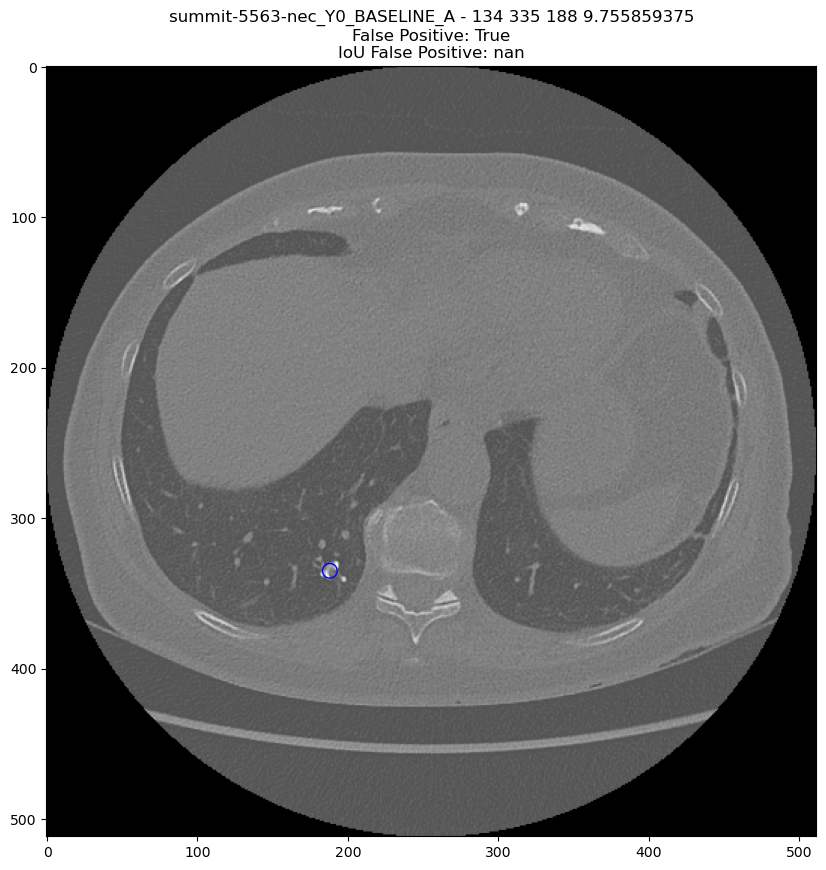

In [115]:
df = false_positives_fpps['0.125']

cnt = 0
for idx, row in df[df.distance_false_positive].sort_values(by='threshold', ascending=False).iterrows():
    scan_id = row['name']
    study_id = scan_id.split('_')[0]
    x = row['row']
    y = row['col']
    z = row['index']
    diameter = row['diameter']
    

    copy_scan_from_cluster(scan_id)
    
    scan = SummitScan.load_scan(f'{workspace_path}/data/summit/scans/{study_id}/{scan_id}.mhd')
    irc = xyz2irc([x, y, z], scan.origin, scan.voxel_size, scan.orientation)


    show_mhd_candidate_location(scan_id, scan.image, irc.row, irc.col, irc.index, diameter, row.distance_false_positive, row.iou_false_positive)
    cnt+=1
    if cnt == 12:
        break

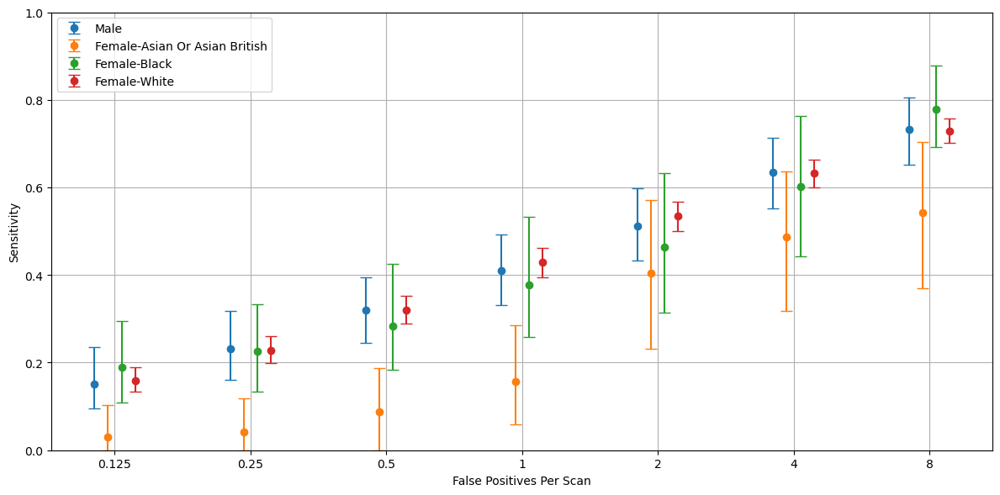

In [126]:
import importlib
import utils

importlib.reload(utils)

flavour = 'female_only_for_inference'

grt123_female_white_inference_string = """
idx	fps	mean_sens	low_sens	high_sens
0	0.125	0.159	0.133	0.190
159	0.250	0.228	0.199	0.261
476	0.500	0.320	0.289	0.352
1111	1.000	0.429	0.394	0.462
2381	2.000	0.534	0.501	0.568
4920	4.000	0.632	0.600	0.664
9999	8.000	0.728	0.701	0.758
"""

grt123_female_black_inference_string = """
idx	fps	mean_sens	low_sens	high_sens
0	0.125	0.189	0.108	0.294
159	0.250	0.226	0.133	0.333
476	0.500	0.283	0.183	0.426
1111	1.000	0.378	0.258	0.532
2381	2.000	0.463	0.315	0.633
4920	4.000	0.602	0.443	0.763
9999	8.000	0.778	0.692	0.878
"""

grt123_female_asian_inference_string = """
idx	fps	mean_sens	low_sens	high_sens
0	0.125	0.031	0.000	0.103
159	0.250	0.042	0.000	0.118
476	0.500	0.087	0.000	0.188
1111	1.000	0.156	0.059	0.286
2381	2.000	0.405	0.231	0.571
4920	4.000	0.487	0.317	0.636
9999	8.000	0.542	0.370	0.704
"""

grt123_male_inference_string = """
idx	fps	mean_sens	low_sens	high_sens
0	0.125	0.151	0.095	0.235
159	0.250	0.231	0.161	0.317
476	0.500	0.319	0.246	0.395
1111	1.000	0.410	0.331	0.493
2381	2.000	0.511	0.433	0.598
4920	4.000	0.634	0.552	0.713
9999	8.000	0.732	0.652	0.805
"""

def cdf(string):
    lines = string.strip().split('\n')
    data = [line.split() for line in lines]
    return pd.DataFrame(data[1:], columns=data[0])


sensitivity_data = {}
sensitivity_data['Male'] = cdf(grt123_male_inference_string).astype(float).set_index('fps')
sensitivity_data['Female-Asian Or Asian British'] = cdf(grt123_female_asian_inference_string).astype(float).set_index('fps')
sensitivity_data['Female-Black'] = cdf(grt123_female_black_inference_string).astype(float).set_index('fps')
sensitivity_data['Female-White'] = cdf(grt123_female_white_inference_string).astype(float).set_index('fps')

utils.display_plots_with_error_bars('grt123', flavour, 'Gender, Split By Ethnic Group', sensitivity_data)

                                    

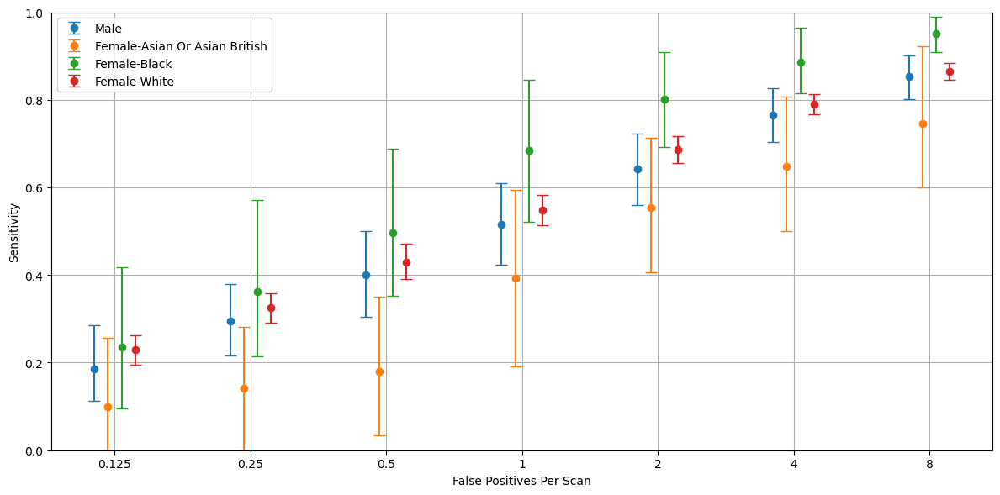

In [127]:
detect_female_white_inference_string = """
idx fps	mean_sens	low_sens	high_sens
0	0.125	0.230	0.195	0.263
159	0.250	0.326	0.292	0.358
476	0.500	0.430	0.390	0.471
1111	1.000	0.549	0.514	0.583
2381	2.000	0.686	0.655	0.717
4920	4.000	0.789	0.766	0.813
9999	8.000	0.865	0.845	0.884
"""

detect_female_black_inference_string = """
idx fps	mean_sens	low_sens	high_sens
0	0.125	0.235	0.096	0.417
159	0.250	0.363	0.214	0.572
476	0.500	0.496	0.353	0.688
1111	1.000	0.685	0.522	0.845
2381	2.000	0.802	0.693	0.909
4920	4.000	0.886	0.815	0.964
9999	8.000	0.951	0.909	0.990
"""

detect_female_asian_inference_string = """
idx	fps	mean_sens	low_sens	high_sens
0	0.125	0.099	0.000	0.257
159	0.250	0.142	0.000	0.281
476	0.500	0.179	0.034	0.351
1111	1.000	0.393	0.192	0.595
2381	2.000	0.553	0.406	0.714
4920	4.000	0.648	0.500	0.808
9999	8.000	0.745	0.600	0.923
"""

detect_male_inference_string = """
idx	fps	mean_sens	low_sens	high_sens
0	0.125	0.186	0.113	0.285
159	0.250	0.294	0.216	0.380
476	0.500	0.400	0.305	0.501
1111	1.000	0.516	0.423	0.610
2381	2.000	0.642	0.559	0.722
4920	4.000	0.765	0.703	0.826
9999	8.000	0.853	0.801	0.902
"""

def cdf(string):
    lines = string.strip().split('\n')
    data = [line.split() for line in lines]
    return pd.DataFrame(data[1:], columns=data[0])


sensitivity_data = {}
sensitivity_data['Male'] = cdf(detect_male_inference_string).astype(float).set_index('fps')
sensitivity_data['Female-Asian Or Asian British'] = cdf(detect_female_asian_inference_string).astype(float).set_index('fps')
sensitivity_data['Female-Black'] = cdf(detect_female_black_inference_string).astype(float).set_index('fps')
sensitivity_data['Female-White'] = cdf(detect_female_white_inference_string).astype(float).set_index('fps')

utils.display_plots_with_error_bars('detect', flavour, 'Gender, Split By Ethnic Group', sensitivity_data)